In [1]:
import numpy as np
from pylab import *
import matplotlib as mpl
import matplotlib.pyplot as plt
from astropy.io import fits as fits
from astropy.wcs import WCS
from astropy.table import Table
from scipy.interpolate import griddata
from photutils.aperture import *
from scipy.ndimage import gaussian_filter
from scipy.spatial import *
from sklearn.neighbors import KDTree
from astropy.table import Table
from astropy.table import vstack as vstack_table

from skimage.restoration import denoise_tv_bregman
from scipy.signal import convolve2d

import naturalneighbor

from astropy.modeling.models import Gaussian2D
from skimage import color, data, restoration
from mpl_toolkits.axes_grid1 import make_axes_locatable

from astropy.modeling import models,fitting
from cmaps_CLC import vel_map

#import _ngl
#from photutils.aperture import aperture_photometry

In [2]:
def do_kdtree_n(X):
    mytree = KDTree(X)    
    dist, ind = mytree.query(X[:1], k=3)
    print(dist,ind)
    return np.array(dist),np.array(ind)

def do_kdtree(combined_x_y_arrays,points,k=1):
    mytree = cKDTree(combined_x_y_arrays)
    dist, indexes = mytree.query(points,k=k)
    return np.array(dist),np.array(indexes)



In [3]:
pt_file="UGC09777.pt"
#pt_file="/home/sanchez/tmp/web_20181105/UGC02225.mos.V500.pt.txt"#UGC02225.mos.V500.pt.txt"
#pt_file="/disk-a/sanchez/ppak/legacy/DATA/SSP/legacy/mos_new.pt.txt"
with open(pt_file) as fp:
    line = fp.readline()
    pt_shape=line.split()
    pt_x=[]
    pt_y=[]
    while line:
        line = fp.readline()
        pt_pos = line.split()
        if (len(pt_pos)>0):
            pt_x.append(float(pt_pos[1]))
            pt_y.append(float(pt_pos[2]))

pt_x=np.array(pt_x)
pt_y=np.array(pt_y)
#print(pt_x,pt_y)
print(len(pt_x))
#print(pt_x)   
points=np.zeros((len(pt_x),2))
points[:,0]=pt_x
points[:,1]=pt_y

993


In [4]:
from scipy.spatial import Delaunay
from scipy.spatial import cKDTree
from scipy.spatial import KDTree
from scipy.spatial import ConvexHull
import itertools

def unique2d(a):
    x, y = a.T
    b = x + y*1.0j 
    idx = np.unique(b,return_index=True)[1]
    return a[idx] 

def areaPoly(points):
    area = 0
    nPoints = len(points)
    j = nPoints - 1
    i = 0
    for point in points:
        p1 = points[i]
        p2 = points[j]
        area += (p1[0]*p2[1])
        area -= (p1[1]*p2[0])
        j = i
        i += 1

    area /= 2
    return area

def centroidPoly(points):
    nPoints = len(points)
    x = 0
    y = 0
    j = nPoints - 1
    i = 0

    for point in points:
        p1 = points[i]
        p2 = points[j]
        f = p1[0]*p2[1] - p2[0]*p1[1]
        x += (p1[0] + p2[0])*f
        y += (p1[1] + p2[1])*f
        j = i
        i += 1

    area = areaPoly(hull_points)
    f = area*6
    return [x/f, y/f]


In [5]:
from matplotlib import rcParams as rc
rc.update({'font.size': 20,\
           'font.weight': 900,\
           'text.usetex': True,\
           'path.simplify'           :   True,\
           'xtick.labelsize' : 20,\
           'ytick.labelsize' : 20,\
#           'xtick.major.size' : 3.5,\
#           'ytick.major.size' : 3.5,\
           'axes.linewidth'  : 2.0,\
               # Increase the tick-mark lengths (defaults are 4 and 2)
           'xtick.major.size'        :   6,\
           'ytick.major.size'        :   6,\
           'xtick.minor.size'        :   3,\
           'ytick.minor.size'        :   3,\
           'xtick.major.width'       :   1,\
           'ytick.major.width'       :   1,\
           'lines.markeredgewidth'   :   1,\
           'legend.numpoints'        :   1,\
           'xtick.minor.width'       :   1,\
           'ytick.minor.width'       :   1,\
           'legend.frameon'          :   False,\
           'legend.handletextpad'    :   0.3,\
           'font.family'    :   'serif',\
           'mathtext.fontset'        :   'stix',\
           'axes.facecolor' : "w",\
           
          })


In [6]:
def Gaussian2D_map(nx,ny,A,xc,yc,sigma_x,sigma_y,theta=0):
    xi = np.arange(0,nx)
    yi = np.arange(0,ny)
    xi,yi = np.meshgrid(xi,yi)    
    img = Gaussian2D(A, xc, yc, sigma_x, sigma_y, theta=theta)(xi, yi)
    return img

def deconv_img(img_center,aper_center,FWHM_input=1,slope=0.75,smooth=0,num_iter=10,filter_epsilon=0.00005):
    sigma_FWHM=FWHM_input/pix_size/2.354
    (ny,nx)=img_center.shape
    img_Gauss=Gaussian2D_map(nx,ny,1,nx*0.5,ny*0.5,sigma_FWHM,sigma_FWHM,0)
    phot_Gauss = aperture_photometry(img_Gauss, aper_center,\
                                           method='subpixel',subpixels=5)
    img_Gauss_r,weights_Gauss_r = inter_map_IDW(phot_Gauss,radius,[0,0],[1,1],[nx,ny],slope=slope,\
                                                radius_limit=0.5*5/pix_size)
    img_psf_r = img_Gauss_r[int(0.4*ny):int(0.6*ny),int(0.4*nx):int(0.6*nx)]
    img_loop_in = img_center+img_center.max() * 1E-5 * np.random.random(img_center.shape)
    img_loop_dec = restoration.richardson_lucy(img_loop_in, img_psf_r,num_iter, filter_epsilon=filter_epsilon)#, num_iter=30)
    if (smooth==1):
        img_loop_dec = gaussian_filter(img_loop_dec,sigma=FWHM_input/pix_size/2.354)#*np.sum(img_Gauss)
    flux_ratio = np.sum(img_center)/np.sum(img_loop_dec)
    img_loop_dec = img_loop_dec*flux_ratio
    img_loop_dec[img_center==0]=0
    return img_loop_dec

1.34


<ipython-input-7-c35b6eff5c5b>:6: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  ax.add_patch(plt.Circle((point[0],point[1]), radius=float(pt_shape[1]), edgecolor='black',color='blue', alpha=0.6))


(-5.0, 5.0)

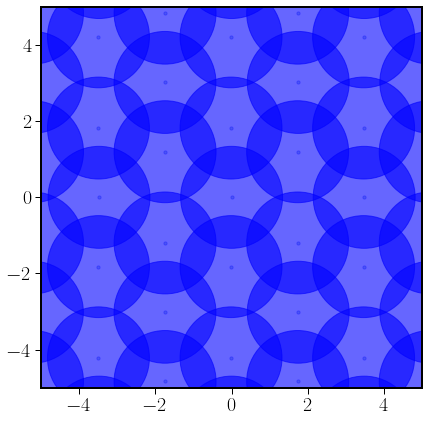

In [7]:
fig = plt.figure(figsize=(7,7))
ax = fig.add_subplot(111)
print(pt_shape[1])
for indx,point in enumerate(points):
#    color='blue'
    ax.add_patch(plt.Circle((point[0],point[1]), radius=float(pt_shape[1]), edgecolor='black',color='blue', alpha=0.6))
ax.scatter(pt_x,pt_y,s=10,edgecolor='blue',alpha=0.3)
ax.set_aspect('equal', adjustable='box')
ax.set_xlim(-45,45)
ax.set_ylim(-45,45)

ax.set_xlim(-5,5)
ax.set_ylim(-5,5)

1.34


<ipython-input-8-fbd892bbb7e2>:6: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  ax.add_patch(plt.Circle((point[0],point[1]), radius=float(pt_shape[1]), edgecolor='black',color='blue', alpha=0.6))


(-42.0, 42.0)

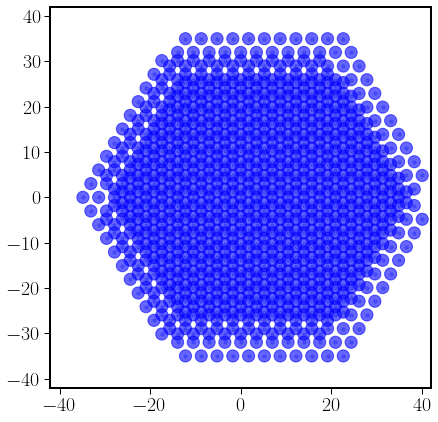

In [8]:
fig = plt.figure(figsize=(7,7))
ax = fig.add_subplot(111)
print(pt_shape[1])
for indx,point in enumerate(points):
#    color='blue'
    ax.add_patch(plt.Circle((point[0],point[1]), radius=float(pt_shape[1]), edgecolor='black',color='blue', alpha=0.6))
ax.scatter(pt_x,pt_y,s=10,edgecolor='blue',alpha=0.3)
ax.set_aspect('equal', adjustable='box')
ax.set_xlim(-42,42)
ax.set_ylim(-42,42)

#ax.set_xlim(-5,5)
#ax.set_ylim(-5,5)

1.34


<ipython-input-9-cf4ba1b5424d>:6: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  ax[0].add_patch(plt.Circle((point[0],point[1]), radius=float(pt_shape[1]), edgecolor='black',color='blue', alpha=0.6))
<ipython-input-9-cf4ba1b5424d>:14: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  ax[1].add_patch(plt.Circle((point[0],point[1]), radius=float(pt_shape[1]), edgecolor='black',color='blue', alpha=0.6))


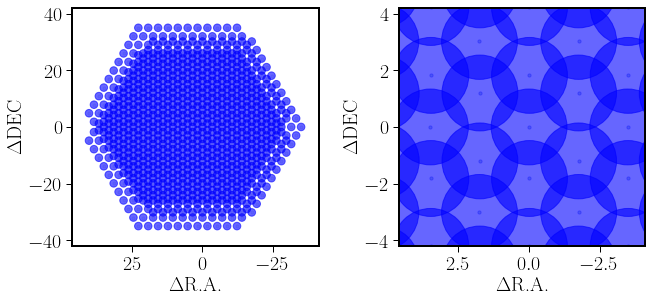

In [9]:
fig,ax = plt.subplots(1,2,figsize=(9.5,4.5))
#ax = fig.add_subplot(111)
print(pt_shape[1])
for indx,point in enumerate(points):
#    color='blue'
    ax[0].add_patch(plt.Circle((point[0],point[1]), radius=float(pt_shape[1]), edgecolor='black',color='blue', alpha=0.6))
ax[0].scatter(pt_x,pt_y,s=10,edgecolor='blue',alpha=0.1)
ax[0].set_aspect('equal', adjustable='box')
ax[0].set_xlim(46,-41)
ax[0].set_ylim(-42,42)

for indx,point in enumerate(points):
#    color='blue'
    ax[1].add_patch(plt.Circle((point[0],point[1]), radius=float(pt_shape[1]), edgecolor='black',color='blue', alpha=0.6))
ax[1].scatter(pt_x,pt_y,s=10,edgecolor='blue',alpha=0.3)
ax[1].set_aspect('equal', adjustable='box')
ax[1].set_xlim(4.6,-4.1)
ax[1].set_ylim(-4.2,4.2)


for ax_now in ax:
    ax_now.set_xlabel(r'$\Delta$R.A.')
    ax_now.set_ylabel(r'$\Delta$DEC')


fig.tight_layout()

fig.savefig("dither.pdf", transparent=False, facecolor='white', edgecolor='white')#.pdf")



#plt.show()

#ax.set_xlim(-5,5)
#ax.set_ylim(-5,5)

this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
<ipython-input-10-a0f398d31f48>:17: RuntimeWarning: invalid value encountered in log10
  ax.imshow(np.log10(hdu.data), cmap='gray_r', vmin=-3, vmax=0.15, origin='lower')#imshow(hdu.data, origin='lower')


DONE


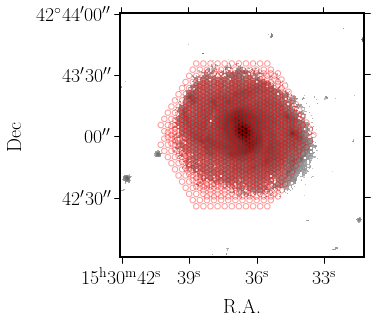

In [10]:
filename = 'NGC5947_PS_warp_r.fits'#NGC5947_PS_g.fits'
hdu = fits.open(filename)[0]





wcs = WCS(hdu.header)
fig,ax = plt.subplots(figsize=(10,4.5))
ax=plt.subplot(projection=wcs)
pix_size=np.abs(wcs.wcs.cdelt[1]*3600)
#pix_rat = np.abs(wcs.wcs.cdelt[0]*3600)
EXPTIME = hdu.header['EXPTIME']
ww_now=4866
f_ratio = 2*((10**(-6.64))/EXPTIME)*(((1e-23)*(3e18))/ww_now**2)*1e16/pix_size**2
hdu.data=hdu.data*f_ratio
ax.imshow(np.log10(hdu.data), cmap='gray_r', vmin=-3, vmax=0.15, origin='lower')#imshow(hdu.data, origin='lower')
(ny,nx)=hdu.data.shape
#ax.scatter(232.652436800918,42.7171665852056, transform=ax.get_transform('fk5'), s=50,
#            edgecolor='white', facecolor='none')

points_WCS=np.zeros((len(pt_x),2))

points_WCS[:,0]=nx/2-pt_x/(wcs.wcs.cdelt[0]*3600)
points_WCS[:,1]=ny/2+pt_y/(wcs.wcs.cdelt[1]*3600)
#print(points_WCS)
#print(pt_shape[1])
radius=float(pt_shape[1])/pix_size
#print('radius=',radius)
#print(nx,ny)
for indx,point in enumerate(points_WCS):
#    color='blue'
    ax.add_patch(plt.Circle((point[0],point[1]), radius=radius,\
                            edgecolor='red',facecolor='none', alpha=0.4))



plt.xlabel('R.A.')
plt.ylabel('Dec')
print("DONE")


In [11]:
aper = CircularAperture(points_WCS, radius)
phot_table = aperture_photometry(hdu.data, aper, method='subpixel',subpixels=5)
#print(hdu.data.shape)


In [12]:
print(phot_table)

 id      xcenter            ycenter          aperture_sum   
           pix                pix                           
--- ------------------ ------------------ ------------------
  1 184.25600134980652              240.0  6.384550815224647
  2  302.7477318139356  227.9221336257914  7.442170438468456
  3              240.0  191.6885345031655   8.55251767009497
  4 184.25600134980652  191.6885345031655  3.195504847727716
  5  295.7439986501935  191.6885345031655  8.001836836338043
  6  198.1920010123549 215.84426725158283  9.533854553103446
  7 267.87199932509674 167.60426841968476  4.309615659490228
  8 212.12800067490326 167.60426841968476  3.034473251327872
  9 170.32000168725813 215.84426725158283  7.400302954763174
 10   274.875732488839 203.76640087737422   8.69778393626213
...                ...                ...                ...
984  253.9957329944353  256.8735995914162  26.68391286075115
985  198.1802676793058  280.9578656748974  7.799070431739092
986 156.37226869166068 2

<ipython-input-13-84fd5b288e05>:3: RuntimeWarning: invalid value encountered in log10
  ax[0].imshow(np.log10(hdu.data), cmap='gray_r', vmin=-3, vmax=0.15, origin='lower')
<ipython-input-13-84fd5b288e05>:5: RuntimeWarning: invalid value encountered in log10
  ax[1].imshow(np.log10(hdu.data), cmap='gray_r', vmin=-3, vmax=-3, origin='lower')
<ipython-input-13-84fd5b288e05>:7: RuntimeWarning: invalid value encountered in log10
  ax[1].scatter(phot_table['xcenter'],phot_table['ycenter'],c=np.log10(phot_table['aperture_sum']/(np.pi*radius**2)),\


(96.0, 384.0)

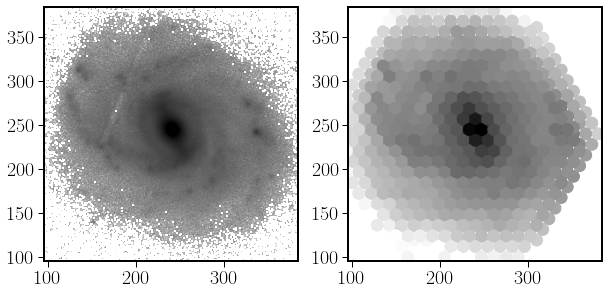

In [13]:
fig,ax = plt.subplots(1,2,figsize=(10,8))
plt.subplot(ax[0],projection=wcs)
ax[0].imshow(np.log10(hdu.data), cmap='gray_r', vmin=-3, vmax=0.15, origin='lower')
plt.subplot(ax[1],projection=wcs)
ax[1].imshow(np.log10(hdu.data), cmap='gray_r', vmin=-3, vmax=-3, origin='lower')
cm = plt.cm.get_cmap('Greys')
ax[1].scatter(phot_table['xcenter'],phot_table['ycenter'],c=np.log10(phot_table['aperture_sum']/(np.pi*radius**2)),\
              cmap=cm, vmin=-3, vmax=0.15,\
             s=140)

ax[0].set_xlim([0.2*nx,0.8*nx])
ax[0].set_ylim([0.2*ny,0.8*ny])

ax[1].set_xlim([0.2*nx,0.8*nx])
ax[1].set_ylim([0.2*ny,0.8*ny])

#ax[1].set_xlim(ax[0].get_xlim())
#ax[1].set_ylim(ax[1].get_ylim())

#ax[1].imshow(np.log10(hdu.data), cmap='gray_r', vmin=-3, vmax=0.15, origin='lower')


#ax[1]


In [14]:
#print(len(phot_table_final['radius']))

In [15]:
def inter_map_IDW(phot_table_in,radius,crpix,cdelt,dim,\
                  mode='inverseDistance', sigma=1.0, radius_limit=5, \
                  resolution=1.0, min_fibers=3, slope=2.0, bad_threshold=0.1):
    phot_table=phot_table_in.copy()
    img = np.zeros(dim,dtype=np.float32)
    weights = np.zeros(img.shape, dtype=np.float32)
    xi = crpix[0]+cdelt[0]*np.arange(0,dim[0])
    yi = crpix[1]+cdelt[1]*np.arange(0,dim[1])
    xi,yi = np.meshgrid(xi,yi)
    phot_table['aperture_sum']=phot_table['aperture_sum']/(np.pi*radius**2)
    for phot_now in phot_table:
        if (phot_now['aperture_sum']>0):
            dist = np.sqrt((phot_now['xcenter'].value-xi)**2+(phot_now['ycenter'].value-yi)**2)
            weights_0= np.exp(-0.5*np.power(dist/sigma,slope))
            weights_0[dist>radius_limit]=0
            img_0 = weights_0*phot_now['aperture_sum']#/(np.pi*radius_now**2)
            img += img_0
            weights += weights_0
            #print(phot_now['aperture_sum'],np.max(img_0),np.max(img))

    mask = (weights>0)  
    img[mask]=img[mask]/weights[mask]
#    img=gaussian_filter(img, sigma=0.25*resolution)
    return img,weights
    
def inter_map(phot_table_in,radius,crpix,cdelt,dim,method='cubic'):
    phot_table=phot_table_in.copy()
    xi = crpix[0]+cdelt[0]*np.arange(0,dim[0])
    yi = crpix[1]+cdelt[1]*np.arange(0,dim[1])
    xi,yi = np.meshgrid(xi,yi)
    phot_table['aperture_sum']=phot_table['aperture_sum']/(np.pi*radius**2)
    img = griddata((phot_table['xcenter'].value, phot_table['ycenter'].value),\
                   phot_table['aperture_sum'].value, (xi, yi),method=method)
    img=gaussian_filter(img, sigma=0.25)
    return img


#  linear_interp = scipy.interpolate.griddata(known_points, known_values, tuple(grid), method='linear')

#    nn_interp = naturalneighbor.griddata(known_points, known_values, grid_ranges)




def bilinear_interpolation(x,y,x_,y_,val):

    a = 1 /((x_[1] - x_[0]) * (y_[1] - y_[0]))
    xx = np.array([[x_[1]-x],[x-x_[0]]],dtype='float32')
    f = np.array(val).reshape(2,2)
    yy = np.array([[y_[1]-y],[y-y_[0]]],dtype='float32')
    b = np.matmul(f,yy)

    return a * np.matmul(xx.T, b)        

In [16]:
img,weights = inter_map_IDW(phot_table,radius,[0,0],[1,1],[480,480],slope=1.0,sigma=0.75/pix_size,\
                            radius_limit=3.5/pix_size)
#img_map = inter_map(phot_table,radius,[0,0],[1,1],[480,480],method='cubic')

In [17]:
img_map = inter_map(phot_table,radius,[0,0],[1,1],[480,480],method='cubic')

#interpolate.interp2d(x, y, z, kind='cubic')



In [18]:
img_v22=np.copy(img)
img_v23,weights_v23 = inter_map_IDW(phot_table,radius,[0,0],[1,1],[480,480],slope=1.25,sigma=0.5/pix_size,\
                            radius_limit=2.0/pix_size)



In [19]:
img_v23s,weights_v23s = inter_map_IDW(phot_table,radius,[0,0],[1,1],[480,480],slope=3,sigma=0.25/pix_size,\
                            radius_limit=2.0/pix_size)


In [20]:
def plot_three(img_in,img_now,res):
    fig,ax = plt.subplots(1,3,figsize=(10,8))
    plt.subplot(ax[0],projection=wcs)
    ax[0].imshow(np.log10(img_in), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')
    plt.subplot(ax[1],projection=wcs)
    ax[1].imshow(np.log10(img_now), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')
    plt.subplot(ax[2],projection=wcs)
    std=np.nanstd(res)
    im=ax[2].imshow(res/img_in, cmap='coolwarm', vmin=-1, vmax=1, origin='lower')


    ax[0].set_xlim([0.2*nx,0.8*nx])
    ax[0].set_ylim([0.2*ny,0.8*ny])

    ax[1].set_xlim([0.2*nx,0.8*nx])
    ax[1].set_ylim([0.2*ny,0.8*ny])

    ax[2].set_xlim([0.2*nx,0.8*nx])
    ax[2].set_ylim([0.2*ny,0.8*ny])
    divider = make_axes_locatable(ax[2])
    cax = divider.append_axes("right", size="5%", pad=0.05)
    plt.colorbar(im,cax=cax)
#    plt.tight_layout()
    plt.show()


def get_FWHM_conv(img_test,img_ref,FWHM_ref_arc=1,pix_size=1,plot=0,sigma_min=0.25):
    diff_min=1e12
    for sigma in arange(0.2,10,0.1):
        s_img = gaussian_filter(hdu.data,sigma=sigma)
        diff = img_test-s_img
        d=img_test.shape
        mean_diff = np.sum(np.abs(diff[img_test>0]/img_test[img_test>0])**2)/(d[0]*d[1])
        if (mean_diff<diff_min):
            diff_min=mean_diff
            sigma_min=sigma
    FWHM_PS = FWHM_ref_arc
    FWHM_final = np.sqrt(FWHM_PS**2+sigma_min*pix_size*2.354)
    print('sigma_min_pix=',sigma_min,', sigma_min_arc=',sigma_min*pix_size)
    print('Final FWHM [arcsec] = ', FWHM_final)
    if (plot==1):
        s_img = gaussian_filter(hdu.data,sigma=sigma_min)
        plot_three(s_img,img_test,s_img-img_test)
    return FWHM_final,sigma_min,s_img/img_test

sigma_min_pix= 2.700000000000001 , sigma_min_arc= 0.6750000163447086
Final FWHM [arcsec] =  1.6090214537026672


<ipython-input-20-ae5863308741>:4: RuntimeWarning: invalid value encountered in log10
  ax[0].imshow(np.log10(img_in), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')
<ipython-input-20-ae5863308741>:6: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_now), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')


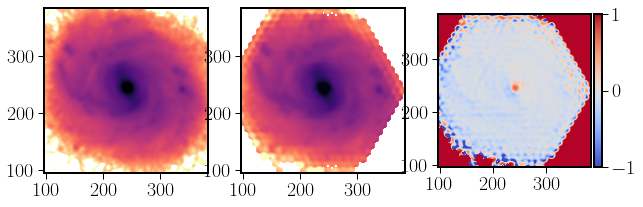

<ipython-input-20-ae5863308741>:44: RuntimeWarning: divide by zero encountered in true_divide
  return FWHM_final,sigma_min,s_img/img_test
<ipython-input-21-e4a21c442e93>:4: RuntimeWarning: invalid value encountered in multiply
  img_v23_matched=img_v23_dec*rat_img


In [21]:
#img_v23_dec = deconv_img(img_v23,aper,FWHM_input=0.75,slope=1.25,num_iter=10)
img_v23_dec = deconv_img(img_v23,aper,FWHM_input=0.5,slope=1.25,num_iter=4)
fwhm_now,sigma_min,rat_img = get_FWHM_conv(img_v23_dec,hdu.data,FWHM_ref_arc=1.0,pix_size=pix_size,plot=1,sigma_min=0.15)
img_v23_matched=img_v23_dec*rat_img


In [23]:
img_v23_test = deconv_img(img_v23,aper,FWHM_input=0.5,slope=1.25,num_iter=50)

<ipython-input-25-a7b16477e1b1>:8: RuntimeWarning: invalid value encountered in log10
  i=ax[0][0].imshow(np.log10(hdu.data), cmap=cm, vmin=-3, vmax=0.15, origin='lower')#,label='PS r-band')
<ipython-input-25-a7b16477e1b1>:11: RuntimeWarning: invalid value encountered in log10
  ax[0][1].imshow(np.log10(hdu.data), cmap=cm, vmin=-3, vmax=-3, origin='lower')
<ipython-input-25-a7b16477e1b1>:13: RuntimeWarning: invalid value encountered in log10
  c=np.log10(phot_table['aperture_sum']/(np.pi*radius**2)),\
<ipython-input-25-a7b16477e1b1>:18: RuntimeWarning: divide by zero encountered in log10
  i=ax[0][2].imshow(np.log10(img_v22), cmap=cm, vmin=-3, vmax=0.15, origin='lower')#,label=r'$\sigma$=0.75;$\alpha$=1.0,v2.2')
<ipython-input-25-a7b16477e1b1>:23: RuntimeWarning: divide by zero encountered in log10
  i=ax[0][3].imshow(np.log10(img_v23s), cmap=cm, vmin=-3-f_scale, vmax=0.15-f_scale, origin='lower')
<ipython-input-25-a7b16477e1b1>:28: RuntimeWarning: divide by zero encountered in log10
 

0.8891261528586125


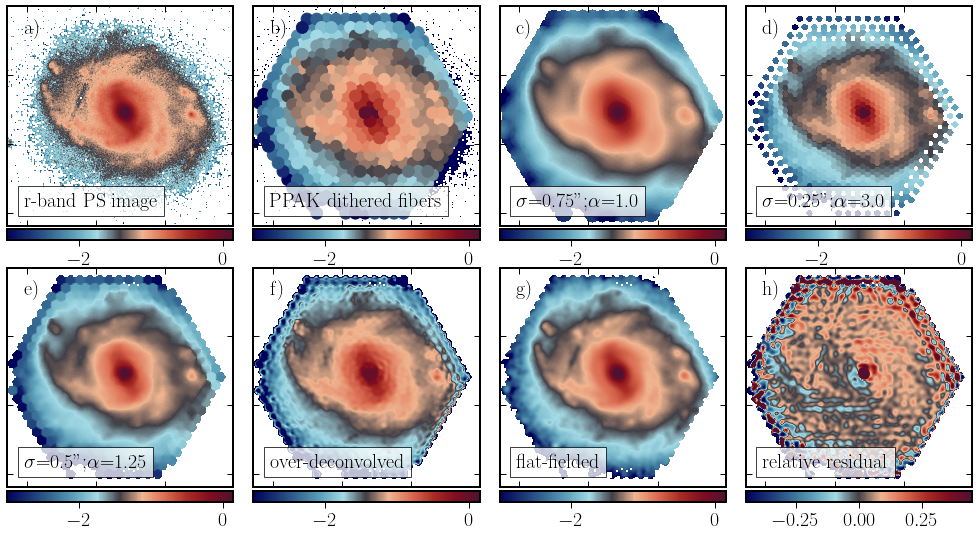

In [25]:
fig,ax = plt.subplots(2,4,figsize=(14,8))
plt.subplot(ax[0][0],projection=wcs)
#cm = plt.cm.get_cmap('Greys')
cm =vel_map()  #plt.cm.get_cmap('magma_r')

images=[]

i=ax[0][0].imshow(np.log10(hdu.data), cmap=cm, vmin=-3, vmax=0.15, origin='lower')#,label='PS r-band')
plt.subplot(ax[0][1],projection=wcs)
images.append(i)
ax[0][1].imshow(np.log10(hdu.data), cmap=cm, vmin=-3, vmax=-3, origin='lower')
i=ax[0][1].scatter(phot_table['xcenter'],phot_table['ycenter'],\
                 c=np.log10(phot_table['aperture_sum']/(np.pi*radius**2)),\
              cmap=cm, vmin=-3, vmax=0.15,\
             s=140)#,label='PPAK dither')
images.append(i)
plt.subplot(ax[0][2],projection=wcs)
i=ax[0][2].imshow(np.log10(img_v22), cmap=cm, vmin=-3, vmax=0.15, origin='lower')#,label=r'$\sigma$=0.75;$\alpha$=1.0,v2.2')
images.append(i)

f_scale=np.log10(hdu.data[250,250]/img_v23s[250,250])
plt.subplot(ax[0][3],projection=wcs)
i=ax[0][3].imshow(np.log10(img_v23s), cmap=cm, vmin=-3-f_scale, vmax=0.15-f_scale, origin='lower')
images.append(i)

f_scale=np.log10(hdu.data[250,250]/img_v23[250,250])
plt.subplot(ax[1][0],projection=wcs)
i=ax[1][0].imshow(np.log10(img_v23), cmap=cm, vmin=-3-f_scale, vmax=0.15-f_scale, origin='lower')
images.append(i)

f_scale=np.log10(hdu.data[250,250]/img_v23_dec[250,250])
plt.subplot(ax[1][1],projection=wcs)
i=ax[1][1].imshow(np.log10(img_v23_test), cmap=cm, vmin=-3-f_scale, vmax=0.15-f_scale, origin='lower')
images.append(i)

f_scale=np.log10(hdu.data[250,250]/img_v23_matched[250,250])
plt.subplot(ax[1][2],projection=wcs)
i=ax[1][2].imshow(np.log10(img_v23_matched), cmap=cm, vmin=-3-f_scale, vmax=0.15-f_scale, origin='lower')
images.append(i)

plt.subplot(ax[1][3],projection=wcs)

mr=np.nanmedian(rat_img)
print(mr)
i=ax[1][3].imshow(rat_img/mr-1, cmap=cm, vmin=-0.45, vmax=0.45, origin='lower')
images.append(i)

label=['r-band PS image','PPAK dithered fibers',r'$\sigma$=0.75";$\alpha$=1.0',\
       r'$\sigma$=0.25";$\alpha$=3.0',\
       r'$\sigma$=0.5";$\alpha$=1.25',\
       'over-deconvolved','flat-fielded','relative residual']
lab=['a','b','c','d','e','f','g','h']
props = dict(boxstyle='square', facecolor='white', alpha=0.75)
I=0
for label_now,ax_now in zip(label,ax.flat):
    ax_now.set_xlim([0.15*nx,0.83*nx])
    ax_now.set_ylim([0.17*ny,0.83*ny])
    ax_now.tick_params(right=True, top=True, labelright=True, labeltop=True, labelrotation=0)

    plt.setp(ax_now.get_xticklabels(), visible=False)
    plt.setp(ax_now.get_yticklabels(), visible=False)
    ax_now.tick_params(axis="y",direction="in", pad=-22)
    ax_now.tick_params(axis="x",direction="in", pad=-15)
    ax_now.text(0.2*nx,0.23*ny,label_now, bbox=props)
    ax_now.text(0.2*nx,0.75*ny,f'{lab[I]})')
#    print(I)
    if (I<7):
        divider = make_axes_locatable(ax_now)
        cax = divider.append_axes('bottom', size='5%', pad=0.05)
        fig.colorbar(images[0],cax=cax, orientation='horizontal');
    I=I+1

#left, width = 0.81, 0.15
#bottom, height = 0.3, 0.002

#rect_histx = [left+0.05*(width), bottom + 0.05*height, width, bottom+0.95*height]
#ax_histx = fig.add_axes(rect_histx)    
    
divider = make_axes_locatable(ax_now)
cax = divider.append_axes('bottom', size='5%', pad=0.05)
fig.colorbar(i,cax=cax, orientation='horizontal');
    #ax_now.legend(handles=[img])
fig.tight_layout(h_pad=0.0,w_pad=0.25)
fig.savefig("img_rec.pdf", transparent=False, facecolor='white', edgecolor='white')#.pdf")

<ipython-input-28-4f93a60baa25>:8: RuntimeWarning: invalid value encountered in log10
  i=ax[0][0].imshow(np.log10(hdu.data), cmap=cm, vmin=-3, vmax=0.15, origin='lower')#,label='PS r-band')
<ipython-input-28-4f93a60baa25>:11: RuntimeWarning: invalid value encountered in log10
  ax[0][1].imshow(np.log10(hdu.data), cmap=cm, vmin=-3, vmax=-3, origin='lower')
<ipython-input-28-4f93a60baa25>:13: RuntimeWarning: invalid value encountered in log10
  c=np.log10(phot_table['aperture_sum']/(np.pi*radius**2)),\
<ipython-input-28-4f93a60baa25>:18: RuntimeWarning: divide by zero encountered in log10
  i=ax[0][2].imshow(np.log10(img_v22), cmap=cm, vmin=-3, vmax=0.15, origin='lower')#,label=r'$\sigma$=0.75;$\alpha$=1.0,v2.2')
<ipython-input-28-4f93a60baa25>:23: RuntimeWarning: divide by zero encountered in log10
  i=ax[0][3].imshow(np.log10(img_v23s), cmap=cm, vmin=-3-f_scale, vmax=0.15-f_scale, origin='lower')
<ipython-input-28-4f93a60baa25>:28: RuntimeWarning: divide by zero encountered in log10
 

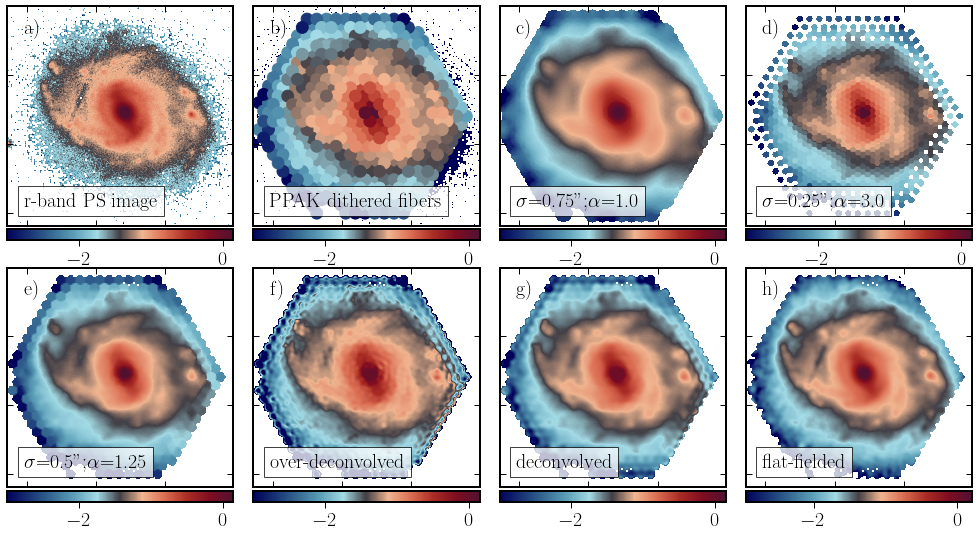

In [28]:
fig,ax = plt.subplots(2,4,figsize=(14,8))
plt.subplot(ax[0][0],projection=wcs)
#cm = plt.cm.get_cmap('Greys')
cm =vel_map()  #plt.cm.get_cmap('magma_r')

images=[]

i=ax[0][0].imshow(np.log10(hdu.data), cmap=cm, vmin=-3, vmax=0.15, origin='lower')#,label='PS r-band')
plt.subplot(ax[0][1],projection=wcs)
images.append(i)
ax[0][1].imshow(np.log10(hdu.data), cmap=cm, vmin=-3, vmax=-3, origin='lower')
i=ax[0][1].scatter(phot_table['xcenter'],phot_table['ycenter'],\
                 c=np.log10(phot_table['aperture_sum']/(np.pi*radius**2)),\
              cmap=cm, vmin=-3, vmax=0.15,\
             s=140)#,label='PPAK dither')
images.append(i)
plt.subplot(ax[0][2],projection=wcs)
i=ax[0][2].imshow(np.log10(img_v22), cmap=cm, vmin=-3, vmax=0.15, origin='lower')#,label=r'$\sigma$=0.75;$\alpha$=1.0,v2.2')
images.append(i)

f_scale=np.log10(hdu.data[250,250]/img_v23s[250,250])
plt.subplot(ax[0][3],projection=wcs)
i=ax[0][3].imshow(np.log10(img_v23s), cmap=cm, vmin=-3-f_scale, vmax=0.15-f_scale, origin='lower')
images.append(i)

f_scale=np.log10(hdu.data[250,250]/img_v23[250,250])
plt.subplot(ax[1][0],projection=wcs)
i=ax[1][0].imshow(np.log10(img_v23), cmap=cm, vmin=-3-f_scale, vmax=0.15-f_scale, origin='lower')
images.append(i)

f_scale=np.log10(hdu.data[250,250]/img_v23_dec[250,250])
plt.subplot(ax[1][1],projection=wcs)
i=ax[1][1].imshow(np.log10(img_v23_test), cmap=cm, vmin=-3-f_scale, vmax=0.15-f_scale, origin='lower')
images.append(i)

f_scale=np.log10(hdu.data[250,250]/img_v23_matched[250,250])
plt.subplot(ax[1][2],projection=wcs)
i=ax[1][2].imshow(np.log10(img_v23_dec*0.95), cmap=cm, vmin=-3-f_scale, vmax=0.15-f_scale, origin='lower')
images.append(i)


f_scale=np.log10(hdu.data[250,250]/img_v23_matched[250,250])
plt.subplot(ax[1][3],projection=wcs)
i=ax[1][3].imshow(np.log10(img_v23_matched), cmap=cm, vmin=-3-f_scale, vmax=0.15-f_scale, origin='lower')
images.append(i)

#plt.subplot(ax[1][3],projection=wcs)

#mr=np.nanmedian(rat_img)
#print(mr)
#i=ax[1][3].imshow(rat_img/mr-1, cmap=cm, vmin=-0.45, vmax=0.45, origin='lower')
#images.append(i)

label=['r-band PS image','PPAK dithered fibers',r'$\sigma$=0.75";$\alpha$=1.0',\
       r'$\sigma$=0.25";$\alpha$=3.0',\
       r'$\sigma$=0.5";$\alpha$=1.25',\
       'over-deconvolved','deconvolved','flat-fielded']
lab=['a','b','c','d','e','f','g','h']
props = dict(boxstyle='square', facecolor='white', alpha=0.75)
I=0
for label_now,ax_now in zip(label,ax.flat):
    ax_now.set_xlim([0.15*nx,0.83*nx])
    ax_now.set_ylim([0.17*ny,0.83*ny])
    ax_now.tick_params(right=True, top=True, labelright=True, labeltop=True, labelrotation=0)

    plt.setp(ax_now.get_xticklabels(), visible=False)
    plt.setp(ax_now.get_yticklabels(), visible=False)
    ax_now.tick_params(axis="y",direction="in", pad=-22)
    ax_now.tick_params(axis="x",direction="in", pad=-15)
    ax_now.text(0.2*nx,0.23*ny,label_now, bbox=props)
    ax_now.text(0.2*nx,0.75*ny,f'{lab[I]})')
#    print(I)
    if (I<7):
        divider = make_axes_locatable(ax_now)
        cax = divider.append_axes('bottom', size='5%', pad=0.05)
        fig.colorbar(images[0],cax=cax, orientation='horizontal');
    I=I+1

#left, width = 0.81, 0.15
#bottom, height = 0.3, 0.002

#rect_histx = [left+0.05*(width), bottom + 0.05*height, width, bottom+0.95*height]
#ax_histx = fig.add_axes(rect_histx)    
    
divider = make_axes_locatable(ax_now)
cax = divider.append_axes('bottom', size='5%', pad=0.05)
fig.colorbar(i,cax=cax, orientation='horizontal');
    #ax_now.legend(handles=[img])
fig.tight_layout(h_pad=0.0,w_pad=0.25)
fig.savefig("img_rec_2.pdf", transparent=False, facecolor='white', edgecolor='white')#.pdf")

#
# We test the FWHM of the original image...
#

Slope = 0.75
sigma_min_pix= 4.900000000000002 , sigma_min_arc= 1.2250000296626193
Final FWHM [arcsec] =  1.9706978636578987


<ipython-input-20-ae5863308741>:4: RuntimeWarning: invalid value encountered in log10
  ax[0].imshow(np.log10(img_in), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')
<ipython-input-20-ae5863308741>:6: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_now), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')


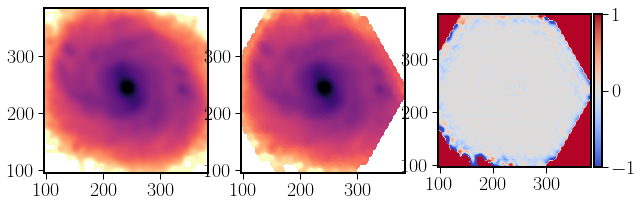

<ipython-input-20-ae5863308741>:44: RuntimeWarning: divide by zero encountered in true_divide
  return FWHM_final,sigma_min,s_img/img_test


Slope = 1.0
sigma_min_pix= 4.800000000000002 , sigma_min_arc= 1.2000000290572597
Final FWHM [arcsec] =  1.9557096073806022


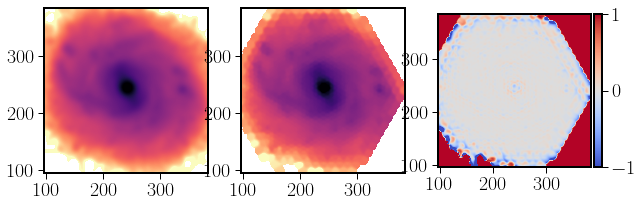

Slope = 1.25
sigma_min_pix= 4.200000000000002 , sigma_min_arc= 1.0500000254251023
Final FWHM [arcsec] =  1.8632498651148994


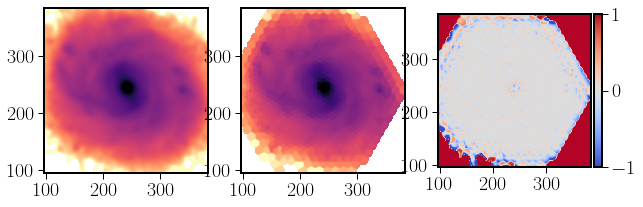

Slope = 1.5
sigma_min_pix= 3.9000000000000012 , sigma_min_arc= 0.9750000236090235
Final FWHM [arcsec] =  1.8152548183590207


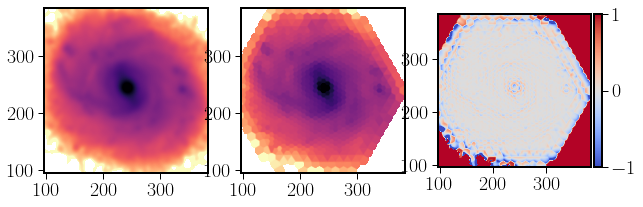

Slope = 1.75
sigma_min_pix= 3.9000000000000012 , sigma_min_arc= 0.9750000236090235
Final FWHM [arcsec] =  1.8152548183590207


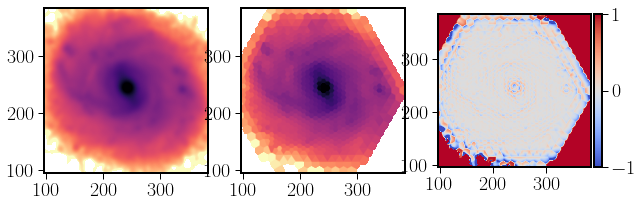

Slope = 2.0
sigma_min_pix= 3.9000000000000012 , sigma_min_arc= 0.9750000236090235
Final FWHM [arcsec] =  1.8152548183590207


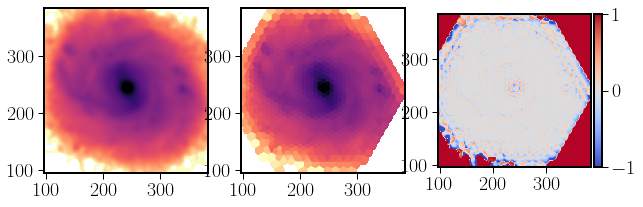

Slope = 2.25
sigma_min_pix= 3.9000000000000012 , sigma_min_arc= 0.9750000236090235
Final FWHM [arcsec] =  1.8152548183590207


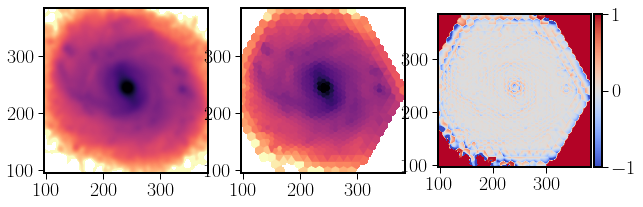

Slope = 2.5
sigma_min_pix= 3.6000000000000014 , sigma_min_arc= 0.9000000217929448
Final FWHM [arcsec] =  1.7659558463621314


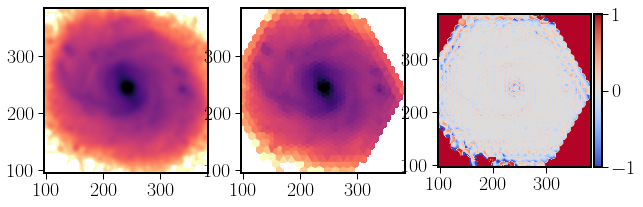

Slope = 2.75
sigma_min_pix= 3.4000000000000012 , sigma_min_arc= 0.8500000205822257
Final FWHM [arcsec] =  1.7323106096917376


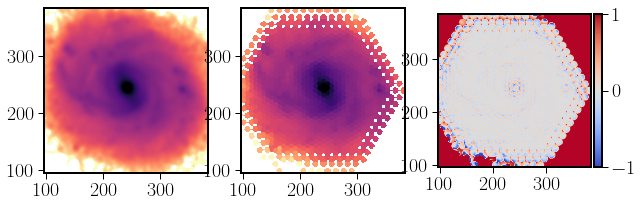

Slope = 3.0
sigma_min_pix= 3.100000000000001 , sigma_min_arc= 0.7750000187661469
Final FWHM [arcsec] =  1.6805802700780197


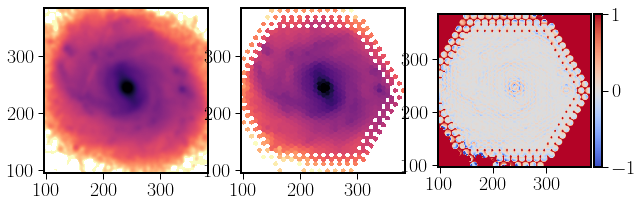

Slope = 3.25
sigma_min_pix= 2.9000000000000012 , sigma_min_arc= 0.7250000175554278
Final FWHM [arcsec] =  1.6451899711964808


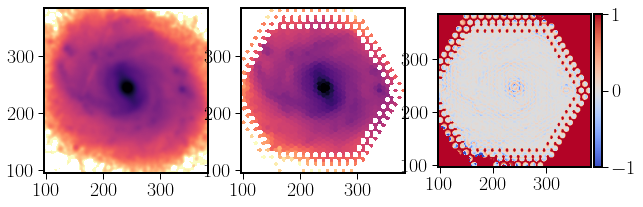

Slope = 3.5
sigma_min_pix= 2.9000000000000012 , sigma_min_arc= 0.7250000175554278
Final FWHM [arcsec] =  1.6451899711964808


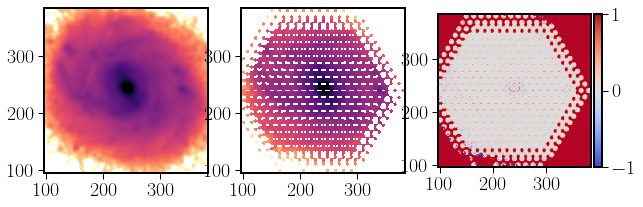

Slope = 3.75
sigma_min_pix= 2.800000000000001 , sigma_min_arc= 0.7000000169500682
Final FWHM [arcsec] =  1.6272062069388935


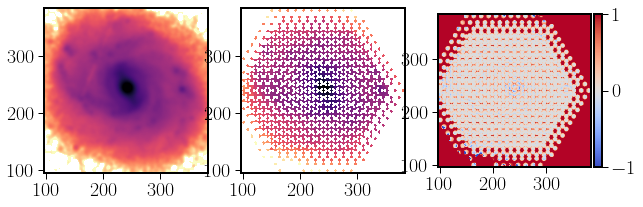

In [29]:
FWHMs=[]
RESs=[]
slopes=arange(0.75,4.0,0.25)
for slope_now in slopes:
    img,weights = inter_map_IDW(phot_table,radius,[0,0],[1,1],[480,480],slope=slope_now,\
                                radius_limit=0.5*radius/pix_size)
    print('Slope =',slope_now)
    fwhm_now,sigma_min,res_rat = get_FWHM_conv(img,hdu.data,FWHM_ref_arc=1,pix_size=pix_size,plot=1)
    FWHMs.append(fwhm_now)
    RESs.append(res_rat)
FWHMs=np.array(FWHMs)
RESs=np.array(RESs)


In [42]:
RES_vals=[]
for RES_maps in RESs:
    mask=np.isfinite(RES_maps)
    sig=np.nanstd(RES_maps[mask])
    RES_vals.append(sig)
RES_vals=np.array(RES_vals)
print(RES_vals)

[0.83417004 0.85976285 1.1570159  1.7211555  2.1523576  2.3504832
 2.5598552  2.6734998  2.3809557  1.9569482  1.6549023  1.4865067
 1.2873678 ]


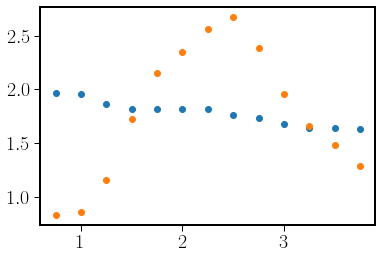

In [43]:
#print(len(slopes),len(FWHMs))
#RES_vals

#RESs_vals=np.nanmean(RESs,axis=0)
#print(len(RESs_vals))
#print(RESs.shape)
plt.scatter(slopes,FWHMs)
plt.scatter(slopes,RES_vals)

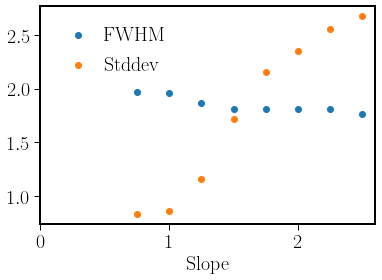

In [155]:
plt.scatter(slopes,FWHMs,label='FWHM')
plt.scatter(slopes,RES_vals,label='Stddev')
plt.xlabel('Slope')
plt.xlim(0,2.6)
ax = plt.gca()
ax.legend()


Sigma = 0.15
sigma_min_pix= 3.8000000000000016 , sigma_min_arc= 0.950000023003664
Final FWHM [arcsec] =  1.798971943680786


<ipython-input-20-ae5863308741>:4: RuntimeWarning: invalid value encountered in log10
  ax[0].imshow(np.log10(img_in), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')
<ipython-input-20-ae5863308741>:6: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_now), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')


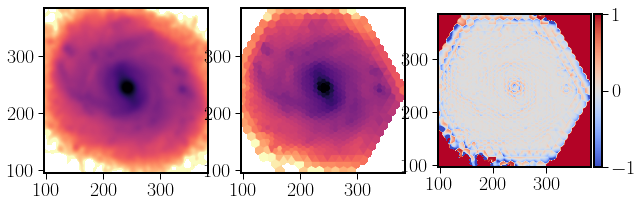

<ipython-input-20-ae5863308741>:44: RuntimeWarning: divide by zero encountered in true_divide
  return FWHM_final,sigma_min,s_img/img_test


Sigma = 0.3
sigma_min_pix= 3.9000000000000012 , sigma_min_arc= 0.9750000236090235
Final FWHM [arcsec] =  1.8152548183590207


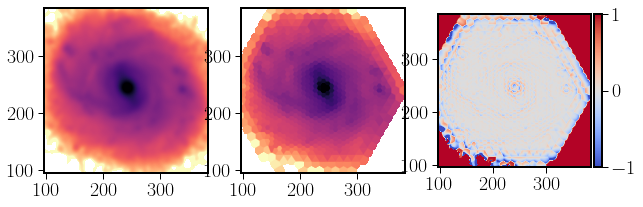

Sigma = 0.44999999999999996
sigma_min_pix= 3.8000000000000016 , sigma_min_arc= 0.950000023003664
Final FWHM [arcsec] =  1.798971943680786


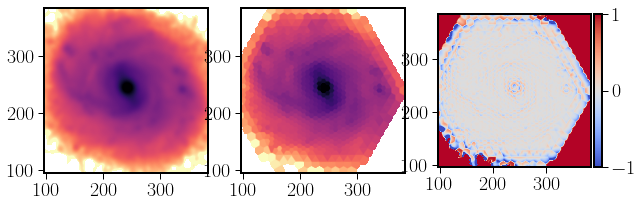

Sigma = 0.6
sigma_min_pix= 3.8000000000000016 , sigma_min_arc= 0.950000023003664
Final FWHM [arcsec] =  1.798971943680786


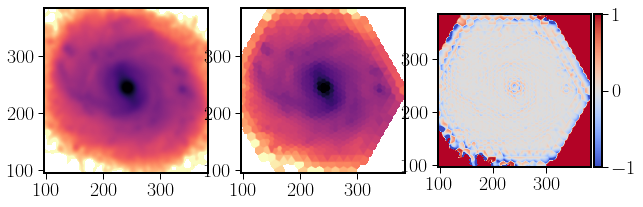

Sigma = 0.75
sigma_min_pix= 3.9000000000000012 , sigma_min_arc= 0.9750000236090235
Final FWHM [arcsec] =  1.8152548183590207


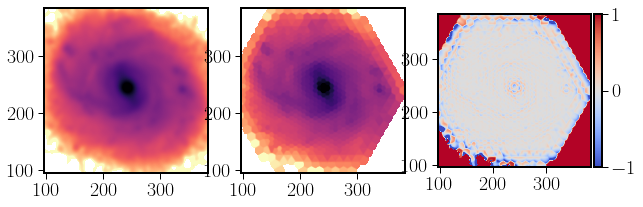

Sigma = 0.9
sigma_min_pix= 4.000000000000001 , sigma_min_arc= 1.000000024214383
Final FWHM [arcsec] =  1.831392928074327


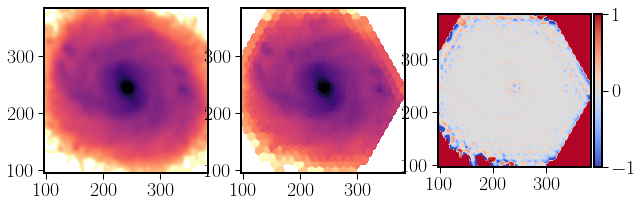

Sigma = 1.0499999999999998
sigma_min_pix= 4.300000000000002 , sigma_min_arc= 1.0750000260304617
Final FWHM [arcsec] =  1.8789758011415971


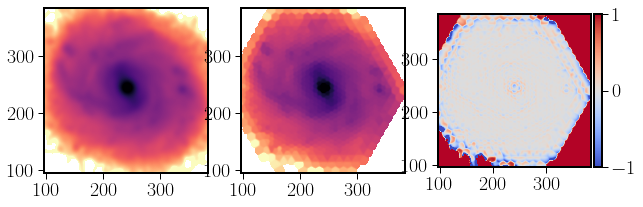

Sigma = 1.2
sigma_min_pix= 4.500000000000002 , sigma_min_arc= 1.125000027241181
Final FWHM [arcsec] =  1.9100392833985746


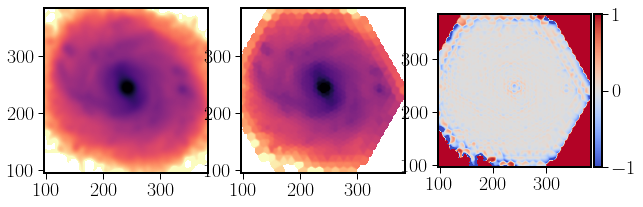

Sigma = 1.3499999999999999
sigma_min_pix= 4.600000000000001 , sigma_min_arc= 1.1500000278465405
Final FWHM [arcsec] =  1.9253830957891878


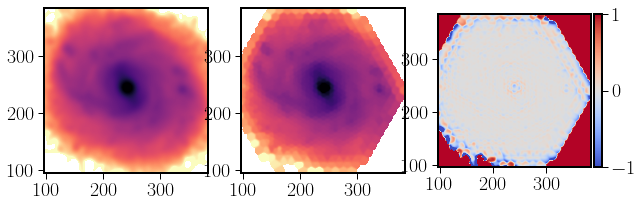

Sigma = 1.4999999999999998
sigma_min_pix= 4.700000000000002 , sigma_min_arc= 1.1750000284519002
Final FWHM [arcsec] =  1.9406055928435775


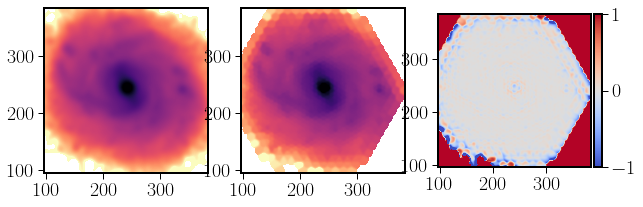

In [28]:
FWHMs_sigma=[]
RESs_sigma=[]
slope_now=1.25
sigmas=arange(0.15,1.5,0.15)
for sigma_now in sigmas:
    img,weights = inter_map_IDW(phot_table,radius,[0,0],[1,1],[480,480],slope=slope_now,sigma=sigma_now,\
                                radius_limit=0.5*radius/pix_size)
    print('Sigma =',sigma_now)
    fwhm_now,sigma_min,res = get_FWHM_conv(img,hdu.data,FWHM_ref_arc=1,pix_size=pix_size,plot=1)
    FWHMs_sigma.append(fwhm_now)
    RESs_sigma.append(res)
    
FWHMs_sigma=np.array(FWHMs_sigma)
RESs_sigma=np.array(RESs_sigma)

In [46]:
RES_vals_sigma=[]
for RES_maps in RESs_sigma:
    mask=np.isfinite(RES_maps)
    sig=np.nanstd(RES_maps[mask])
    RES_vals_sigma.append(sig)
RES_vals_sigma=np.array(RES_vals_sigma)
print(RES_vals_sigma)

[2.5252447  2.2454123  1.9946607  1.7126678  1.4714787  1.2677364
 1.1100562  0.9999589  0.9305763  0.89010155]


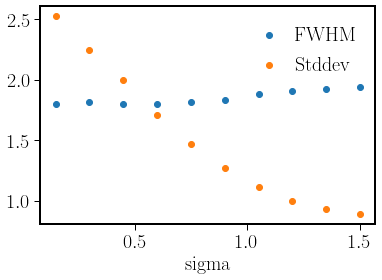

In [154]:
plt.scatter(sigmas,FWHMs_sigma,label='FWHM')
plt.scatter(sigmas,RES_vals_sigma,label='Stddev')
plt.xlabel('sigma')
ax = plt.gca()
ax.legend()


Sigma = 0.15
sigma_min_pix= 3.8000000000000016 , sigma_min_arc= 0.950000023003664
Final FWHM [arcsec] =  1.798971943680786


<ipython-input-20-ae5863308741>:4: RuntimeWarning: invalid value encountered in log10
  ax[0].imshow(np.log10(img_in), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')
<ipython-input-20-ae5863308741>:6: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_now), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')


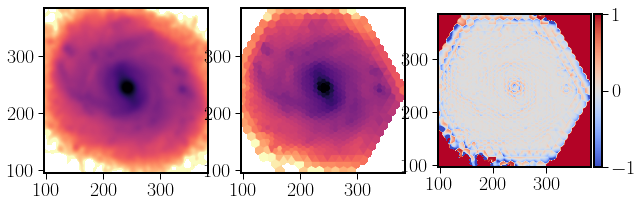

<ipython-input-20-ae5863308741>:44: RuntimeWarning: divide by zero encountered in true_divide
  return FWHM_final,sigma_min,s_img/img_test


Sigma = 0.3
sigma_min_pix= 3.9000000000000012 , sigma_min_arc= 0.9750000236090235
Final FWHM [arcsec] =  1.8152548183590207


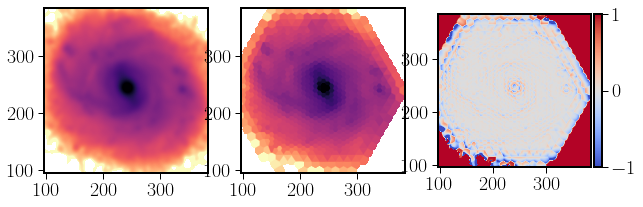

Sigma = 0.44999999999999996
sigma_min_pix= 3.8000000000000016 , sigma_min_arc= 0.950000023003664
Final FWHM [arcsec] =  1.798971943680786


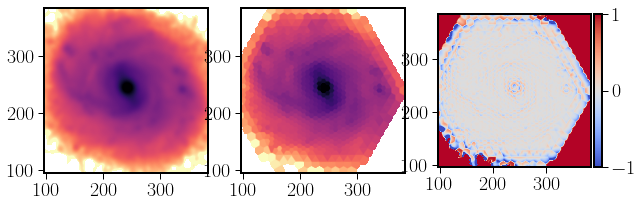

Sigma = 0.6
sigma_min_pix= 3.8000000000000016 , sigma_min_arc= 0.950000023003664
Final FWHM [arcsec] =  1.798971943680786


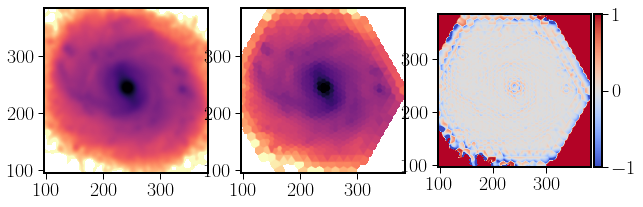

Sigma = 0.75
sigma_min_pix= 3.9000000000000012 , sigma_min_arc= 0.9750000236090235
Final FWHM [arcsec] =  1.8152548183590207


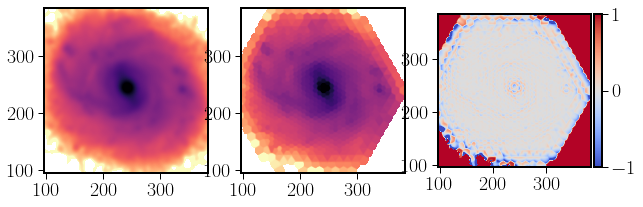

Sigma = 0.9
sigma_min_pix= 4.000000000000001 , sigma_min_arc= 1.000000024214383
Final FWHM [arcsec] =  1.831392928074327


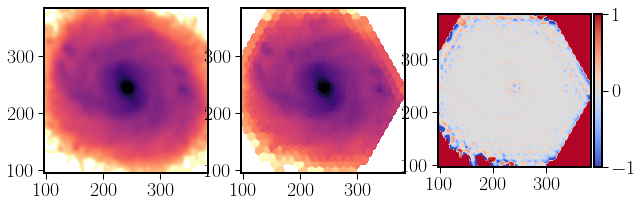

Sigma = 1.0499999999999998
sigma_min_pix= 4.300000000000002 , sigma_min_arc= 1.0750000260304617
Final FWHM [arcsec] =  1.8789758011415971


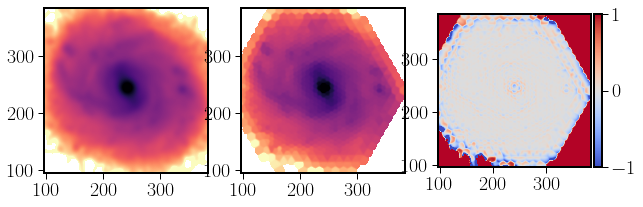

Sigma = 1.2
sigma_min_pix= 4.500000000000002 , sigma_min_arc= 1.125000027241181
Final FWHM [arcsec] =  1.9100392833985746


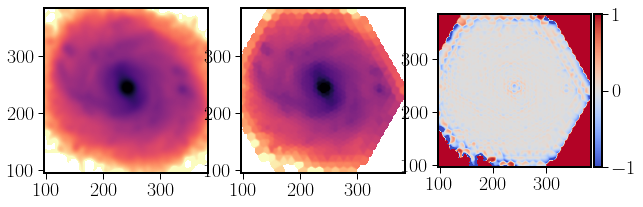

Sigma = 1.3499999999999999
sigma_min_pix= 4.600000000000001 , sigma_min_arc= 1.1500000278465405
Final FWHM [arcsec] =  1.9253830957891878


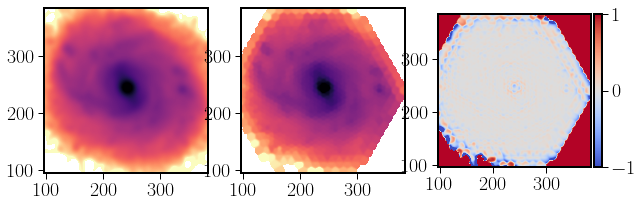

Sigma = 1.4999999999999998
sigma_min_pix= 4.700000000000002 , sigma_min_arc= 1.1750000284519002
Final FWHM [arcsec] =  1.9406055928435775


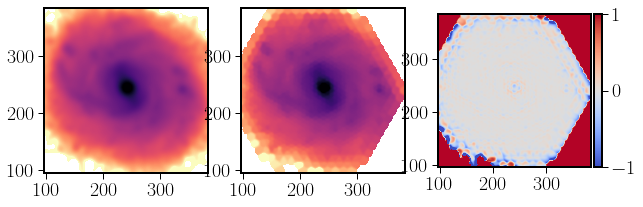

In [49]:
FWHMs_sigma=[]
RESs_sigma=[]
slope_now=1.25
sigmas=arange(0.15,1.5,0.15)
for sigma_now in sigmas:
    img,weights = inter_map_IDW(phot_table,radius,[0,0],[1,1],[480,480],slope=slope_now,sigma=sigma_now,\
                                radius_limit=0.5*radius/pix_size)
    print('Sigma =',sigma_now)
    fwhm_now,sigma_min,res = get_FWHM_conv(img,hdu.data,FWHM_ref_arc=1,pix_size=pix_size,plot=1)
    FWHMs_sigma.append(fwhm_now)
    RESs_sigma.append(res)
    
FWHMs_sigma=np.array(FWHMs_sigma)
RESs_sigma=np.array(RESs_sigma)

In [50]:
#
# Now we test the deconvolution
#

In [51]:
tri = Delaunay(points)
cx=[]
cy=[]
dist=[]
for j, s in enumerate(tri.simplices):
    p0_x = 0.5*(points[s][0][0]+points[s][1][0])
    p1_x = 0.5*(points[s][2][0]+points[s][1][0])
    p2_x = 0.5*(points[s][0][0]+points[s][2][0])
    p0_y = 0.5*(points[s][0][1]+points[s][1][1])
    p1_y = 0.5*(points[s][2][1]+points[s][1][1])
    p2_y = 0.5*(points[s][0][1]+points[s][2][1])
    cx.append(p0_x)
    cy.append(p0_y)
    cx.append(p1_x)
    cy.append(p1_y)
    cx.append(p2_x)
    cy.append(p2_y)
    p = points[s].mean(axis=0)
    dist_p1 = np.sqrt((p[0]-points[s][0][0])**2+(p[1]-points[s][0][1])**2)
    dist_p2 = np.sqrt((p[0]-points[s][1][0])**2+(p[1]-points[s][1][1])**2)
    dist_p3 = np.sqrt((p[0]-points[s][2][0])**2+(p[1]-points[s][2][1])**2)
    dist_now=np.max([dist_p1,dist_p2,dist_p3])
    dist.append(dist_now)
#    print(cx,cy,dist_p3)
cx=np.array(cx)
cy=np.array(cy)

#mid_points=np.zeros((len(cx),2))

#mid_points=unique2d(mid_points)


mid_points_WCS=np.zeros((len(cx),2))
mid_points_WCS[:,0]=nx/2-cx/(wcs.wcs.cdelt[0]*3600)
mid_points_WCS[:,1]=ny/2+cy/(wcs.wcs.cdelt[1]*3600)

mid_points_WCS=unique2d(mid_points_WCS)

print(len(cx),len(mid_points_WCS))
#
# We clean those points that are too nearby!
#

dist=np.array(dist)
mean_dist=np.around(np.mean(dist),1)
print(mean_dist)




5859 2945
1.5


Slope = 1.25
sigma_min_pix= 3.6000000000000014 , sigma_min_arc= 0.9000000217929448
Final FWHM [arcsec] =  1.7659558463621314


<ipython-input-20-ae5863308741>:4: RuntimeWarning: invalid value encountered in log10
  ax[0].imshow(np.log10(img_in), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')
<ipython-input-20-ae5863308741>:6: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_now), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')


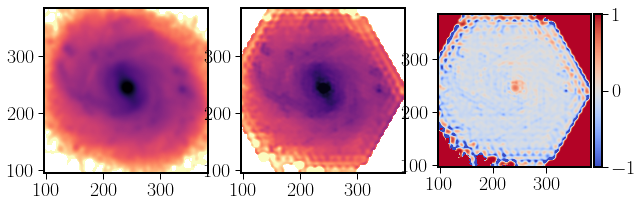

<ipython-input-20-ae5863308741>:44: RuntimeWarning: divide by zero encountered in true_divide
  return FWHM_final,sigma_min,s_img/img_test


Slope = 1.25
sigma_min_pix= 3.4000000000000012 , sigma_min_arc= 0.8500000205822257
Final FWHM [arcsec] =  1.7323106096917376


<ipython-input-20-ae5863308741>:4: RuntimeWarning: invalid value encountered in log10
  ax[0].imshow(np.log10(img_in), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')
<ipython-input-20-ae5863308741>:6: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_now), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')


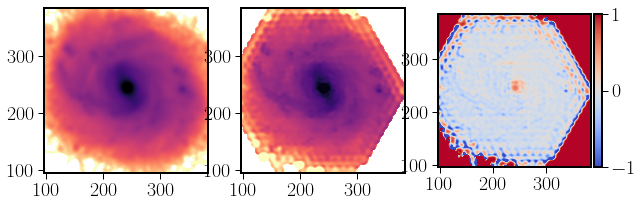

<ipython-input-20-ae5863308741>:44: RuntimeWarning: divide by zero encountered in true_divide
  return FWHM_final,sigma_min,s_img/img_test


In [69]:
aper = CircularAperture(points_WCS, radius)
slope_now=1.25
img,weights = inter_map_IDW(phot_table,radius,[0,0],[1,1],[480,480],slope=slope_now,\
                            radius_limit=0.5*radius/pix_size)
print('Slope =',slope_now)
img_dec = deconv_img(img,aper,FWHM_input=1,slope=slope_now)
fwhm_now,sigma_min,res_img = get_FWHM_conv(img_dec,hdu.data,FWHM_ref_arc=1,pix_size=pix_size,plot=1)

points_WCS_shift=points_WCS.copy()
points_WCS_shift[0]=points_WCS[0]+10

aper_shift = CircularAperture(points_WCS_shift, radius)
img,weights = inter_map_IDW(phot_table,radius,[0,0],[1,1],[480,480],slope=slope_now,\
                            radius_limit=0.5*radius/pix_size)
print('Slope =',slope_now)
img_dec = deconv_img(img,aper_shift,FWHM_input=1,slope=slope_now)
fwhm_now,sigma_min,res_img = get_FWHM_conv(img_dec,hdu.data,FWHM_ref_arc=1,pix_size=pix_size,plot=1)




Slope = 0.75
sigma_min_pix= 5.100000000000001 , sigma_min_arc= 1.2750000308733382
Final FWHM [arcsec] =  2.000337489694136


<ipython-input-20-ae5863308741>:4: RuntimeWarning: invalid value encountered in log10
  ax[0].imshow(np.log10(img_in), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')
<ipython-input-20-ae5863308741>:6: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_now), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')


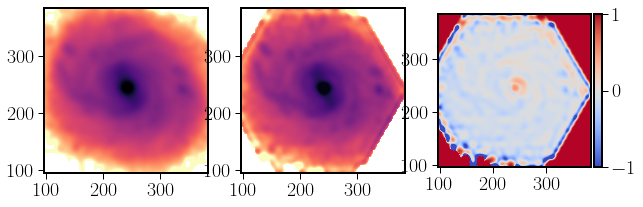

<ipython-input-20-ae5863308741>:44: RuntimeWarning: divide by zero encountered in true_divide
  return FWHM_final,sigma_min,s_img/img_test


Slope = 1.0
sigma_min_pix= 3.8000000000000016 , sigma_min_arc= 0.950000023003664
Final FWHM [arcsec] =  1.798971943680786


<ipython-input-20-ae5863308741>:4: RuntimeWarning: invalid value encountered in log10
  ax[0].imshow(np.log10(img_in), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')
<ipython-input-20-ae5863308741>:6: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_now), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')


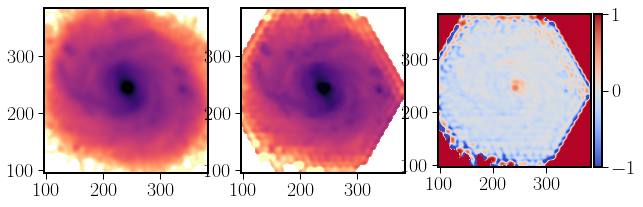

<ipython-input-20-ae5863308741>:44: RuntimeWarning: divide by zero encountered in true_divide
  return FWHM_final,sigma_min,s_img/img_test


Slope = 1.25
sigma_min_pix= 3.4000000000000012 , sigma_min_arc= 0.8500000205822257
Final FWHM [arcsec] =  1.7323106096917376


<ipython-input-20-ae5863308741>:4: RuntimeWarning: invalid value encountered in log10
  ax[0].imshow(np.log10(img_in), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')
<ipython-input-20-ae5863308741>:6: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_now), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')


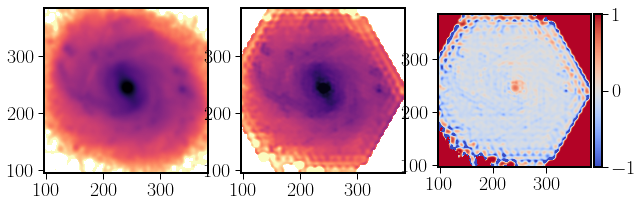

<ipython-input-20-ae5863308741>:44: RuntimeWarning: divide by zero encountered in true_divide
  return FWHM_final,sigma_min,s_img/img_test


Slope = 1.5
sigma_min_pix= 3.100000000000001 , sigma_min_arc= 0.7750000187661469
Final FWHM [arcsec] =  1.6805802700780197


<ipython-input-20-ae5863308741>:4: RuntimeWarning: invalid value encountered in log10
  ax[0].imshow(np.log10(img_in), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')
<ipython-input-20-ae5863308741>:6: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_now), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')


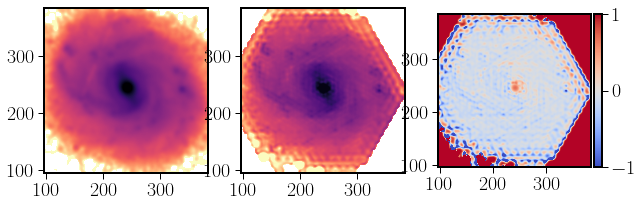

<ipython-input-20-ae5863308741>:44: RuntimeWarning: divide by zero encountered in true_divide
  return FWHM_final,sigma_min,s_img/img_test


Slope = 1.75
sigma_min_pix= 3.100000000000001 , sigma_min_arc= 0.7750000187661469
Final FWHM [arcsec] =  1.6805802700780197


<ipython-input-20-ae5863308741>:4: RuntimeWarning: invalid value encountered in log10
  ax[0].imshow(np.log10(img_in), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')
<ipython-input-20-ae5863308741>:6: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_now), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')


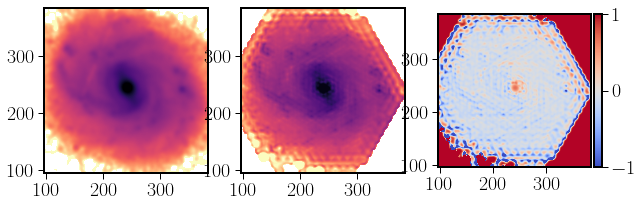

<ipython-input-20-ae5863308741>:44: RuntimeWarning: divide by zero encountered in true_divide
  return FWHM_final,sigma_min,s_img/img_test


Slope = 2.0
sigma_min_pix= 3.100000000000001 , sigma_min_arc= 0.7750000187661469
Final FWHM [arcsec] =  1.6805802700780197


<ipython-input-20-ae5863308741>:4: RuntimeWarning: invalid value encountered in log10
  ax[0].imshow(np.log10(img_in), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')
<ipython-input-20-ae5863308741>:6: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_now), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')


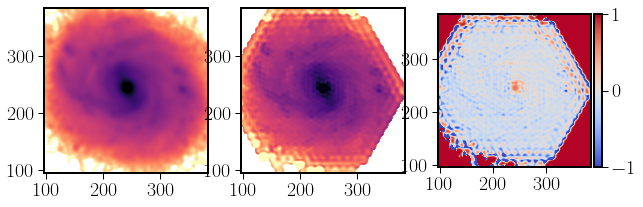

<ipython-input-20-ae5863308741>:44: RuntimeWarning: divide by zero encountered in true_divide
  return FWHM_final,sigma_min,s_img/img_test


Slope = 2.25
sigma_min_pix= 3.300000000000001 , sigma_min_arc= 0.825000019976866
Final FWHM [arcsec] =  1.7152405216253324


<ipython-input-20-ae5863308741>:4: RuntimeWarning: invalid value encountered in log10
  ax[0].imshow(np.log10(img_in), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')
<ipython-input-20-ae5863308741>:6: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_now), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')


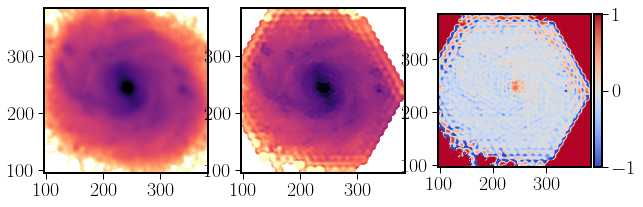

<ipython-input-20-ae5863308741>:44: RuntimeWarning: divide by zero encountered in true_divide
  return FWHM_final,sigma_min,s_img/img_test


Slope = 2.5
sigma_min_pix= 3.000000000000001 , sigma_min_arc= 0.7500000181607873
Final FWHM [arcsec] =  1.6629792670837762


<ipython-input-20-ae5863308741>:4: RuntimeWarning: invalid value encountered in log10
  ax[0].imshow(np.log10(img_in), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')
<ipython-input-20-ae5863308741>:6: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_now), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')


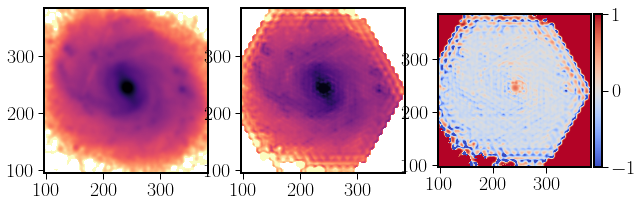

<ipython-input-20-ae5863308741>:44: RuntimeWarning: divide by zero encountered in true_divide
  return FWHM_final,sigma_min,s_img/img_test


Slope = 2.75
sigma_min_pix= 3.100000000000001 , sigma_min_arc= 0.7750000187661469
Final FWHM [arcsec] =  1.6805802700780197


<ipython-input-20-ae5863308741>:4: RuntimeWarning: invalid value encountered in log10
  ax[0].imshow(np.log10(img_in), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')
<ipython-input-20-ae5863308741>:6: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_now), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')


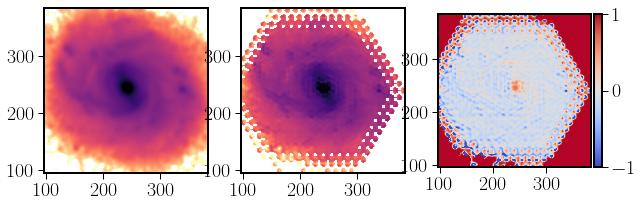

<ipython-input-20-ae5863308741>:44: RuntimeWarning: divide by zero encountered in true_divide
  return FWHM_final,sigma_min,s_img/img_test


Slope = 3.0
sigma_min_pix= 2.9000000000000012 , sigma_min_arc= 0.7250000175554278
Final FWHM [arcsec] =  1.6451899711964808


<ipython-input-20-ae5863308741>:4: RuntimeWarning: invalid value encountered in log10
  ax[0].imshow(np.log10(img_in), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')
<ipython-input-20-ae5863308741>:6: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_now), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')


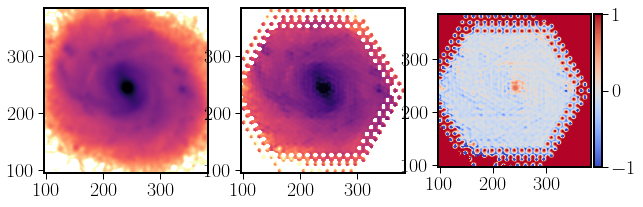

<ipython-input-20-ae5863308741>:44: RuntimeWarning: divide by zero encountered in true_divide
  return FWHM_final,sigma_min,s_img/img_test


Slope = 3.25
sigma_min_pix= 2.600000000000001 , sigma_min_arc= 0.6500000157393491
Final FWHM [arcsec] =  1.590628818125218


<ipython-input-20-ae5863308741>:4: RuntimeWarning: invalid value encountered in log10
  ax[0].imshow(np.log10(img_in), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')
<ipython-input-20-ae5863308741>:6: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_now), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')


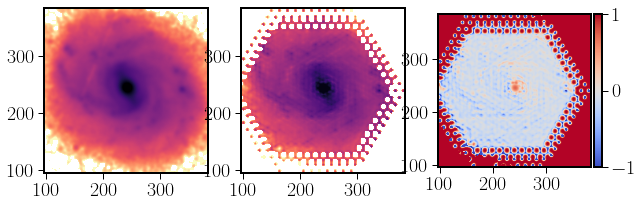

<ipython-input-20-ae5863308741>:44: RuntimeWarning: divide by zero encountered in true_divide
  return FWHM_final,sigma_min,s_img/img_test


Slope = 3.5
sigma_min_pix= 2.3000000000000007 , sigma_min_arc= 0.5750000139232703
Final FWHM [arcsec] =  1.5341284277319738


<ipython-input-20-ae5863308741>:4: RuntimeWarning: invalid value encountered in log10
  ax[0].imshow(np.log10(img_in), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')
<ipython-input-20-ae5863308741>:6: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_now), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')


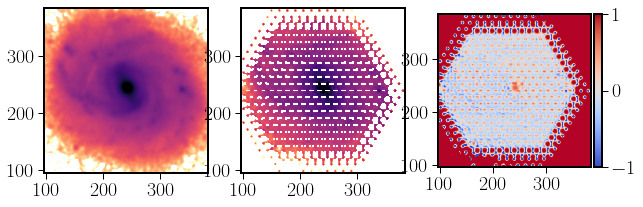

<ipython-input-20-ae5863308741>:44: RuntimeWarning: divide by zero encountered in true_divide
  return FWHM_final,sigma_min,s_img/img_test


Slope = 3.75
sigma_min_pix= 2.1000000000000005 , sigma_min_arc= 0.525000012712551
Final FWHM [arcsec] =  1.495275904281663


<ipython-input-20-ae5863308741>:4: RuntimeWarning: invalid value encountered in log10
  ax[0].imshow(np.log10(img_in), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')
<ipython-input-20-ae5863308741>:6: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_now), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')


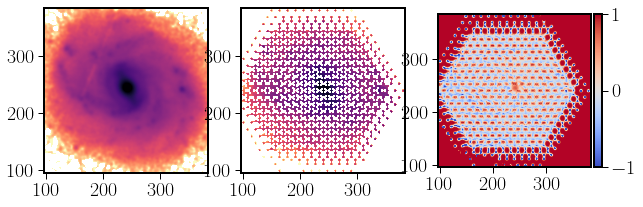

<ipython-input-20-ae5863308741>:44: RuntimeWarning: divide by zero encountered in true_divide
  return FWHM_final,sigma_min,s_img/img_test


In [74]:
#
# No smooth
#

aper = CircularAperture(points_WCS, radius)
FWHMs_dec=[]
slopes=arange(0.75,4.0,0.25)
for slope_now in slopes:
    img,weights = inter_map_IDW(phot_table,radius,[0,0],[1,1],[480,480],slope=slope_now,\
                                radius_limit=0.5*radius/pix_size)
    print('Slope =',slope_now)
    img_dec = deconv_img(img,aper,FWHM_input=1,slope=slope_now)
    fwhm_now,sigma_min,res_map_now = get_FWHM_conv(img_dec,hdu.data,FWHM_ref_arc=1,pix_size=pix_size,plot=1)
    FWHMs_dec.append(fwhm_now)
FWHMs_dec=np.array(FWHMs_dec)

Slope = 0.75
sigma_min_pix= 5.300000000000002 , sigma_min_arc= 1.3250000320840576
Final FWHM [arcsec] =  2.02954430242995


<ipython-input-20-ae5863308741>:4: RuntimeWarning: invalid value encountered in log10
  ax[0].imshow(np.log10(img_in), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')
<ipython-input-20-ae5863308741>:6: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_now), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')


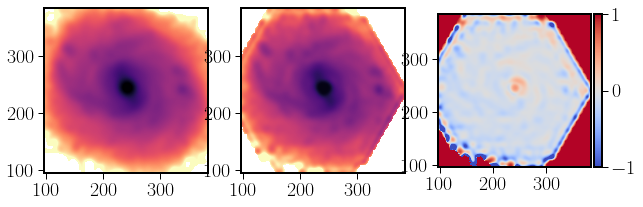

<ipython-input-20-ae5863308741>:44: RuntimeWarning: divide by zero encountered in true_divide
  return FWHM_final,sigma_min,s_img/img_test


Slope = 1.0
sigma_min_pix= 3.9000000000000012 , sigma_min_arc= 0.9750000236090235
Final FWHM [arcsec] =  1.8152548183590207


<ipython-input-20-ae5863308741>:4: RuntimeWarning: invalid value encountered in log10
  ax[0].imshow(np.log10(img_in), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')
<ipython-input-20-ae5863308741>:6: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_now), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')


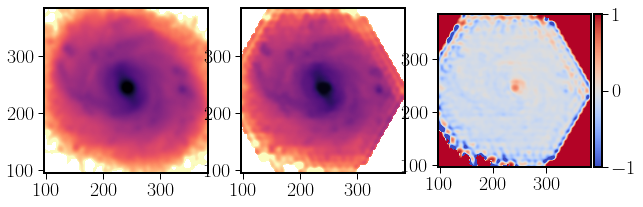

<ipython-input-20-ae5863308741>:44: RuntimeWarning: divide by zero encountered in true_divide
  return FWHM_final,sigma_min,s_img/img_test


Slope = 1.25
sigma_min_pix= 3.100000000000001 , sigma_min_arc= 0.7750000187661469
Final FWHM [arcsec] =  1.6805802700780197


<ipython-input-20-ae5863308741>:4: RuntimeWarning: invalid value encountered in log10
  ax[0].imshow(np.log10(img_in), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')
<ipython-input-20-ae5863308741>:6: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_now), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')


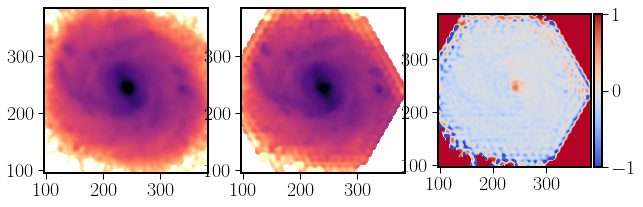

<ipython-input-20-ae5863308741>:44: RuntimeWarning: divide by zero encountered in true_divide
  return FWHM_final,sigma_min,s_img/img_test


Slope = 1.5
sigma_min_pix= 3.100000000000001 , sigma_min_arc= 0.7750000187661469
Final FWHM [arcsec] =  1.6805802700780197


<ipython-input-20-ae5863308741>:4: RuntimeWarning: invalid value encountered in log10
  ax[0].imshow(np.log10(img_in), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')
<ipython-input-20-ae5863308741>:6: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_now), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')


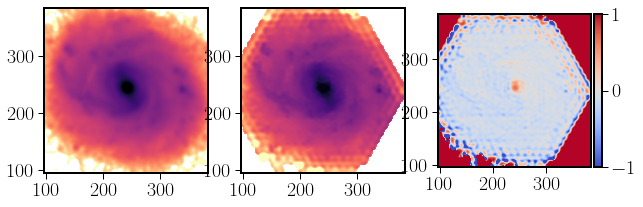

<ipython-input-20-ae5863308741>:44: RuntimeWarning: divide by zero encountered in true_divide
  return FWHM_final,sigma_min,s_img/img_test


Slope = 1.75
sigma_min_pix= 3.000000000000001 , sigma_min_arc= 0.7500000181607873
Final FWHM [arcsec] =  1.6629792670837762


<ipython-input-20-ae5863308741>:4: RuntimeWarning: invalid value encountered in log10
  ax[0].imshow(np.log10(img_in), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')
<ipython-input-20-ae5863308741>:6: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_now), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')


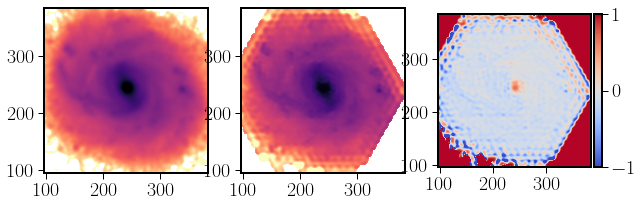

<ipython-input-20-ae5863308741>:44: RuntimeWarning: divide by zero encountered in true_divide
  return FWHM_final,sigma_min,s_img/img_test


Slope = 2.0
sigma_min_pix= 3.000000000000001 , sigma_min_arc= 0.7500000181607873
Final FWHM [arcsec] =  1.6629792670837762


<ipython-input-20-ae5863308741>:4: RuntimeWarning: invalid value encountered in log10
  ax[0].imshow(np.log10(img_in), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')
<ipython-input-20-ae5863308741>:6: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_now), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')


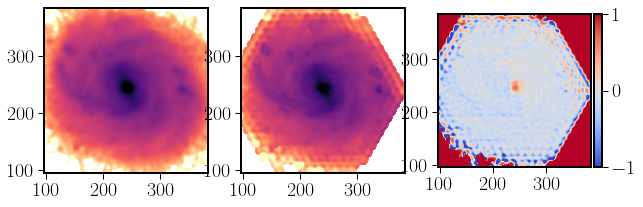

<ipython-input-20-ae5863308741>:44: RuntimeWarning: divide by zero encountered in true_divide
  return FWHM_final,sigma_min,s_img/img_test


Slope = 2.25
sigma_min_pix= 3.000000000000001 , sigma_min_arc= 0.7500000181607873
Final FWHM [arcsec] =  1.6629792670837762


<ipython-input-20-ae5863308741>:4: RuntimeWarning: invalid value encountered in log10
  ax[0].imshow(np.log10(img_in), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')
<ipython-input-20-ae5863308741>:6: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_now), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')


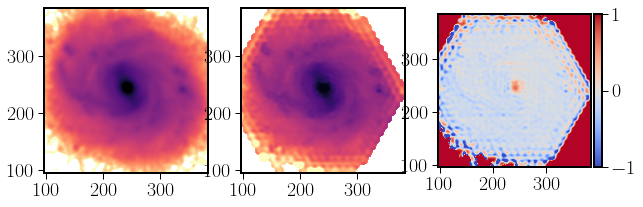

<ipython-input-20-ae5863308741>:44: RuntimeWarning: divide by zero encountered in true_divide
  return FWHM_final,sigma_min,s_img/img_test


Slope = 2.5
sigma_min_pix= 3.6000000000000014 , sigma_min_arc= 0.9000000217929448
Final FWHM [arcsec] =  1.7659558463621314


<ipython-input-20-ae5863308741>:4: RuntimeWarning: invalid value encountered in log10
  ax[0].imshow(np.log10(img_in), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')
<ipython-input-20-ae5863308741>:6: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_now), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')


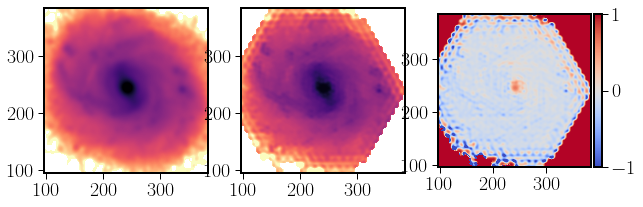

<ipython-input-20-ae5863308741>:44: RuntimeWarning: divide by zero encountered in true_divide
  return FWHM_final,sigma_min,s_img/img_test


Slope = 2.75
sigma_min_pix= 3.5000000000000013 , sigma_min_arc= 0.8750000211875852
Final FWHM [arcsec] =  1.7492141235067753


<ipython-input-20-ae5863308741>:4: RuntimeWarning: invalid value encountered in log10
  ax[0].imshow(np.log10(img_in), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')
<ipython-input-20-ae5863308741>:6: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_now), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')


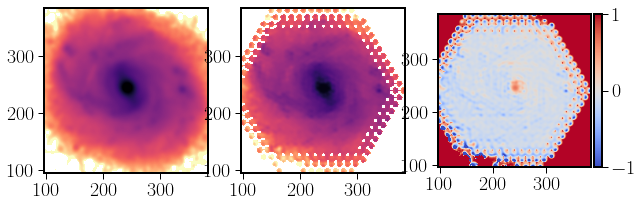

<ipython-input-20-ae5863308741>:44: RuntimeWarning: divide by zero encountered in true_divide
  return FWHM_final,sigma_min,s_img/img_test


Slope = 3.0
sigma_min_pix= 3.8000000000000016 , sigma_min_arc= 0.950000023003664
Final FWHM [arcsec] =  1.798971943680786


<ipython-input-20-ae5863308741>:4: RuntimeWarning: invalid value encountered in log10
  ax[0].imshow(np.log10(img_in), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')
<ipython-input-20-ae5863308741>:6: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_now), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')


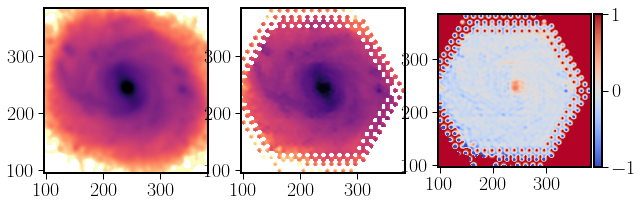

<ipython-input-20-ae5863308741>:44: RuntimeWarning: divide by zero encountered in true_divide
  return FWHM_final,sigma_min,s_img/img_test


Slope = 3.25
sigma_min_pix= 3.7000000000000015 , sigma_min_arc= 0.9250000223983044
Final FWHM [arcsec] =  1.7825403369140371


<ipython-input-20-ae5863308741>:4: RuntimeWarning: invalid value encountered in log10
  ax[0].imshow(np.log10(img_in), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')
<ipython-input-20-ae5863308741>:6: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_now), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')


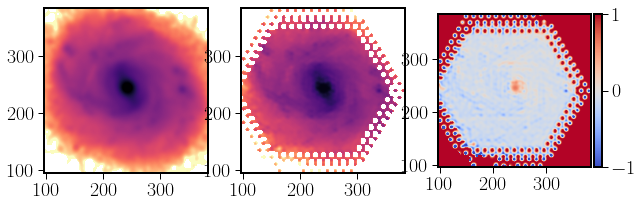

<ipython-input-20-ae5863308741>:44: RuntimeWarning: divide by zero encountered in true_divide
  return FWHM_final,sigma_min,s_img/img_test


Slope = 3.5
sigma_min_pix= 3.300000000000001 , sigma_min_arc= 0.825000019976866
Final FWHM [arcsec] =  1.7152405216253324


<ipython-input-20-ae5863308741>:4: RuntimeWarning: invalid value encountered in log10
  ax[0].imshow(np.log10(img_in), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')
<ipython-input-20-ae5863308741>:6: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_now), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')


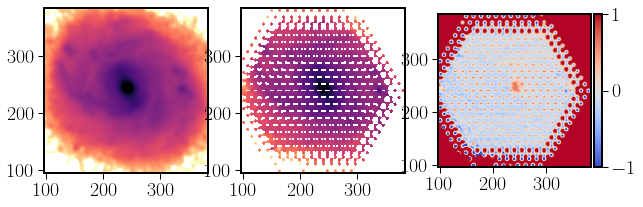

<ipython-input-20-ae5863308741>:44: RuntimeWarning: divide by zero encountered in true_divide
  return FWHM_final,sigma_min,s_img/img_test


Slope = 3.75
sigma_min_pix= 3.000000000000001 , sigma_min_arc= 0.7500000181607873
Final FWHM [arcsec] =  1.6629792670837762


<ipython-input-20-ae5863308741>:4: RuntimeWarning: invalid value encountered in log10
  ax[0].imshow(np.log10(img_in), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')
<ipython-input-20-ae5863308741>:6: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_now), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')


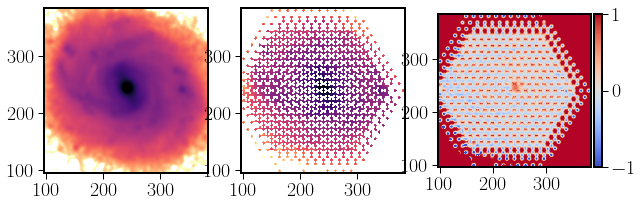

<ipython-input-20-ae5863308741>:44: RuntimeWarning: divide by zero encountered in true_divide
  return FWHM_final,sigma_min,s_img/img_test


In [75]:
#
# Smooth
#

aper = CircularAperture(points_WCS, radius)
FWHMs_dec_s=[]
slopes=arange(0.75,4.0,0.25)
for slope_now in slopes:
    img,weights = inter_map_IDW(phot_table,radius,[0,0],[1,1],[480,480],slope=slope_now,\
                                radius_limit=0.5*radius/pix_size)
    print('Slope =',slope_now)
    img_dec = deconv_img(img,aper,FWHM_input=1,slope=slope_now,smooth=1)
    fwhm_now,sigma_min,res_map_now = get_FWHM_conv(img_dec,hdu.data,FWHM_ref_arc=1,\
                                       pix_size=pix_size,plot=1)
    FWHMs_dec_s.append(fwhm_now)
FWHMs_dec_s=np.array(FWHMs_dec_s)

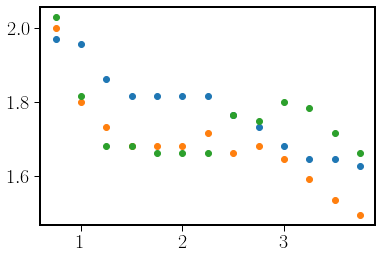

In [76]:
plt.scatter(slopes,FWHMs)
plt.scatter(slopes,FWHMs_dec)
plt.scatter(slopes,FWHMs_dec_s)


#
# Further tests!!!
#

In [77]:
#nx=480
#ny=480
#img_psf = img_map[int(0.4*ny):int(0.6*ny),int(0.4*nx):int(0.6*nx)]
#img_Gauss_dec = restoration.richardson_lucy(img_map, img_psf, 5)



#img_map_bi = inter_map(phot_table,radius,[0,0],[1,1],[480,480],method='quintic')

<ipython-input-78-208032c7ee2d>:3: RuntimeWarning: invalid value encountered in log10
  ax[0][0].imshow(np.log10(hdu.data), cmap='gray_r', vmin=-3, vmax=0.15, origin='lower')
<ipython-input-78-208032c7ee2d>:5: RuntimeWarning: invalid value encountered in log10
  ax[0][1].imshow(np.log10(hdu.data), cmap='gray_r', vmin=-3, vmax=-3, origin='lower')
<ipython-input-78-208032c7ee2d>:8: RuntimeWarning: invalid value encountered in log10
  c=np.log10(phot_table['aperture_sum']/(np.pi*radius**2)),\
<ipython-input-78-208032c7ee2d>:12: RuntimeWarning: divide by zero encountered in log10
  ax[1][0].imshow(np.log10(img), cmap='gray_r', vmin=-3, vmax=0.15, origin='lower')
<ipython-input-78-208032c7ee2d>:15: RuntimeWarning: invalid value encountered in log10
  ax[1][1].imshow(np.log10(img_map), cmap='gray_r', vmin=-3, vmax=0.15, origin='lower')


(96.0, 384.0)

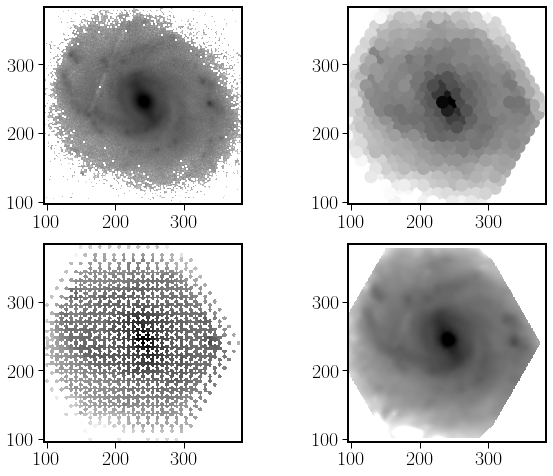

In [78]:
fig,ax = plt.subplots(2,2,figsize=(10,8))
plt.subplot(ax[0][0],projection=wcs)
ax[0][0].imshow(np.log10(hdu.data), cmap='gray_r', vmin=-3, vmax=0.15, origin='lower')
plt.subplot(ax[1][0],projection=wcs)
ax[0][1].imshow(np.log10(hdu.data), cmap='gray_r', vmin=-3, vmax=-3, origin='lower')
cm = plt.cm.get_cmap('Greys')
ax[0][1].scatter(phot_table['xcenter'],phot_table['ycenter'],\
                 c=np.log10(phot_table['aperture_sum']/(np.pi*radius**2)),\
              cmap=cm, vmin=-3, vmax=0.15,\
             s=140)
plt.subplot(ax[1][0],projection=wcs)
ax[1][0].imshow(np.log10(img), cmap='gray_r', vmin=-3, vmax=0.15, origin='lower')

plt.subplot(ax[1][1],projection=wcs)
ax[1][1].imshow(np.log10(img_map), cmap='gray_r', vmin=-3, vmax=0.15, origin='lower')
#ax[1][1].imshow(weights, cmap='gray_r', vmin=0, vmax=np.max(weights), origin='lower')


ax[0][0].set_xlim([0.2*nx,0.8*nx])
ax[0][0].set_ylim([0.2*ny,0.8*ny])

ax[0][1].set_xlim([0.2*nx,0.8*nx])
ax[0][1].set_ylim([0.2*ny,0.8*ny])

ax[1][0].set_xlim([0.2*nx,0.8*nx])
ax[1][0].set_ylim([0.2*ny,0.8*ny])

ax[1][1].set_xlim([0.2*nx,0.8*nx])
ax[1][1].set_ylim([0.2*ny,0.8*ny])


In [79]:
print(np.max(img),np.max(weights))

3.2830188 1.0


In [80]:
tri = Delaunay(points)
cx=[]
cy=[]
dist=[]
for j, s in enumerate(tri.simplices):
    p0_x = 0.5*(points[s][0][0]+points[s][1][0])
    p1_x = 0.5*(points[s][2][0]+points[s][1][0])
    p2_x = 0.5*(points[s][0][0]+points[s][2][0])
    p0_y = 0.5*(points[s][0][1]+points[s][1][1])
    p1_y = 0.5*(points[s][2][1]+points[s][1][1])
    p2_y = 0.5*(points[s][0][1]+points[s][2][1])
    cx.append(p0_x)
    cy.append(p0_y)
    cx.append(p1_x)
    cy.append(p1_y)
    cx.append(p2_x)
    cy.append(p2_y)
    p = points[s].mean(axis=0)
    dist_p1 = np.sqrt((p[0]-points[s][0][0])**2+(p[1]-points[s][0][1])**2)
    dist_p2 = np.sqrt((p[0]-points[s][1][0])**2+(p[1]-points[s][1][1])**2)
    dist_p3 = np.sqrt((p[0]-points[s][2][0])**2+(p[1]-points[s][2][1])**2)
    dist_now=np.max([dist_p1,dist_p2,dist_p3])
    dist.append(dist_now)
#    print(cx,cy,dist_p3)
cx=np.array(cx)
cy=np.array(cy)

#mid_points=np.zeros((len(cx),2))

#mid_points=unique2d(mid_points)


mid_points_WCS=np.zeros((len(cx),2))
mid_points_WCS[:,0]=nx/2-cx/(wcs.wcs.cdelt[0]*3600)
mid_points_WCS[:,1]=ny/2+cy/(wcs.wcs.cdelt[1]*3600)

mid_points_WCS=unique2d(mid_points_WCS)

print(len(cx),len(mid_points_WCS))
#
# We clean those points that are too nearby!
#

dist=np.array(dist)
mean_dist=np.around(np.mean(dist),1)
print(mean_dist)




5859 2945
1.5


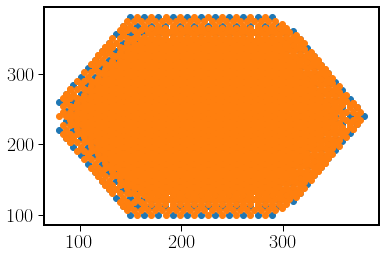

In [81]:
plt.scatter(points_WCS[:,0],points_WCS[:,1])
plt.scatter(mid_points_WCS[:,0],mid_points_WCS[:,1])


In [82]:
org_dist_arc=2.7
new_radius=(mean_dist-0.5*org_dist_arc)/pix_size
#new_radius=0.5*mean_dist/pix_size
print('Org radius=',radius,radius*pix_size)
print('new_radius=',new_radius,new_radius*pix_size)
mid_radius=0.5*(mean_dist/pix_size-2*new_radius)
print('mid_radius=',mid_radius,mid_radius*pix_size)
# Final radius:
new_radius = np.round(0.5*(new_radius+mid_radius),2)
mid_radius = np.round(new_radius,2)
print(mid_radius,mid_radius*pix_size)
new_radius=1.0
mid_radius=1.0

Org radius= 5.359999870210912 1.34
new_radius= 0.5999999854713703 0.1499999999999999
mid_radius= 2.399999941885483 0.6000000000000001
1.5 0.37500000908039355


In [83]:
#
# We do new apertures and estimate the values in the center!
#

#new_radius=0.5*mean_dist/pix_size
#mid_radius=2*new_radius-radius
#print('mid_radius=',mid_radius,radius,mid_radius)
#print(new_radius,radius)
aper_center = CircularAperture(points_WCS, new_radius)
aper_ring = CircularAnnulus(points_WCS,new_radius,radius)
phot_tabl = aperture_photometry(hdu.data, aper,\
                                           method='subpixel',subpixels=5)

phot_table_center_in = aperture_photometry(hdu.data, aper_center,\
                                           method='subpixel',subpixels=5)
phot_table_out = aperture_photometry(img_map, aper, method='subpixel',subpixels=5)

phot_table_ring_out = aperture_photometry(img_map, \
                                          aper_ring, method='subpixel',subpixels=5)
phot_table_center_est = phot_table_center_in.copy()
ratio_in_out = phot_table['aperture_sum']/phot_table_out['aperture_sum']
print('mean_ratio=',np.nanmedian(ratio_in_out),np.nanstd(ratio_in_out))
phot_table_center_est['aperture_sum']=phot_table['aperture_sum']-phot_table_ring_out['aperture_sum']*ratio_in_out
print(phot_table_center_est['aperture_sum'][0],phot_table['aperture_sum'][0],phot_table_ring_out['aperture_sum'][0])
delta=phot_table_center_in['aperture_sum']-phot_table_center_est['aperture_sum']
mean_delta=np.nanmean(delta/phot_table_center_in['aperture_sum'])
std_delta=np.nanstd(delta/phot_table_center_in['aperture_sum'])
print(mean_delta,std_delta)

#
# New points!
#
aper_mid_points = CircularAperture(mid_points_WCS, new_radius)
phot_table_mid_points = aperture_photometry(img, aper_mid_points,\
                                            method='subpixel',subpixels=5)

phot_table_center_est.add_column(new_radius,name='radius')
phot_table_mid_points.add_column(mid_radius,name='radius')

phot_table_final=vstack_table([phot_table_center_est, phot_table_mid_points])
aper_all = vstack_table([aper_center,aper_mid_points])
#print(aper_mid_points)



#plt.scatter(phot_table_center_in['aperture_sum'],phot_table_center_est['aperture_sum'])


mean_ratio= 0.9949060111140389 0.078481849811413
0.211548578048518 6.384550815224647 6.2796993821318114
-0.0902960332014138 1.471065165303023


In [84]:
#print(aper_all)

In [85]:
#print(phot_table_center_est['radius'],radius)

In [86]:
print(len(phot_table_final))

3938


In [87]:
def plot_four(img_in,phot_table,img,img_loop):
    fig,ax = plt.subplots(2,2,figsize=(10,8))
    plt.subplot(ax[0][0],projection=wcs)
    ax[0][0].imshow(np.log10(hdu.data), cmap='gray_r', vmin=-3, vmax=0.15, origin='lower')
    plt.subplot(ax[1][0],projection=wcs)
    ax[0][1].imshow(np.log10(hdu.data), cmap='gray_r', vmin=-3, vmax=-3, origin='lower')
    cm = plt.cm.get_cmap('Greys')
    ax[0][1].scatter(phot_table['xcenter'],phot_table['ycenter'],\
                     c=np.log10(phot_table['aperture_sum']/(np.pi*radius**2)),\
                     cmap=cm, vmin=-3, vmax=0.15,\
                     s=140)
    plt.subplot(ax[1][0],projection=wcs)
    ax[1][0].imshow(np.log10(img), cmap='gray_r', vmin=-3, vmax=0.15, origin='lower')

    plt.subplot(ax[1][1],projection=wcs)
    ax[1][1].imshow(np.log10(img_loop), cmap='gray_r', vmin=-3, vmax=0.15, origin='lower')


    ax[0][0].set_xlim([0.2*nx,0.8*nx])
    ax[0][0].set_ylim([0.2*ny,0.8*ny])

    ax[0][1].set_xlim([0.2*nx,0.8*nx])
    ax[0][1].set_ylim([0.2*ny,0.8*ny])

    ax[1][0].set_xlim([0.2*nx,0.8*nx])
    ax[1][0].set_ylim([0.2*ny,0.8*ny])

    ax[1][1].set_xlim([0.2*nx,0.8*nx])
    ax[1][1].set_ylim([0.2*ny,0.8*ny])
    
    



First Interpolation
Second Interpolation
Interpolation Done


<ipython-input-87-7a0b924fba29>:4: RuntimeWarning: invalid value encountered in log10
  ax[0][0].imshow(np.log10(hdu.data), cmap='gray_r', vmin=-3, vmax=0.15, origin='lower')
<ipython-input-87-7a0b924fba29>:6: RuntimeWarning: invalid value encountered in log10
  ax[0][1].imshow(np.log10(hdu.data), cmap='gray_r', vmin=-3, vmax=-3, origin='lower')
<ipython-input-87-7a0b924fba29>:9: RuntimeWarning: invalid value encountered in log10
  c=np.log10(phot_table['aperture_sum']/(np.pi*radius**2)),\
<ipython-input-87-7a0b924fba29>:13: RuntimeWarning: divide by zero encountered in log10
  ax[1][0].imshow(np.log10(img), cmap='gray_r', vmin=-3, vmax=0.15, origin='lower')
<ipython-input-87-7a0b924fba29>:16: RuntimeWarning: divide by zero encountered in log10
  ax[1][1].imshow(np.log10(img_loop), cmap='gray_r', vmin=-3, vmax=0.15, origin='lower')


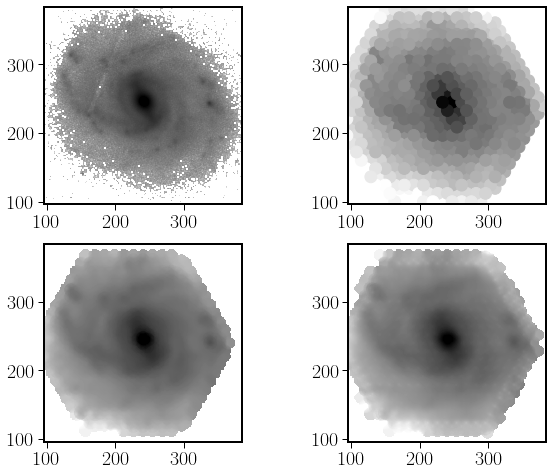

In [88]:
# New Loop

slope=0.75
img_loop,weights_loop = inter_map_IDW(phot_table_center_est,new_radius,[0,0],[1,1],[480,480],slope=slope,\
                            radius_limit=0.5*5/pix_size)
print('First Interpolation')
# New image
img_all,weights_loop = inter_map_IDW(phot_table_final,phot_table_final['radius'],\
                                     [0,0],[1,1],[480,480],slope=slope,\
                            radius_limit=0.5*5/pix_size)
print('Second Interpolation')

print('Interpolation Done')
img_map = inter_map(phot_table_center_est,new_radius,[0,0],[1,1],[480,480],method='cubic')
plot_four(hdu.data,phot_table,img_loop,img_all)


FWHM_input =  1.0


<ipython-input-89-9dc7519bdf86>:41: RuntimeWarning: divide by zero encountered in log10
  ax[0].imshow(np.log10(img_Gauss), cmap='gray_r', vmin=-10, vmax=0.01, origin='lower')
<ipython-input-89-9dc7519bdf86>:44: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_Gauss_r), cmap='gray_r', vmin=-10, vmax=0.01, origin='lower')
<ipython-input-89-9dc7519bdf86>:47: RuntimeWarning: divide by zero encountered in log10
  ax[2].imshow(np.log10(img_Gauss_org_r), cmap='gray_r', vmin=-10, vmax=0.01, origin='lower')
<ipython-input-89-9dc7519bdf86>:50: RuntimeWarning: divide by zero encountered in log10
  ax[3].imshow(np.log10(img_Gauss_all), cmap='gray_r', vmin=-10, vmax=0.01, origin='lower')


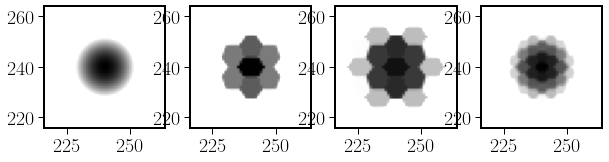

In [89]:
slope=2.5

#amplitude=1, x_mean=0, y_mean=0, x_stddev=None, y_stddev=None, theta=None, cov_matrix=None, **kwargs
def Gaussian2D_map(nx,ny,A,xc,yc,sigma_x,sigma_y,theta=0):
    xi = np.arange(0,nx)
    yi = np.arange(0,ny)
    xi,yi = np.meshgrid(xi,yi)    
    img = Gaussian2D(A, xc, yc, sigma_x, sigma_y, theta=theta)(xi, yi)
    return img

#
#
#
FWHM_input = 1.0 # Arcsec
sigma_FWHM=FWHM_input/pix_size/2.354
print('FWHM_input = ', FWHM_input)
img_Gauss=Gaussian2D_map(480,480,1,480*0.5,480*0.5,sigma_FWHM,sigma_FWHM,0)

phot_Gauss = aperture_photometry(img_Gauss, aper_center,\
                                           method='subpixel',subpixels=5)
img_Gauss_r,weights_Gauss_r = inter_map_IDW(phot_Gauss,new_radius,[0,0],[1,1],[480,480],slope=slope,\
                            radius_limit=0.5*5/pix_size)

phot_Gauss_org = aperture_photometry(img_Gauss, aper,\
                                           method='subpixel',subpixels=5)
img_Gauss_org_r,weights_Gauss_r = inter_map_IDW(phot_Gauss_org,radius,[0,0],[1,1],[480,480],slope=slope,\
                            radius_limit=0.5*5/pix_size)

phot_Gauss_mid = aperture_photometry(img_Gauss, aper_mid_points,\
                                           method='subpixel',subpixels=5)

phot_Gauss_all=vstack_table([phot_Gauss, phot_Gauss_mid])


img_Gauss_all,weights_Gauss_all = inter_map_IDW(phot_Gauss_all,new_radius,[0,0],[1,1],[480,480],slope=slope,\
                            radius_limit=0.5*5/pix_size)



fig,ax = plt.subplots(1,4,figsize=(10,8))
ax[0].imshow(np.log10(img_Gauss), cmap='gray_r', vmin=-10, vmax=0.01, origin='lower')
ax[0].set_xlim([0.45*nx,0.55*nx])
ax[0].set_ylim([0.45*ny,0.55*ny])
ax[1].imshow(np.log10(img_Gauss_r), cmap='gray_r', vmin=-10, vmax=0.01, origin='lower')
ax[1].set_xlim([0.45*nx,0.55*nx])
ax[1].set_ylim([0.45*ny,0.55*ny])
ax[2].imshow(np.log10(img_Gauss_org_r), cmap='gray_r', vmin=-10, vmax=0.01, origin='lower')
ax[2].set_xlim([0.45*nx,0.55*nx])
ax[2].set_ylim([0.45*ny,0.55*ny])
ax[3].imshow(np.log10(img_Gauss_all), cmap='gray_r', vmin=-10, vmax=0.01, origin='lower')
ax[3].set_xlim([0.45*nx,0.55*nx])
ax[3].set_ylim([0.45*ny,0.55*ny])

plt.show()


img_psf = img_Gauss_r[int(0.4*ny):int(0.6*ny),int(0.4*nx):int(0.6*nx)]

#img_Gauss_dec = restoration.richardson_lucy(astro_noisy, psf, num_iter=30)


<ipython-input-90-d7098d9a2047>:12: RuntimeWarning: divide by zero encountered in log10
  ax[0].imshow(np.log10(img_Gauss), cmap='gray_r', vmin=-10, vmax=5, origin='lower')
<ipython-input-90-d7098d9a2047>:18: RuntimeWarning: divide by zero encountered in log10
  ax[2].imshow(np.log10(img_Gauss_dec), cmap='gray_r', vmin=-10, vmax=5, origin='lower')
<ipython-input-90-d7098d9a2047>:18: RuntimeWarning: invalid value encountered in log10
  ax[2].imshow(np.log10(img_Gauss_dec), cmap='gray_r', vmin=-10, vmax=5, origin='lower')


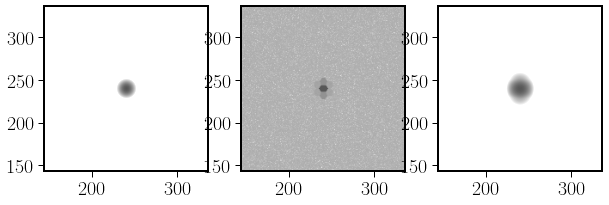

In [90]:
img_psf_r = img_Gauss_org_r[int(0.4*ny):int(0.6*ny),int(0.4*nx):int(0.6*nx)]
#img_psf_r = img_psf_r/np.sum(img_psf_r)
#plt.imshow(img_psf)
img_Gauss_r += img_Gauss_r.max() * 1E-5 * np.random.random(img_Gauss_r.shape)
#img_Gauss_dec = richardson_lucy_mod(img_Gauss_r, img_psf_r,5)
img_Gauss_dec = restoration.richardson_lucy(img_Gauss_r, img_psf_r,5,filter_epsilon=0.01)
#img_Gauss_dec, chain = restoration.unsupervised_wiener(img_Gauss_org_r, img_psf_r)#, num_iter=30)
#img_Gauss_dec = restoration.wiener(img_Gauss_r, img_psf_r,0.1)#, num_iter=30)
img_Gauss_dec_org = img_Gauss_dec.copy()
img_Gauss_dec = gaussian_filter(img_Gauss_dec,sigma=sigma_FWHM)#*np.sum(img_Gauss)
fig,ax = plt.subplots(1,3,figsize=(10,8))
ax[0].imshow(np.log10(img_Gauss), cmap='gray_r', vmin=-10, vmax=5, origin='lower')
ax[0].set_xlim([0.3*nx,0.7*nx])
ax[0].set_ylim([0.3*ny,0.7*ny])
ax[1].imshow(np.log10(img_Gauss_r), cmap='gray_r', vmin=-10, vmax=5, origin='lower')
ax[1].set_xlim([0.3*nx,0.7*nx])
ax[1].set_ylim([0.3*ny,0.7*ny])
ax[2].imshow(np.log10(img_Gauss_dec), cmap='gray_r', vmin=-10, vmax=5, origin='lower')
ax[2].set_xlim([0.3*nx,0.7*nx])
ax[2].set_ylim([0.3*ny,0.7*ny])

plt.show()


<ipython-input-91-515ba4d66854>:28: RuntimeWarning: divide by zero encountered in log10
  ax[0].imshow(np.log10(array), cmap='gray_r', vmin=-10, vmax=5, origin='lower')
<ipython-input-91-515ba4d66854>:29: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_out), cmap='gray_r', vmin=-10, vmax=5, origin='lower')
<ipython-input-91-515ba4d66854>:28: RuntimeWarning: invalid value encountered in log10
  ax[0].imshow(np.log10(array), cmap='gray_r', vmin=-10, vmax=5, origin='lower')


FWHM_out =  1.0003483623750942
FWHM_out_dec =  1.5111378383662453


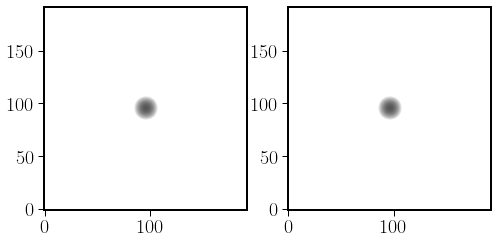

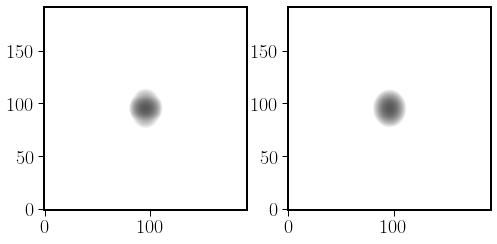

In [91]:
def measure_fwhm(array):
    """Fit a Gaussian2D model to a PSF and return the FWHM

    Parameters
    ----------
    array : numpy.ndarray
        Array containing PSF

    Returns
    -------
    x_fwhm : float
        FWHM in x direction in units of pixels

    y_fwhm : float
        FWHM in y direction in units of pixels
    """
    yp, xp = array.shape
    y, x, = np.mgrid[:yp, :xp]
    p_init = models.Gaussian2D(10,xp/2,yp/2)
    fit_p = fitting.LevMarLSQFitter()
    fitted_psf = fit_p(p_init, x, y, array)
    #print(fitted_psf)
    model_out = models.Gaussian2D(fitted_psf.amplitude,fitted_psf.x_mean,fitted_psf.y_mean,\
                                fitted_psf.x_stddev,fitted_psf.y_stddev,fitted_psf.theta)
    img_out = model_out(y,x)
    #print(img_out)
    fig,ax = plt.subplots(1,2,figsize=(8,6))
    ax[0].imshow(np.log10(array), cmap='gray_r', vmin=-10, vmax=5, origin='lower')
    ax[1].imshow(np.log10(img_out), cmap='gray_r', vmin=-10, vmax=5, origin='lower')
    return fitted_psf

fitted_psf = measure_fwhm(img_Gauss[int(0.3*ny):int(0.7*ny),int(0.3*nx):int(0.7*nx)])
fwhm_out=np.sqrt(fitted_psf.y_fwhm**2+fitted_psf.x_fwhm**2)*pix_size/np.sqrt(2)
print('FWHM_out = ',fwhm_out)
#img_Gauss_dec

fitted_psf = measure_fwhm(img_Gauss_dec[int(0.3*ny):int(0.7*ny),int(0.3*nx):int(0.7*nx)])
fwhm_out=np.sqrt(fitted_psf.y_fwhm**2+fitted_psf.x_fwhm**2)*pix_size/np.sqrt(2)
print('FWHM_out_dec = ',fwhm_out)

#print(fitted_psf.amplitude,fitted_psf.x_mean,fitted_psf.y_mean,\
#      fitted_psf.x_stddev,fitted_psf.y_stddev,fitted_psf.theta,fitted_psf.y_fwhm,fitted_psf.x_fwhm)



In [92]:
a_FWHM_input = np.arange(0.7,2.0,0.1)
a_FWHM_in=[]
a_FWHM_out=[]


FWHM_input =  0.7


<ipython-input-91-515ba4d66854>:28: RuntimeWarning: divide by zero encountered in log10
  ax[0].imshow(np.log10(array), cmap='gray_r', vmin=-10, vmax=5, origin='lower')
<ipython-input-91-515ba4d66854>:29: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_out), cmap='gray_r', vmin=-10, vmax=5, origin='lower')
<ipython-input-91-515ba4d66854>:28: RuntimeWarning: invalid value encountered in log10
  ax[0].imshow(np.log10(array), cmap='gray_r', vmin=-10, vmax=5, origin='lower')


FWHM_out =  0.7002438536625587
FWHM_out_dec =  0.739711214325727
FWHM_input =  0.7999999999999999


<ipython-input-91-515ba4d66854>:28: RuntimeWarning: divide by zero encountered in log10
  ax[0].imshow(np.log10(array), cmap='gray_r', vmin=-10, vmax=5, origin='lower')
<ipython-input-91-515ba4d66854>:29: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_out), cmap='gray_r', vmin=-10, vmax=5, origin='lower')
<ipython-input-91-515ba4d66854>:28: RuntimeWarning: invalid value encountered in log10
  ax[0].imshow(np.log10(array), cmap='gray_r', vmin=-10, vmax=5, origin='lower')


FWHM_out =  0.8002786899000675
FWHM_out_dec =  0.8222057785344214
FWHM_input =  0.8999999999999999


<ipython-input-91-515ba4d66854>:28: RuntimeWarning: divide by zero encountered in log10
  ax[0].imshow(np.log10(array), cmap='gray_r', vmin=-10, vmax=5, origin='lower')
<ipython-input-91-515ba4d66854>:29: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_out), cmap='gray_r', vmin=-10, vmax=5, origin='lower')
<ipython-input-91-515ba4d66854>:28: RuntimeWarning: invalid value encountered in log10
  ax[0].imshow(np.log10(array), cmap='gray_r', vmin=-10, vmax=5, origin='lower')


FWHM_out =  0.9003135261375761
FWHM_out_dec =  0.9105982574169097
FWHM_input =  0.9999999999999999


<ipython-input-91-515ba4d66854>:28: RuntimeWarning: divide by zero encountered in log10
  ax[0].imshow(np.log10(array), cmap='gray_r', vmin=-10, vmax=5, origin='lower')
<ipython-input-91-515ba4d66854>:29: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_out), cmap='gray_r', vmin=-10, vmax=5, origin='lower')
<ipython-input-91-515ba4d66854>:28: RuntimeWarning: invalid value encountered in log10
  ax[0].imshow(np.log10(array), cmap='gray_r', vmin=-10, vmax=5, origin='lower')


FWHM_out =  1.0003483623750942
FWHM_out_dec =  1.004892893526435
FWHM_input =  1.0999999999999999


<ipython-input-91-515ba4d66854>:28: RuntimeWarning: divide by zero encountered in log10
  ax[0].imshow(np.log10(array), cmap='gray_r', vmin=-10, vmax=5, origin='lower')
<ipython-input-91-515ba4d66854>:29: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_out), cmap='gray_r', vmin=-10, vmax=5, origin='lower')
<ipython-input-91-515ba4d66854>:28: RuntimeWarning: invalid value encountered in log10
  ax[0].imshow(np.log10(array), cmap='gray_r', vmin=-10, vmax=5, origin='lower')


FWHM_out =  1.1003831986146737
FWHM_out_dec =  1.102244223506353
FWHM_input =  1.1999999999999997


<ipython-input-91-515ba4d66854>:28: RuntimeWarning: divide by zero encountered in log10
  ax[0].imshow(np.log10(array), cmap='gray_r', vmin=-10, vmax=5, origin='lower')
<ipython-input-91-515ba4d66854>:29: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_out), cmap='gray_r', vmin=-10, vmax=5, origin='lower')
<ipython-input-91-515ba4d66854>:28: RuntimeWarning: invalid value encountered in log10
  ax[0].imshow(np.log10(array), cmap='gray_r', vmin=-10, vmax=5, origin='lower')


FWHM_out =  1.2004180348501012
FWHM_out_dec =  1.2013219096070313
FWHM_input =  1.2999999999999998


<ipython-input-91-515ba4d66854>:28: RuntimeWarning: divide by zero encountered in log10
  ax[0].imshow(np.log10(array), cmap='gray_r', vmin=-10, vmax=5, origin='lower')
<ipython-input-91-515ba4d66854>:29: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_out), cmap='gray_r', vmin=-10, vmax=5, origin='lower')
<ipython-input-91-515ba4d66854>:28: RuntimeWarning: invalid value encountered in log10
  ax[0].imshow(np.log10(array), cmap='gray_r', vmin=-10, vmax=5, origin='lower')


FWHM_out =  1.3004528710876098
FWHM_out_dec =  1.3010177264680012
FWHM_input =  1.4


<ipython-input-91-515ba4d66854>:28: RuntimeWarning: divide by zero encountered in log10
  ax[0].imshow(np.log10(array), cmap='gray_r', vmin=-10, vmax=5, origin='lower')
<ipython-input-91-515ba4d66854>:29: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_out), cmap='gray_r', vmin=-10, vmax=5, origin='lower')
<ipython-input-91-515ba4d66854>:28: RuntimeWarning: invalid value encountered in log10
  ax[0].imshow(np.log10(array), cmap='gray_r', vmin=-10, vmax=5, origin='lower')


FWHM_out =  1.4004877073251185
FWHM_out_dec =  1.400993850858347
FWHM_input =  1.4999999999999998


<ipython-input-91-515ba4d66854>:28: RuntimeWarning: divide by zero encountered in log10
  ax[0].imshow(np.log10(array), cmap='gray_r', vmin=-10, vmax=5, origin='lower')
<ipython-input-91-515ba4d66854>:29: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_out), cmap='gray_r', vmin=-10, vmax=5, origin='lower')
<ipython-input-91-515ba4d66854>:28: RuntimeWarning: invalid value encountered in log10
  ax[0].imshow(np.log10(array), cmap='gray_r', vmin=-10, vmax=5, origin='lower')


FWHM_out =  1.5005225435626266
FWHM_out_dec =  1.5031000059351352
FWHM_input =  1.5999999999999996


<ipython-input-91-515ba4d66854>:28: RuntimeWarning: divide by zero encountered in log10
  ax[0].imshow(np.log10(array), cmap='gray_r', vmin=-10, vmax=5, origin='lower')
<ipython-input-91-515ba4d66854>:29: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_out), cmap='gray_r', vmin=-10, vmax=5, origin='lower')
<ipython-input-91-515ba4d66854>:28: RuntimeWarning: invalid value encountered in log10
  ax[0].imshow(np.log10(array), cmap='gray_r', vmin=-10, vmax=5, origin='lower')


FWHM_out =  1.6005573798001311
FWHM_out_dec =  1.6025039791227118
FWHM_input =  1.6999999999999997


<ipython-input-91-515ba4d66854>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig,ax = plt.subplots(1,2,figsize=(8,6))
<ipython-input-91-515ba4d66854>:28: RuntimeWarning: divide by zero encountered in log10
  ax[0].imshow(np.log10(array), cmap='gray_r', vmin=-10, vmax=5, origin='lower')
<ipython-input-91-515ba4d66854>:29: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_out), cmap='gray_r', vmin=-10, vmax=5, origin='lower')
<ipython-input-91-515ba4d66854>:28: RuntimeWarning: invalid value encountered in log10
  ax[0].imshow(np.log10(array), cmap='gray_r', vmin=-10, vmax=5, origin='lower')


FWHM_out =  1.7005922160376434
FWHM_out_dec =  1.7017888718923782
FWHM_input =  1.7999999999999996


<ipython-input-91-515ba4d66854>:28: RuntimeWarning: divide by zero encountered in log10
  ax[0].imshow(np.log10(array), cmap='gray_r', vmin=-10, vmax=5, origin='lower')
<ipython-input-91-515ba4d66854>:29: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_out), cmap='gray_r', vmin=-10, vmax=5, origin='lower')
<ipython-input-91-515ba4d66854>:28: RuntimeWarning: invalid value encountered in log10
  ax[0].imshow(np.log10(array), cmap='gray_r', vmin=-10, vmax=5, origin='lower')


FWHM_out =  1.8006270522751597
FWHM_out_dec =  1.8016001247236142
FWHM_input =  1.8999999999999997


<ipython-input-91-515ba4d66854>:28: RuntimeWarning: divide by zero encountered in log10
  ax[0].imshow(np.log10(array), cmap='gray_r', vmin=-10, vmax=5, origin='lower')
<ipython-input-91-515ba4d66854>:29: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_out), cmap='gray_r', vmin=-10, vmax=5, origin='lower')
<ipython-input-91-515ba4d66854>:28: RuntimeWarning: invalid value encountered in log10
  ax[0].imshow(np.log10(array), cmap='gray_r', vmin=-10, vmax=5, origin='lower')


FWHM_out =  1.90066188851325
FWHM_out_dec =  1.9017632549324788


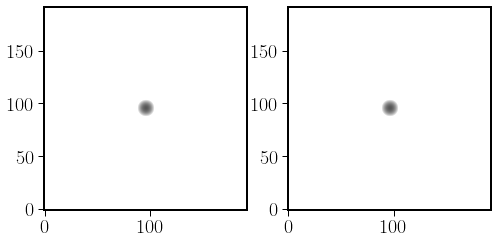

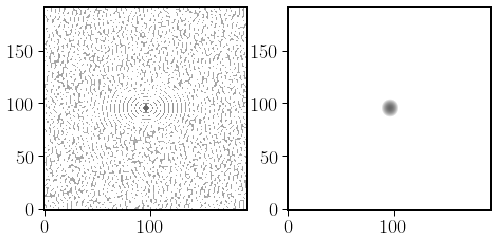

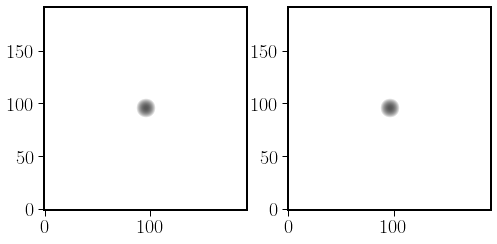

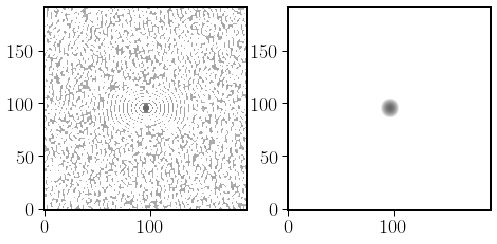

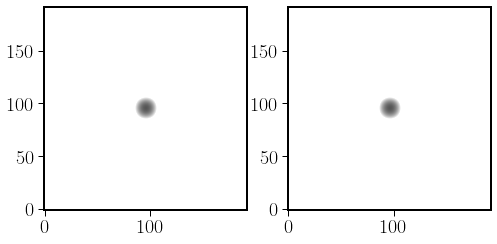

...

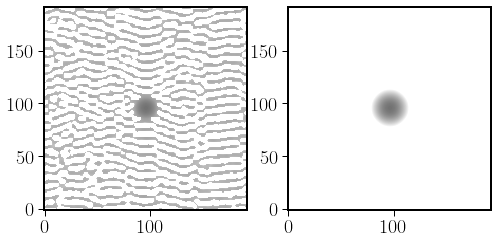

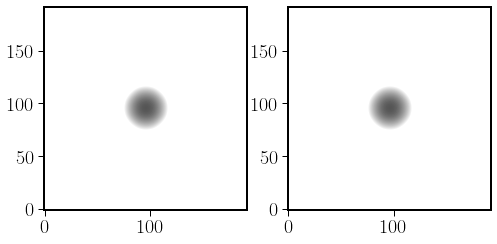

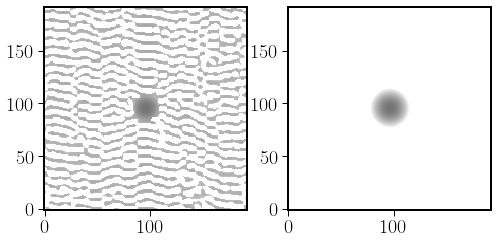

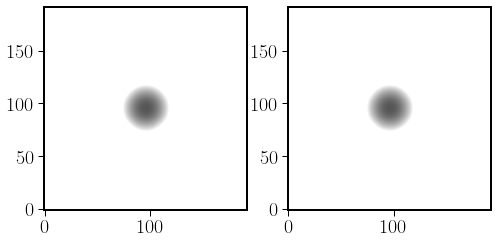

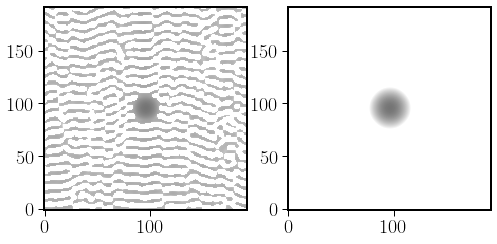

In [93]:
#a_FWHM_input = np.arange(0.7,1.7,0.1)
for FWHM_input in a_FWHM_input:
    sigma_FWHM=FWHM_input/pix_size/2.354
    print('FWHM_input = ', FWHM_input)
    img_Gauss=Gaussian2D_map(480,480,1,480*0.5,480*0.5,sigma_FWHM,sigma_FWHM,0)
    phot_Gauss = aperture_photometry(img_Gauss, aper_center,\
                                     method='subpixel',subpixels=5)
    img_Gauss_r,weights_Gauss_r = inter_map_IDW(phot_Gauss,new_radius,[0,0],[1,1],[480,480],slope=slope,\
                                                radius_limit=0.5*5/pix_size)

    phot_Gauss_org = aperture_photometry(img_Gauss, aper,\
                                         method='subpixel',subpixels=5)
    img_Gauss_org_r,weights_Gauss_r = inter_map_IDW(phot_Gauss_org,radius,[0,0],[1,1],[480,480],slope=slope,\
                                                    radius_limit=0.5*5/pix_size)

    phot_Gauss_mid = aperture_photometry(img_Gauss, aper_mid_points,\
                                         method='subpixel',subpixels=5)
    
    phot_Gauss_all=vstack_table([phot_Gauss, phot_Gauss_mid])


    img_Gauss_all,weights_Gauss_all = inter_map_IDW(phot_Gauss_all,new_radius,[0,0],[1,1],[480,480],slope=slope,\
                                                    radius_limit=0.5*5/pix_size)


    img_psf = img_Gauss_r[int(0.4*ny):int(0.6*ny),int(0.4*nx):int(0.6*nx)]
    img_psf_all_r = img_Gauss_all[int(0.4*ny):int(0.6*ny),int(0.4*nx):int(0.6*nx)]

    img_Gauss_all += img_Gauss_all.max() * 1E-5 * np.random.random(img_Gauss_all.shape)

    img_Gauss_dec, chain = restoration.unsupervised_wiener(img_Gauss_all, img_psf_all_r)#, num_iter=30)

    img_Gauss_dec_org = img_Gauss_dec.copy()
    img_Gauss_dec = gaussian_filter(img_Gauss_dec,sigma=sigma_FWHM)#*np.sum(img_Gauss)
    fitted_psf = measure_fwhm(img_Gauss[int(0.3*ny):int(0.7*ny),int(0.3*nx):int(0.7*nx)])
    fwhm_out=np.sqrt(fitted_psf.y_fwhm**2+fitted_psf.x_fwhm**2)*pix_size/np.sqrt(2)
    print('FWHM_out = ',fwhm_out)
    #img_Gauss_dec
    a_FWHM_in.append(fwhm_out)
    fitted_psf = measure_fwhm(img_Gauss_dec[int(0.3*ny):int(0.7*ny),int(0.3*nx):int(0.7*nx)])
    fwhm_out=np.sqrt(fitted_psf.y_fwhm**2+fitted_psf.x_fwhm**2)*pix_size/np.sqrt(2)
    print('FWHM_out_dec = ',fwhm_out)
    a_FWHM_out.append(fwhm_out)

a_FWHM_in=np.array(a_FWHM_in)
a_FWHM_out=np.array(a_FWHM_out)
#img_Gauss_dec = restoration.richardson_lucy(astro_noisy, psf, num_iter=30)

In [94]:
a_FWHM_in_ALL = a_FWHM_in.copy()
a_FWHM_out_ALL = a_FWHM_out.copy()


# For a FWHM_input=0.7"  => FWHM_out=1.3"
# For a FWHM_input=0.85" => FWHM_out=1.4"
# For a FWHM_input=1.0"  => FWHM_out=1.5"
# For a FWHM_input=
# For a FWHM_input=1.5"  => FWHM_out=2.0"
#

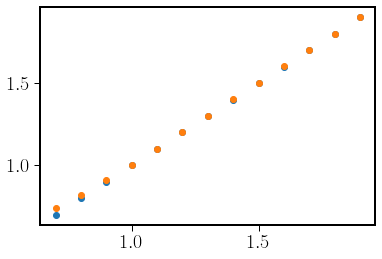

In [95]:
plt.scatter(a_FWHM_input,a_FWHM_in_ALL)
plt.scatter(a_FWHM_input,a_FWHM_out_ALL)


FWHM_input =  0.7


<ipython-input-91-515ba4d66854>:28: RuntimeWarning: divide by zero encountered in log10
  ax[0].imshow(np.log10(array), cmap='gray_r', vmin=-10, vmax=5, origin='lower')
<ipython-input-91-515ba4d66854>:29: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_out), cmap='gray_r', vmin=-10, vmax=5, origin='lower')


FWHM_out =  0.7002438536625587
FWHM_out_dec =  1.0577022422187434
FWHM_input =  0.7999999999999999


<ipython-input-91-515ba4d66854>:28: RuntimeWarning: divide by zero encountered in log10
  ax[0].imshow(np.log10(array), cmap='gray_r', vmin=-10, vmax=5, origin='lower')
<ipython-input-91-515ba4d66854>:29: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_out), cmap='gray_r', vmin=-10, vmax=5, origin='lower')


FWHM_out =  0.8002786899000675
FWHM_out_dec =  1.1272291538808383
FWHM_input =  0.8999999999999999


<ipython-input-91-515ba4d66854>:28: RuntimeWarning: divide by zero encountered in log10
  ax[0].imshow(np.log10(array), cmap='gray_r', vmin=-10, vmax=5, origin='lower')
<ipython-input-91-515ba4d66854>:29: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_out), cmap='gray_r', vmin=-10, vmax=5, origin='lower')


FWHM_out =  0.9003135261375761
FWHM_out_dec =  1.2003161033170762
FWHM_input =  0.9999999999999999


<ipython-input-91-515ba4d66854>:28: RuntimeWarning: divide by zero encountered in log10
  ax[0].imshow(np.log10(array), cmap='gray_r', vmin=-10, vmax=5, origin='lower')
<ipython-input-91-515ba4d66854>:29: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_out), cmap='gray_r', vmin=-10, vmax=5, origin='lower')


FWHM_out =  1.0003483623750942
FWHM_out_dec =  1.2769095158882005
FWHM_input =  1.0999999999999999


<ipython-input-91-515ba4d66854>:28: RuntimeWarning: divide by zero encountered in log10
  ax[0].imshow(np.log10(array), cmap='gray_r', vmin=-10, vmax=5, origin='lower')
<ipython-input-91-515ba4d66854>:29: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_out), cmap='gray_r', vmin=-10, vmax=5, origin='lower')


FWHM_out =  1.1003831986146737
FWHM_out_dec =  1.356889548388386
FWHM_input =  1.1999999999999997


<ipython-input-91-515ba4d66854>:28: RuntimeWarning: divide by zero encountered in log10
  ax[0].imshow(np.log10(array), cmap='gray_r', vmin=-10, vmax=5, origin='lower')
<ipython-input-91-515ba4d66854>:29: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_out), cmap='gray_r', vmin=-10, vmax=5, origin='lower')


FWHM_out =  1.2004180348501012
FWHM_out_dec =  1.4405985132170014
FWHM_input =  1.2999999999999998


<ipython-input-91-515ba4d66854>:28: RuntimeWarning: divide by zero encountered in log10
  ax[0].imshow(np.log10(array), cmap='gray_r', vmin=-10, vmax=5, origin='lower')
<ipython-input-91-515ba4d66854>:29: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_out), cmap='gray_r', vmin=-10, vmax=5, origin='lower')


FWHM_out =  1.3004528710876098
FWHM_out_dec =  1.5284713417739706
FWHM_input =  1.4


<ipython-input-91-515ba4d66854>:28: RuntimeWarning: divide by zero encountered in log10
  ax[0].imshow(np.log10(array), cmap='gray_r', vmin=-10, vmax=5, origin='lower')
<ipython-input-91-515ba4d66854>:29: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_out), cmap='gray_r', vmin=-10, vmax=5, origin='lower')


FWHM_out =  1.4004877073251185
FWHM_out_dec =  1.6212898276147591
FWHM_input =  1.4999999999999998


<ipython-input-91-515ba4d66854>:28: RuntimeWarning: divide by zero encountered in log10
  ax[0].imshow(np.log10(array), cmap='gray_r', vmin=-10, vmax=5, origin='lower')
<ipython-input-91-515ba4d66854>:29: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_out), cmap='gray_r', vmin=-10, vmax=5, origin='lower')


FWHM_out =  1.5005225435626266
FWHM_out_dec =  1.7199522076515703
FWHM_input =  1.5999999999999996


<ipython-input-91-515ba4d66854>:28: RuntimeWarning: divide by zero encountered in log10
  ax[0].imshow(np.log10(array), cmap='gray_r', vmin=-10, vmax=5, origin='lower')
<ipython-input-91-515ba4d66854>:29: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_out), cmap='gray_r', vmin=-10, vmax=5, origin='lower')


FWHM_out =  1.6005573798001311
FWHM_out_dec =  1.8266191019238154
FWHM_input =  1.6999999999999997


<ipython-input-91-515ba4d66854>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig,ax = plt.subplots(1,2,figsize=(8,6))
<ipython-input-91-515ba4d66854>:28: RuntimeWarning: divide by zero encountered in log10
  ax[0].imshow(np.log10(array), cmap='gray_r', vmin=-10, vmax=5, origin='lower')
<ipython-input-91-515ba4d66854>:29: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_out), cmap='gray_r', vmin=-10, vmax=5, origin='lower')


FWHM_out =  1.7005922160376434
FWHM_out_dec =  1.942578705094941
FWHM_input =  1.7999999999999996


<ipython-input-91-515ba4d66854>:28: RuntimeWarning: divide by zero encountered in log10
  ax[0].imshow(np.log10(array), cmap='gray_r', vmin=-10, vmax=5, origin='lower')
<ipython-input-91-515ba4d66854>:29: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_out), cmap='gray_r', vmin=-10, vmax=5, origin='lower')


FWHM_out =  1.8006270522751597
FWHM_out_dec =  2.071939409681921
FWHM_input =  1.8999999999999997


<ipython-input-91-515ba4d66854>:28: RuntimeWarning: divide by zero encountered in log10
  ax[0].imshow(np.log10(array), cmap='gray_r', vmin=-10, vmax=5, origin='lower')
<ipython-input-91-515ba4d66854>:29: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_out), cmap='gray_r', vmin=-10, vmax=5, origin='lower')


FWHM_out =  1.90066188851325
FWHM_out_dec =  2.22253387164439


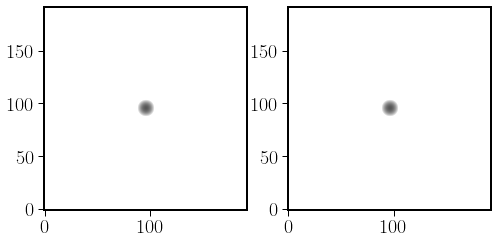

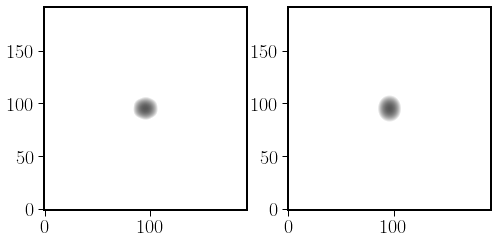

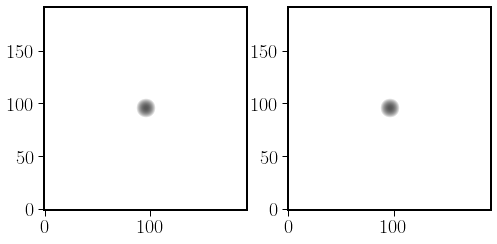

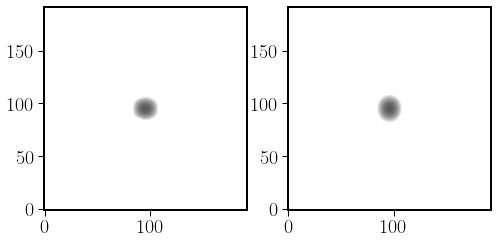

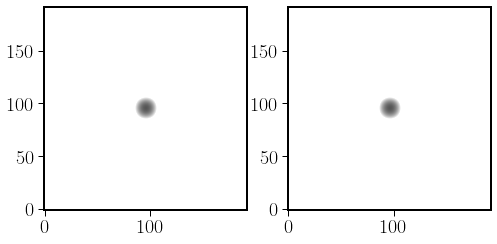

...

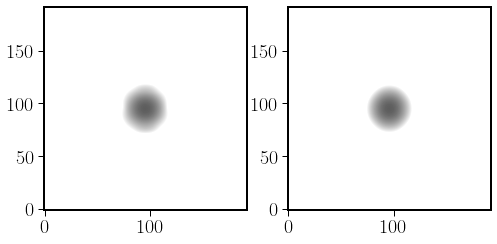

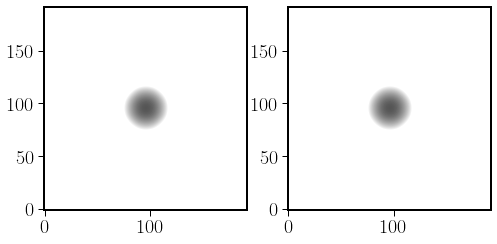

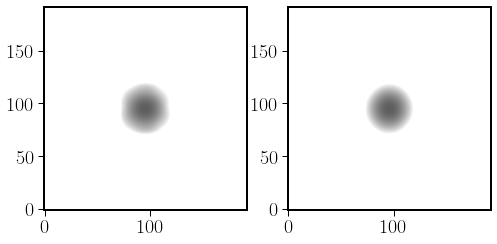

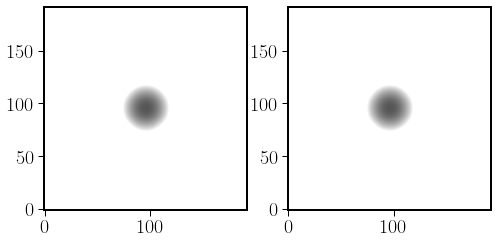

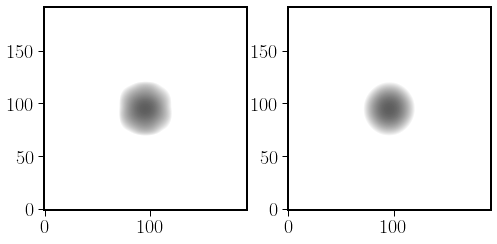

In [96]:
#a_FWHM_input = np.arange(0.7,1.7,0.1)
a_FWHM_input = np.arange(0.7,2.0,0.1)
#a_FWHM_input = np.arange(1.0,1.2,0.1)
a_FWHM_in=[]
a_FWHM_out=[]

f_e=0.01
for FWHM_input in a_FWHM_input:
    sigma_FWHM=FWHM_input/pix_size/2.354
    print('FWHM_input = ', FWHM_input)
    img_Gauss=Gaussian2D_map(480,480,1,480*0.5,480*0.5,sigma_FWHM,sigma_FWHM,0)
    phot_Gauss = aperture_photometry(img_Gauss, aper_center,\
                                     method='subpixel',subpixels=5)
    img_Gauss_r,weights_Gauss_r = inter_map_IDW(phot_Gauss,new_radius,[0,0],[1,1],[480,480],slope=slope,\
                                                radius_limit=0.5*5/pix_size)
    img_psf = img_Gauss_r[int(0.4*ny):int(0.6*ny),int(0.4*nx):int(0.6*nx)]
    img_Gauss_r += img_Gauss_r.max() * 1E-5 * np.random.random(img_Gauss_r.shape)
    img_Gauss_dec=restoration.richardson_lucy(img_Gauss_r, img_psf_r,10,clip=True,filter_epsilon=f_e)
    img_Gauss_dec_org = img_Gauss_dec.copy()
    img_Gauss_dec = gaussian_filter(img_Gauss_dec,sigma=sigma_FWHM)#*np.sum(img_Gauss)
    fitted_psf = measure_fwhm(img_Gauss[int(0.3*ny):int(0.7*ny),int(0.3*nx):int(0.7*nx)])
    fwhm_out=np.sqrt(fitted_psf.y_fwhm**2+fitted_psf.x_fwhm**2)*pix_size/np.sqrt(2)
    print('FWHM_out = ',fwhm_out)
    #img_Gauss_dec
    a_FWHM_in.append(fwhm_out)
    fitted_psf = measure_fwhm(img_Gauss_dec[int(0.3*ny):int(0.7*ny),int(0.3*nx):int(0.7*nx)])
    fwhm_out=np.sqrt(fitted_psf.y_fwhm**2+fitted_psf.x_fwhm**2)*pix_size/np.sqrt(2)
    print('FWHM_out_dec = ',fwhm_out)
    a_FWHM_out.append(fwhm_out)

a_FWHM_in=np.array(a_FWHM_in)
a_FWHM_out=np.array(a_FWHM_out)
#img_Gauss_dec = restoration.richardson_lucy(astro_noisy, psf, num_iter=30)

In [97]:
a_FWHM_in_r = a_FWHM_in.copy()
a_FWHM_out_r = a_FWHM_out.copy()



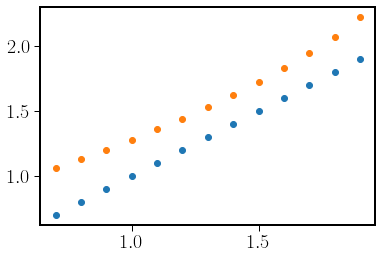

In [98]:
plt.scatter(a_FWHM_input,a_FWHM_in_r)
plt.scatter(a_FWHM_input,a_FWHM_out_r)



In [99]:
FWHM_input=1.0
sigma_FWHM=FWHM_input/pix_size/2.354
print('FWHM_input = ', FWHM_input)
img_Gauss=Gaussian2D_map(480,480,1,480*0.5,480*0.5,sigma_FWHM,sigma_FWHM,0)
phot_Gauss = aperture_photometry(img_Gauss, aper_center,\
                                 method='subpixel',subpixels=5)
img_Gauss_r,weights_Gauss_r = inter_map_IDW(phot_Gauss,new_radius,[0,0],[1,1],[480,480],slope=slope,\
                                            radius_limit=0.5*5/pix_size)
img_psf = img_Gauss_r[int(0.4*ny):int(0.6*ny),int(0.4*nx):int(0.6*nx)]

FWHM_input =  1.0


In [100]:
print(img_loop)

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


In [103]:
#print(img_center)
img_center=img_loop

<ipython-input-104-60fecc0b8679>:18: RuntimeWarning: invalid value encountered in log10
  ax[0].imshow(np.log10(hdu.data), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')
<ipython-input-104-60fecc0b8679>:21: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_center), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')
<ipython-input-104-60fecc0b8679>:24: RuntimeWarning: divide by zero encountered in log10
  ax[2].imshow(np.log10(img_loop_dec), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')


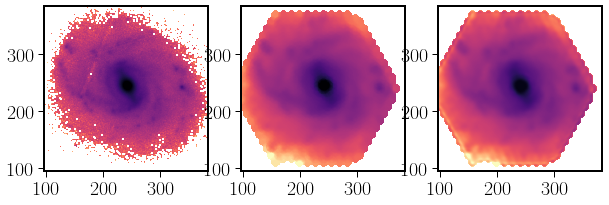

In [104]:
#img_loop = img_center
img_psf_r = img_Gauss_r[int(0.4*ny):int(0.6*ny),int(0.4*nx):int(0.6*nx)]
#img_psf_r = img_psf_r/np.sum(img_psf_r)
#img_loop_in = img_loop+img_loop.max() * 1E-5 * np.random.random(img_loop.shape)
img_loop_in = img_center+img_center.max() * 1E-5 * np.random.random(img_center.shape)
img_loop_dec = restoration.richardson_lucy(img_loop_in, img_psf_r,10)#, num_iter=30)
#img_loop_dec, chain = restoration.unsupervised_wiener(img_loop, img_psf_r)#, num_iter=30)
#img_loop_dec = restoration.wiener(img_loop, img_psf_r,100000)#, num_iter=30)
img_loop_dec = gaussian_filter(img_loop_dec,sigma=1.0/pix_size/2.354)#*np.sum(img_Gauss)
#img_loop_dec = img_loop_de
#img_loop_dec=convolve2d(img_loop_dec, img_Gauss_dec_org[int(0.45*ny):int(0.55*ny),int(0.45*nx):int(0.55*nx)])[0:ny,0:nx]
flux_ratio = np.sum(img_loop)/np.sum(img_loop_dec)
img_loop_dec = img_loop_dec*flux_ratio
img_loop_dec[img_loop==0]=0


fig,ax = plt.subplots(1,3,figsize=(10,8))
ax[0].imshow(np.log10(hdu.data), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')
ax[0].set_xlim([0.2*nx,0.8*nx])
ax[0].set_ylim([0.2*ny,0.8*ny])
ax[1].imshow(np.log10(img_center), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')
ax[1].set_xlim([0.2*nx,0.8*nx])
ax[1].set_ylim([0.2*ny,0.8*ny])
ax[2].imshow(np.log10(img_loop_dec), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')
ax[2].set_xlim([0.2*nx,0.8*nx])
ax[2].set_ylim([0.2*ny,0.8*ny])

img_loop_center_dec=img_loop_dec
plt.show()


sigma_min= 5.400000000000002 1.3500000326894173
Final FWHM =  2.043991212542483


<ipython-input-20-ae5863308741>:4: RuntimeWarning: invalid value encountered in log10
  ax[0].imshow(np.log10(img_in), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')
<ipython-input-20-ae5863308741>:6: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_now), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')


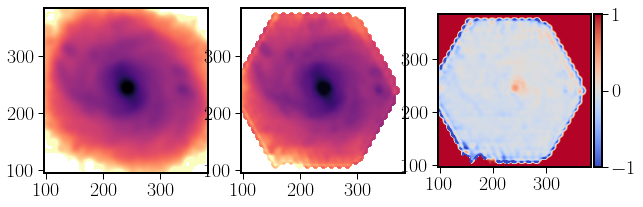

In [105]:
img_test=img_loop_dec
#plot_three(hdu.data,img_test,hdu.data-img_test)
diff_min=1e12
sigma_min=0.1
for sigma in arange(0.2,10,0.1):
    s_img = gaussian_filter(hdu.data,sigma=sigma)
    diff = img_test-s_img
    d=img_test.shape
    mean_diff = np.sum(np.abs(diff[img_test>0]/img_test[img_test>0])**2)/(d[0]*d[1])
    #print(sigma,mean_diff)
    if (mean_diff<diff_min):
        diff_min=mean_diff
        sigma_min=sigma
FWHM_PS = 1.0
print('sigma_min=',sigma_min,sigma_min*pix_size)
print('Final FWHM = ',np.sqrt(FWHM_PS**2+sigma_min*pix_size*2.354))
s_img = gaussian_filter(hdu.data,sigma=sigma_min)
plot_three(s_img,img_test,s_img-img_test)

In [106]:
#
# FURTHER TESTS 3.5.2022
#

In [107]:
sigma_min= 3.4000000000000012 0.8500000205822257
Final FWHM =  1.7323106096917376

SyntaxError: invalid syntax (<ipython-input-107-92e2eedb354d>, line 1)

<ipython-input-108-b9139b804d10>:11: RuntimeWarning: divide by zero encountered in log10
  ax[0].imshow(np.log10(img_Gauss), cmap='gray_r', vmin=-10, vmax=5, origin='lower')
<ipython-input-108-b9139b804d10>:17: RuntimeWarning: invalid value encountered in log10
  ax[2].imshow(np.log10(img_Gauss_dec), cmap='gray_r', vmin=-10, vmax=5, origin='lower')


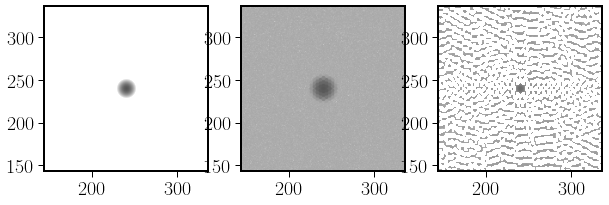

In [108]:
img_psf_all_r = img_Gauss_all[int(0.4*ny):int(0.6*ny),int(0.4*nx):int(0.6*nx)]
#img_psf_r = img_psf_r/np.sum(img_psf_r)
#plt.imshow(img_psf)
img_Gauss_all += img_Gauss_all.max() * 1E-5 * np.random.random(img_Gauss_all.shape)
#img_Gauss_dec = restoration.richardson_lucy(img_Gauss_r, img_psf_r,5)
img_Gauss_dec, chain = restoration.unsupervised_wiener(img_Gauss_all, img_psf_all_r)#, num_iter=30)
#img_Gauss_dec = restoration.wiener(img_Gauss_r, img_psf_r,0.1)#, num_iter=30)
img_Gauss_dec_org = img_Gauss_dec.copy()
img_Gauss_dec = gaussian_filter(img_Gauss_dec,sigma=sigma_FWHM)#*np.sum(img_Gauss)
fig,ax = plt.subplots(1,3,figsize=(10,8))
ax[0].imshow(np.log10(img_Gauss), cmap='gray_r', vmin=-10, vmax=5, origin='lower')
ax[0].set_xlim([0.3*nx,0.7*nx])
ax[0].set_ylim([0.3*ny,0.7*ny])
ax[1].imshow(np.log10(img_Gauss_all), cmap='gray_r', vmin=-10, vmax=5, origin='lower')
ax[1].set_xlim([0.3*nx,0.7*nx])
ax[1].set_ylim([0.3*ny,0.7*ny])
ax[2].imshow(np.log10(img_Gauss_dec), cmap='gray_r', vmin=-10, vmax=5, origin='lower')
ax[2].set_xlim([0.3*nx,0.7*nx])
ax[2].set_ylim([0.3*ny,0.7*ny])

plt.show()


In [109]:
slope=0.75
img_org_075,weights_org = inter_map_IDW(phot_table,\
                                      radius,[0,0],[1,1],[480,480],slope=slope,\
                            radius_limit=3.5/pix_size)

sigma_min= 6.700000000000002 1.6750000405590915
Final FWHM =  2.223274633390149


<ipython-input-20-ae5863308741>:4: RuntimeWarning: invalid value encountered in log10
  ax[0].imshow(np.log10(img_in), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')
<ipython-input-20-ae5863308741>:6: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_now), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')


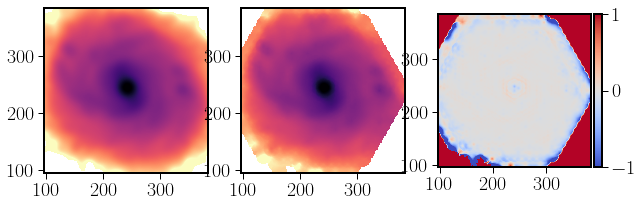

In [110]:
img_test=img_org_075
#plot_three(hdu.data,img_test,hdu.data-img_test)
diff_min=1e12
sigma_min=0.1
for sigma in arange(0.2,10,0.1):
    s_img = gaussian_filter(hdu.data,sigma=sigma)
    diff = img_test-s_img
    d=img_test.shape
    mean_diff = np.sum(np.abs(diff[img_test>0]/img_test[img_test>0])**2)/(d[0]*d[1])
    #print(sigma,mean_diff)
    if (mean_diff<diff_min):
        diff_min=mean_diff
        sigma_min=sigma
FWHM_PS = 1.0
print('sigma_min=',sigma_min,sigma_min*pix_size)
print('Final FWHM = ',np.sqrt(FWHM_PS**2+sigma_min*pix_size*2.354))
s_img = gaussian_filter(hdu.data,sigma=sigma_min)
plot_three(s_img,img_test,s_img-img_test)

In [111]:
slope=2.5
img_org,weights_org = inter_map_IDW(phot_table,\
                                      radius,[0,0],[1,1],[480,480],slope=slope,\
                            radius_limit=3.5/pix_size)
img_loop=img_org

sigma_min= 3.6000000000000014 0.9000000217929448
Final FWHM =  1.7659558463621314


<ipython-input-20-ae5863308741>:4: RuntimeWarning: invalid value encountered in log10
  ax[0].imshow(np.log10(img_in), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')
<ipython-input-20-ae5863308741>:6: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_now), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')


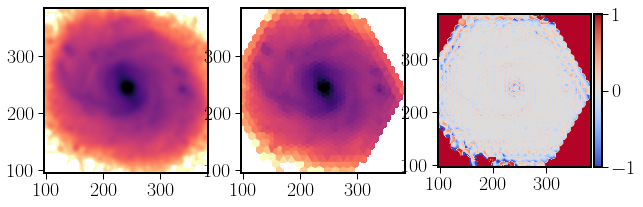

In [112]:
img_test=img_org
#plot_three(hdu.data,img_test,hdu.data-img_test)
diff_min=1e12
sigma_min=0.1
for sigma in arange(0.2,10,0.1):
    s_img = gaussian_filter(hdu.data,sigma=sigma)
    diff = img_test-s_img
    d=img_test.shape
    mean_diff = np.sum(np.abs(diff[img_test>0]/img_test[img_test>0])**2)/(d[0]*d[1])
    #print(sigma,mean_diff)
    if (mean_diff<diff_min):
        diff_min=mean_diff
        sigma_min=sigma
FWHM_PS = 1.0
print('sigma_min=',sigma_min,sigma_min*pix_size)
print('Final FWHM = ',np.sqrt(FWHM_PS**2+sigma_min*pix_size*2.354))
s_img = gaussian_filter(hdu.data,sigma=sigma_min)
plot_three(s_img,img_test,s_img-img_test)

In [113]:
slope=2.5
img_center,weights_center = inter_map_IDW(phot_table_center_est,\
                                      new_radius,[0,0],[1,1],[480,480],slope=slope,\
                            radius_limit=3.5/pix_size)

In [114]:
#print(phot_table_center_est)

sigma_min= 3.4000000000000012 0.8500000205822257
Final FWHM =  1.7323106096917376


<ipython-input-20-ae5863308741>:4: RuntimeWarning: invalid value encountered in log10
  ax[0].imshow(np.log10(img_in), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')
<ipython-input-20-ae5863308741>:6: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_now), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')


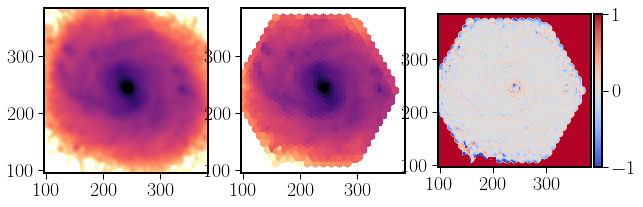

In [115]:
img_test=img_center
#plot_three(hdu.data,img_test,hdu.data-img_test)
diff_min=1e12
sigma_min=0.1
for sigma in arange(0.2,10,0.1):
    s_img = gaussian_filter(hdu.data,sigma=sigma)
    diff = img_test-s_img
    d=img_test.shape
    mean_diff = np.sum(np.abs(diff[img_test>0]/img_test[img_test>0])**2)/(d[0]*d[1])
    #print(sigma,mean_diff)
    if (mean_diff<diff_min):
        diff_min=mean_diff
        sigma_min=sigma
FWHM_PS = 1.0
print('sigma_min=',sigma_min,sigma_min*pix_size)
print('Final FWHM = ',np.sqrt(FWHM_PS**2+sigma_min*pix_size*2.354))
s_img = gaussian_filter(hdu.data,sigma=sigma_min)
plot_three(s_img,img_test,s_img-img_test)

<ipython-input-116-2b5c7c282102>:18: RuntimeWarning: invalid value encountered in log10
  ax[0].imshow(np.log10(hdu.data), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')
<ipython-input-116-2b5c7c282102>:21: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_center), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')
<ipython-input-116-2b5c7c282102>:24: RuntimeWarning: divide by zero encountered in log10
  ax[2].imshow(np.log10(img_loop_dec), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')


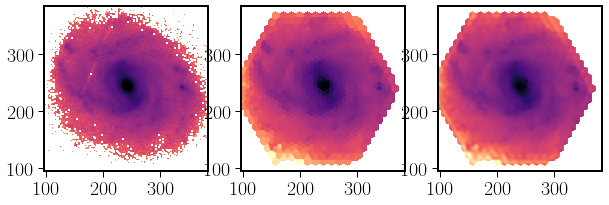

In [116]:
img_loop = img_center
img_psf_r = img_Gauss_r[int(0.4*ny):int(0.6*ny),int(0.4*nx):int(0.6*nx)]
#img_psf_r = img_psf_r/np.sum(img_psf_r)
#img_loop_in = img_loop+img_loop.max() * 1E-5 * np.random.random(img_loop.shape)
img_loop_in = img_center+img_center.max() * 1E-5 * np.random.random(img_center.shape)
img_loop_dec = restoration.richardson_lucy(img_loop_in, img_psf_r,10)#, num_iter=30)
#img_loop_dec, chain = restoration.unsupervised_wiener(img_loop, img_psf_r)#, num_iter=30)
#img_loop_dec = restoration.wiener(img_loop, img_psf_r,100000)#, num_iter=30)
img_loop_dec = gaussian_filter(img_loop_dec,sigma=1.25/pix_size/2.354)#*np.sum(img_Gauss)
#img_loop_dec = img_loop_de
#img_loop_dec=convolve2d(img_loop_dec, img_Gauss_dec_org[int(0.45*ny):int(0.55*ny),int(0.45*nx):int(0.55*nx)])[0:ny,0:nx]
flux_ratio = np.sum(img_loop)/np.sum(img_loop_dec)
img_loop_dec = img_loop_dec*flux_ratio
img_loop_dec[img_loop==0]=0


fig,ax = plt.subplots(1,3,figsize=(10,8))
ax[0].imshow(np.log10(hdu.data), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')
ax[0].set_xlim([0.2*nx,0.8*nx])
ax[0].set_ylim([0.2*ny,0.8*ny])
ax[1].imshow(np.log10(img_center), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')
ax[1].set_xlim([0.2*nx,0.8*nx])
ax[1].set_ylim([0.2*ny,0.8*ny])
ax[2].imshow(np.log10(img_loop_dec), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')
ax[2].set_xlim([0.2*nx,0.8*nx])
ax[2].set_ylim([0.2*ny,0.8*ny])

img_loop_center_dec=img_loop_dec
plt.show()


sigma_min= 3.6000000000000014 0.9000000217929448
Final FWHM =  1.7659558463621314


<ipython-input-20-ae5863308741>:4: RuntimeWarning: invalid value encountered in log10
  ax[0].imshow(np.log10(img_in), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')
<ipython-input-20-ae5863308741>:6: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_now), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')


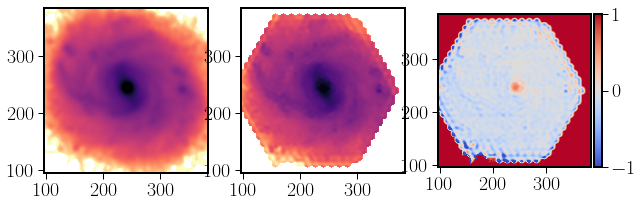

In [117]:
img_test=img_loop_dec
#plot_three(hdu.data,img_test,hdu.data-img_test)
diff_min=1e12
sigma_min=0.1
for sigma in arange(0.2,10,0.1):
    s_img = gaussian_filter(hdu.data,sigma=sigma)
    diff = img_test-s_img
    d=img_test.shape
    mean_diff = np.sum(np.abs(diff[img_test>0]/img_test[img_test>0])**2)/(d[0]*d[1])
    #print(sigma,mean_diff)
    if (mean_diff<diff_min):
        diff_min=mean_diff
        sigma_min=sigma
FWHM_PS = 1.0
print('sigma_min=',sigma_min,sigma_min*pix_size)
print('Final FWHM = ',np.sqrt(FWHM_PS**2+sigma_min*pix_size*2.354))
s_img = gaussian_filter(hdu.data,sigma=sigma_min)
plot_three(s_img,img_test,s_img-img_test)

<ipython-input-118-d1fdb1e3ef58>:17: RuntimeWarning: invalid value encountered in log10
  ax[0].imshow(np.log10(hdu.data), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')
<ipython-input-118-d1fdb1e3ef58>:20: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_all), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')
<ipython-input-118-d1fdb1e3ef58>:23: RuntimeWarning: divide by zero encountered in log10
  ax[2].imshow(np.log10(img_loop_dec), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')


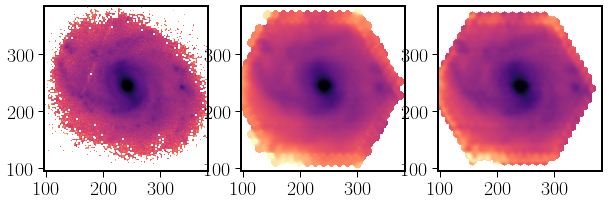

In [118]:
img_psf_r = img_Gauss_all[int(0.4*ny):int(0.6*ny),int(0.4*nx):int(0.6*nx)]
#img_psf_r = img_psf_r/np.sum(img_psf_r)
#img_loop_in = img_loop+img_loop.max() * 1E-5 * np.random.random(img_loop.shape)
img_loop_in = img_all+img_all.max() * 1E-5 * np.random.random(img_all.shape)
img_loop_dec = restoration.richardson_lucy(img_loop_in, img_psf_r,10)#, num_iter=30)
#img_loop_dec, chain = restoration.unsupervised_wiener(img_loop, img_psf_r)#, num_iter=30)
#img_loop_dec = restoration.wiener(img_loop, img_psf_r,100000)#, num_iter=30)
img_loop_dec = gaussian_filter(img_loop_dec,sigma=1.5)#*np.sum(img_Gauss)
#img_loop_dec = img_loop_de
#img_loop_dec=convolve2d(img_loop_dec, img_Gauss_dec_org[int(0.45*ny):int(0.55*ny),int(0.45*nx):int(0.55*nx)])[0:ny,0:nx]
flux_ratio = np.sum(img_loop)/np.sum(img_loop_dec)
img_loop_dec = img_loop_dec*flux_ratio
img_loop_dec[img_loop==0]=0


fig,ax = plt.subplots(1,3,figsize=(10,8))
ax[0].imshow(np.log10(hdu.data), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')
ax[0].set_xlim([0.2*nx,0.8*nx])
ax[0].set_ylim([0.2*ny,0.8*ny])
ax[1].imshow(np.log10(img_all), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')
ax[1].set_xlim([0.2*nx,0.8*nx])
ax[1].set_ylim([0.2*ny,0.8*ny])
ax[2].imshow(np.log10(img_loop_dec), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')
ax[2].set_xlim([0.2*nx,0.8*nx])
ax[2].set_ylim([0.2*ny,0.8*ny])

plt.show()


<ipython-input-119-5b027eeaba3c>:17: RuntimeWarning: invalid value encountered in log10
  ax[0].imshow(np.log10(hdu.data), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')
<ipython-input-119-5b027eeaba3c>:20: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_org), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')
<ipython-input-119-5b027eeaba3c>:23: RuntimeWarning: divide by zero encountered in log10
  ax[2].imshow(np.log10(img_loop_dec), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')


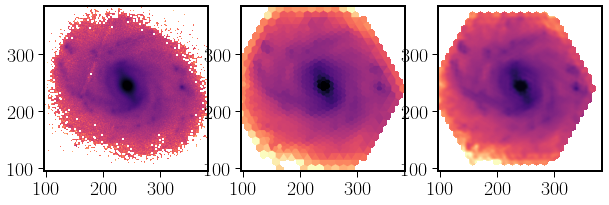

In [119]:
img_psf_r = img_Gauss_org_r[int(0.4*ny):int(0.6*ny),int(0.4*nx):int(0.6*nx)]
#img_psf_r = img_psf_r/np.sum(img_psf_r)
#img_loop_in = img_loop+img_loop.max() * 1E-5 * np.random.random(img_loop.shape)
img_loop_in = img_org+img_org.max() * 1E-5 * np.random.random(img_org.shape)
img_loop_dec = restoration.richardson_lucy(img_loop_in, img_psf_r,10)#, num_iter=30)
#img_loop_dec, chain = restoration.unsupervised_wiener(img_loop, img_psf_r)#, num_iter=30)
#img_loop_dec = restoration.wiener(img_loop, img_psf_r,100000)#, num_iter=30)
img_loop_dec = gaussian_filter(img_loop_dec,sigma=1.5)#*np.sum(img_Gauss)
#img_loop_dec = img_loop_de
#img_loop_dec=convolve2d(img_loop_dec, img_Gauss_dec_org[int(0.45*ny):int(0.55*ny),int(0.45*nx):int(0.55*nx)])[0:ny,0:nx]
flux_ratio = np.sum(img_loop)/np.sum(img_loop_dec)
img_loop_dec = img_loop_dec*flux_ratio
img_loop_dec[img_loop==0]=0


fig,ax = plt.subplots(1,3,figsize=(10,8))
ax[0].imshow(np.log10(hdu.data), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')
ax[0].set_xlim([0.2*nx,0.8*nx])
ax[0].set_ylim([0.2*ny,0.8*ny])
ax[1].imshow(np.log10(img_org), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')
ax[1].set_xlim([0.2*nx,0.8*nx])
ax[1].set_ylim([0.2*ny,0.8*ny])
ax[2].imshow(np.log10(img_loop_dec), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')
ax[2].set_xlim([0.2*nx,0.8*nx])
ax[2].set_ylim([0.2*ny,0.8*ny])

plt.show()


sigma_min= 3.8000000000000016 0.950000023003664
Final FWHM =  1.798971943680786


<ipython-input-20-ae5863308741>:4: RuntimeWarning: invalid value encountered in log10
  ax[0].imshow(np.log10(img_in), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')
<ipython-input-20-ae5863308741>:6: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_now), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')


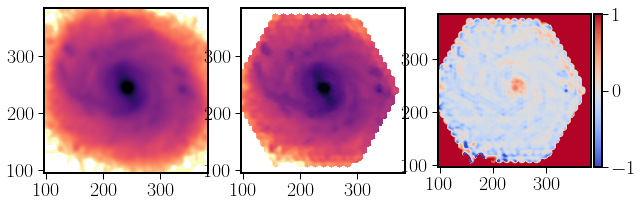

In [120]:
img_test=img_loop_dec
#plot_three(hdu.data,img_test,hdu.data-img_test)
diff_min=1e12
sigma_min=0.1
for sigma in arange(0.2,10,0.1):
    s_img = gaussian_filter(hdu.data,sigma=sigma)
    diff = img_test-s_img
    d=img_test.shape
    mean_diff = np.sum(np.abs(diff[img_test>0]/img_test[img_test>0])**2)/(d[0]*d[1])
    #print(sigma,mean_diff)
    if (mean_diff<diff_min):
        diff_min=mean_diff
        sigma_min=sigma
FWHM_PS = 1.0
print('sigma_min=',sigma_min,sigma_min*pix_size)
print('Final FWHM = ',np.sqrt(FWHM_PS**2+sigma_min*pix_size*2.354))
s_img = gaussian_filter(hdu.data,sigma=sigma_min)
plot_three(s_img,img_test,s_img-img_test)

In [121]:
flat_img = img_loop_dec/img_org

<ipython-input-121-07c80f6ae692>:1: RuntimeWarning: invalid value encountered in true_divide
  flat_img = img_loop_dec/img_org


sigma_min= 3.6000000000000014 0.9000000217929448
Final FWHM =  1.7659558463621314


<ipython-input-20-ae5863308741>:4: RuntimeWarning: invalid value encountered in log10
  ax[0].imshow(np.log10(img_in), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')
<ipython-input-20-ae5863308741>:6: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_now), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')


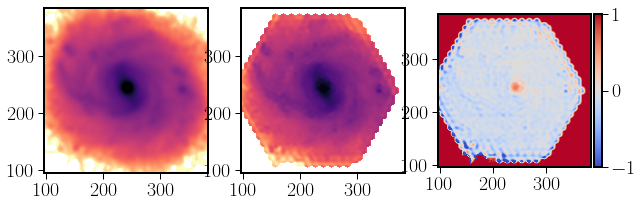

In [122]:
img_test=img_loop_center_dec
#plot_three(hdu.data,img_test,hdu.data-img_test)
diff_min=1e12
sigma_min=0.1
for sigma in arange(0.2,10,0.1):
    s_img = gaussian_filter(hdu.data,sigma=sigma)
    diff = img_test-s_img
    d=img_test.shape
    mean_diff = np.sum(np.abs(diff[img_test>0]/img_test[img_test>0])**2)/(d[0]*d[1])
    #print(sigma,mean_diff)
    if (mean_diff<diff_min):
        diff_min=mean_diff
        sigma_min=sigma
FWHM_PS = 1.0
print('sigma_min=',sigma_min,sigma_min*pix_size)
print('Final FWHM = ',np.sqrt(FWHM_PS**2+sigma_min*pix_size*2.354))
s_img = gaussian_filter(hdu.data,sigma=sigma_min)
plot_three(s_img,img_test,s_img-img_test)

sigma_min= 3.8000000000000016 0.950000023003664
Final FWHM =  1.798971943680786


<ipython-input-20-ae5863308741>:4: RuntimeWarning: invalid value encountered in log10
  ax[0].imshow(np.log10(img_in), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')
<ipython-input-20-ae5863308741>:6: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_now), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')


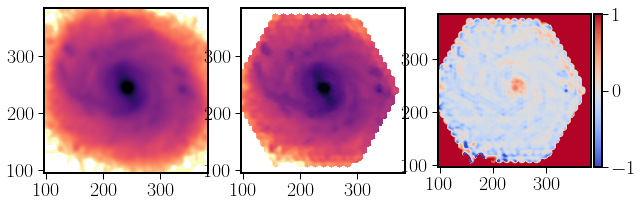

In [123]:
img_test=img_loop_dec
#plot_three(hdu.data,img_test,hdu.data-img_test)
diff_min=1e12
sigma_min=0.1
for sigma in arange(0.2,10,0.1):
    s_img = gaussian_filter(hdu.data,sigma=sigma)
    diff = img_test-s_img
    d=img_test.shape
    mean_diff = np.sum(np.abs(diff[img_test>0]/img_test[img_test>0])**2)/(d[0]*d[1])
    #print(sigma,mean_diff)
    if (mean_diff<diff_min):
        diff_min=mean_diff
        sigma_min=sigma
FWHM_PS = 1.0
print('sigma_min=',sigma_min,sigma_min*pix_size)
print('Final FWHM = ',np.sqrt(FWHM_PS**2+sigma_min*pix_size*2.354))
s_img = gaussian_filter(hdu.data,sigma=sigma_min)
plot_three(s_img,img_test,s_img-img_test)

<ipython-input-127-a2d8c26c1081>:23: RuntimeWarning: divide by zero encountered in true_divide
  rat_diff = diff/img_test


Niter= 1 sigma_min= 6.700000000000002 1.6750000405590915 Final FWHM =  2.223274633390149 ,std= 0.09831423879326874


<ipython-input-20-ae5863308741>:4: RuntimeWarning: invalid value encountered in log10
  ax[0].imshow(np.log10(img_in), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')
<ipython-input-20-ae5863308741>:6: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_now), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')


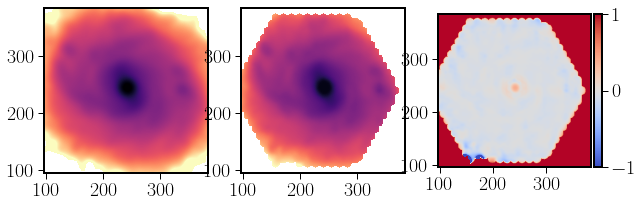

Niter= 6 sigma_min= 3.8000000000000016 0.950000023003664 Final FWHM =  1.798971943680786 ,std= 0.1971565459381518


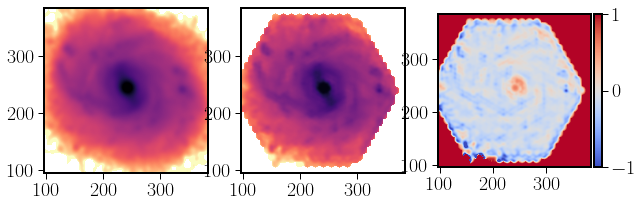

Niter= 11 sigma_min= 3.7000000000000015 0.9250000223983044 Final FWHM =  1.7825403369140371 ,std= 0.21500467365498524


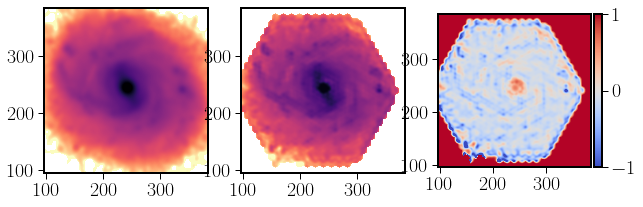

Niter= 16 sigma_min= 3.6000000000000014 0.9000000217929448 Final FWHM =  1.7659558463621314 ,std= 0.23207222747008246


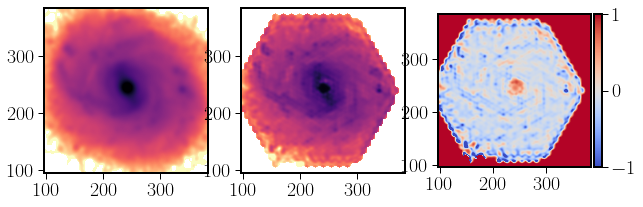

Niter= 21 sigma_min= 3.6000000000000014 0.9000000217929448 Final FWHM =  1.7659558463621314 ,std= 0.24745213014176654


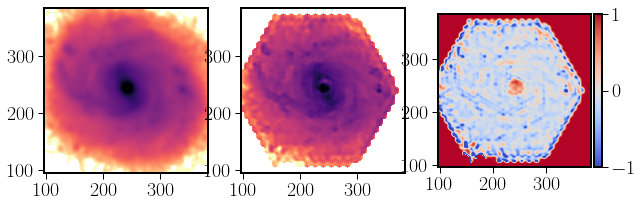

Niter= 26 sigma_min= 3.6000000000000014 0.9000000217929448 Final FWHM =  1.7659558463621314 ,std= 0.2651762104993067


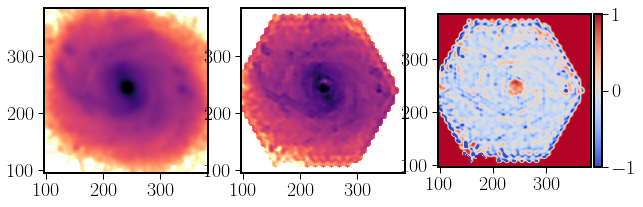

Niter= 31 sigma_min= 3.5000000000000013 0.8750000211875852 Final FWHM =  1.7492141235067753 ,std= 0.2779379055436756


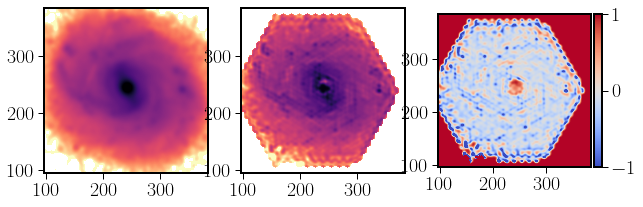

Niter= 36 sigma_min= 3.5000000000000013 0.8750000211875852 Final FWHM =  1.7492141235067753 ,std= 0.2874266679719917


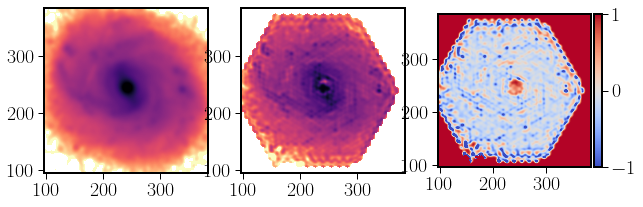

Niter= 41 sigma_min= 3.4000000000000012 0.8500000205822257 Final FWHM =  1.7323106096917376 ,std= 0.29711758133224225


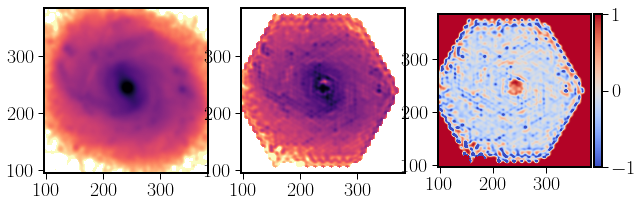

Niter= 46 sigma_min= 3.5000000000000013 0.8750000211875852 Final FWHM =  1.7492141235067753 ,std= 0.3065633166660968


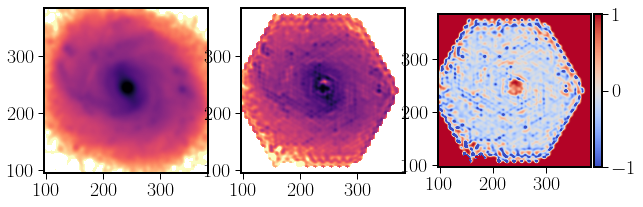

Niter= 51 sigma_min= 3.300000000000001 0.825000019976866 Final FWHM =  1.7152405216253324 ,std= 0.3133246724457331


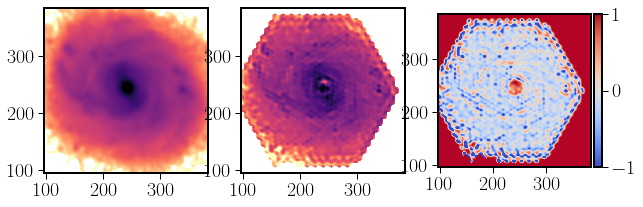

Niter= 56 sigma_min= 3.4000000000000012 0.8500000205822257 Final FWHM =  1.7323106096917376 ,std= 0.3230199134389266


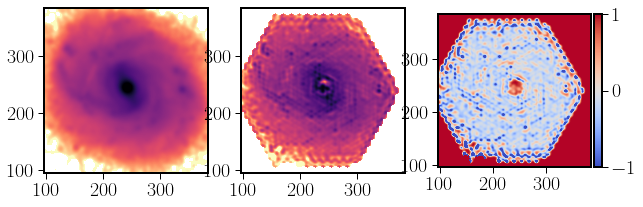

Niter= 61 sigma_min= 3.200000000000001 0.8000000193715064 Final FWHM =  1.697998835571016 ,std= 0.32695873504168155


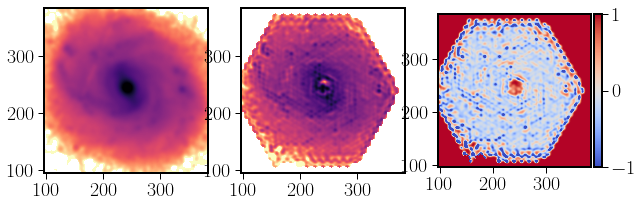

Niter= 66 sigma_min= 3.200000000000001 0.8000000193715064 Final FWHM =  1.697998835571016 ,std= 0.33290350810609004


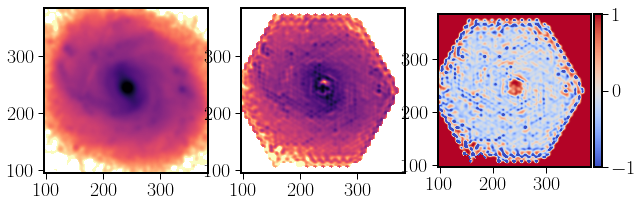

Niter= 71 sigma_min= 0.1 0.02500000060535957 Final FWHM =  1.0290043738609747 ,std= 0.33290350810609004


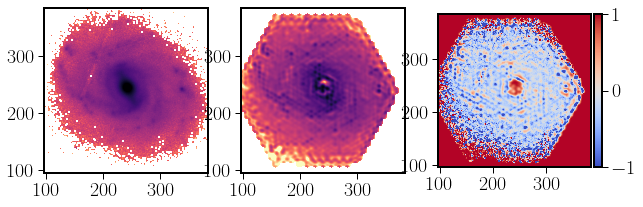

Niter= 76 sigma_min= 3.200000000000001 0.8000000193715064 Final FWHM =  1.697998835571016 ,std= 0.34167307746449804


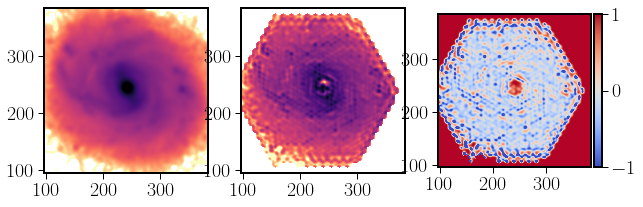

Niter= 81 sigma_min= 3.200000000000001 0.8000000193715064 Final FWHM =  1.697998835571016 ,std= 0.3453287426666844


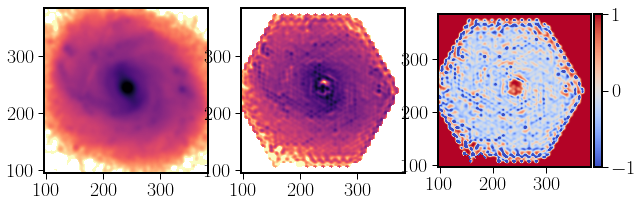

Niter= 86 sigma_min= 0.1 0.02500000060535957 Final FWHM =  1.0290043738609747 ,std= 0.3453287426666844


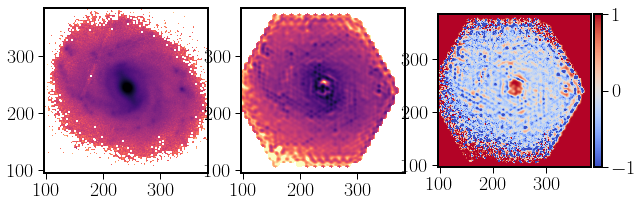

Niter= 91 sigma_min= 3.100000000000001 0.7750000187661469 Final FWHM =  1.6805802700780197 ,std= 0.35144390799767045


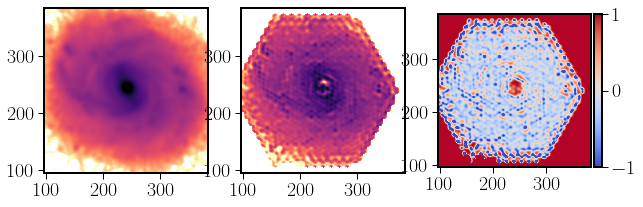

Niter= 96 sigma_min= 2.800000000000001 0.7000000169500682 Final FWHM =  1.6272062069388935 ,std= 0.3528212544101559


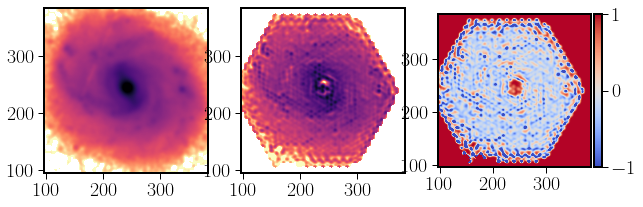

In [127]:
#
# Best number of iterations!
#
a_iter=[]
FWHMs_iter=[]
stdev_iter=[]
for niter in arange(1,100,5):
    img_loop_in = img_loop+img_loop.max() * 1E-5 * np.random.random(img_loop.shape)
    img_loop_dec = restoration.richardson_lucy(img_loop_in, img_psf_r,niter)#, num_iter=30)
    img_loop_dec = gaussian_filter(img_loop_dec,sigma=1.5)#*np.sum(img_Gauss)
    flux_ratio = np.sum(img_loop)/np.sum(img_loop_dec)
    img_loop_dec = img_loop_dec*flux_ratio
    img_loop_dec[img_loop==0]=0
    
    img_test=img_loop_dec
    diff_min=1e12
    sigma_min=0.1
    for sigma in arange(0.2,10,0.1):
        s_img = gaussian_filter(hdu.data,sigma=sigma)
        diff = img_test-s_img
        d=img_test.shape
        mean_diff = np.sum(np.abs(diff[img_test>0]/img_test[img_test>0])**2)/(d[0]*d[1])
        rat_diff = diff/img_test
        mask_now = (img_test>0) & (np.abs(diff)<0.5) & (np.abs(rat_diff)<1.5)
        std_diff = np.std(rat_diff[mask_now])
            
 #           diff[(img_test>0) & (np.abs(diff)<0.5)]/img_test[(img_test>0) & (np.abs(diff)<0.5)])
        if (mean_diff<diff_min):
            diff_min=mean_diff
            sigma_min=sigma
            std_min=std_diff
    FWHM_PS = 1.0
    print('Niter=',niter,'sigma_min=',sigma_min,sigma_min*pix_size,\
          'Final FWHM = ',np.sqrt(FWHM_PS**2+sigma_min*pix_size*2.354),',std=',std_min)
    s_img = gaussian_filter(hdu.data,sigma=sigma_min)
    plot_three(s_img,img_test,s_img-img_test)
    a_iter.append(niter)
    FWHMs_iter.append(np.sqrt(FWHM_PS**2+sigma_min*pix_size*2.354))
    stdev_iter.append(std_min)

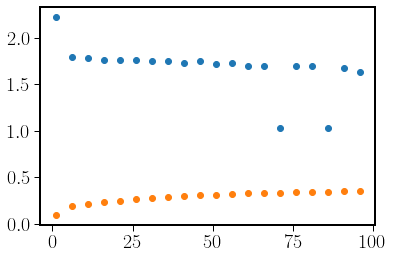

In [131]:
AR_iter=np.array(a_iter)
AR_FWHMs=np.array(FWHMs_iter)
AR_stddev=np.array(stdev_iter)
plt.scatter(a_iter,FWHMs_iter)
plt.scatter(a_iter,stdev_iter)


-4.0


<ipython-input-139-3bda90d0ff1e>:23: RuntimeWarning: divide by zero encountered in true_divide
  rat_diff = diff/img_test


Niter= 5 sigma_min= 3.9000000000000012 0.9750000236090235 Final FWHM =  1.8152548183590207 ,std= 0.1894308469498396


<ipython-input-20-ae5863308741>:4: RuntimeWarning: invalid value encountered in log10
  ax[0].imshow(np.log10(img_in), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')
<ipython-input-20-ae5863308741>:6: RuntimeWarning: divide by zero encountered in log10
  ax[1].imshow(np.log10(img_now), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')


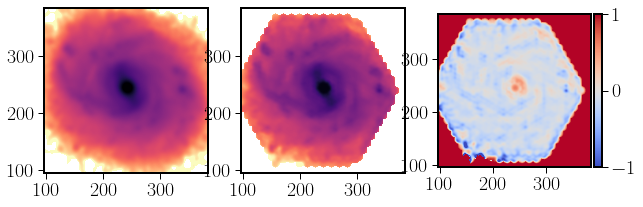

-3.75
Niter= 5 sigma_min= 3.9000000000000012 0.9750000236090235 Final FWHM =  1.8152548183590207 ,std= 0.18922385506636247


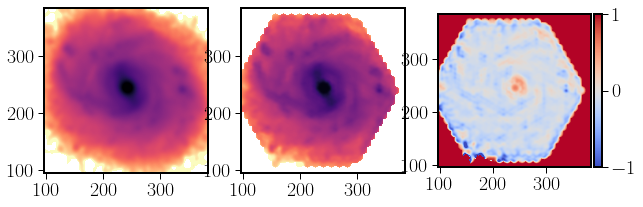

-3.5
Niter= 5 sigma_min= 3.9000000000000012 0.9750000236090235 Final FWHM =  1.8152548183590207 ,std= 0.18920590576821272


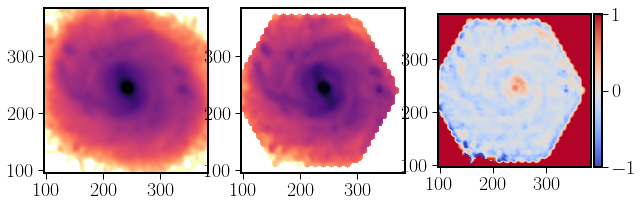

-3.25
Niter= 5 sigma_min= 3.9000000000000012 0.9750000236090235 Final FWHM =  1.8152548183590207 ,std= 0.18930557988858196


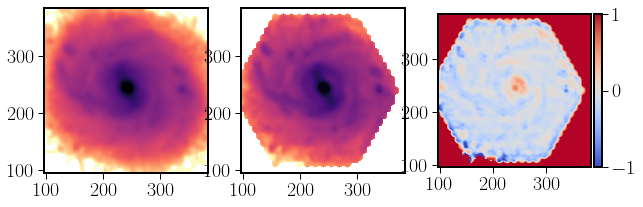

-3.0
Niter= 5 sigma_min= 3.9000000000000012 0.9750000236090235 Final FWHM =  1.8152548183590207 ,std= 0.18926682598091693


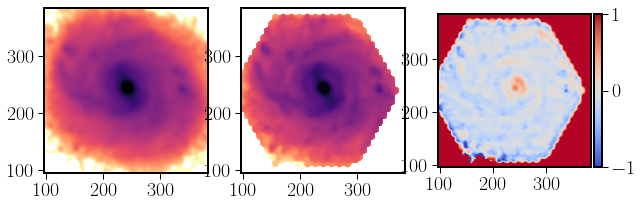

-2.75
Niter= 5 sigma_min= 3.9000000000000012 0.9750000236090235 Final FWHM =  1.8152548183590207 ,std= 0.18932826752065884


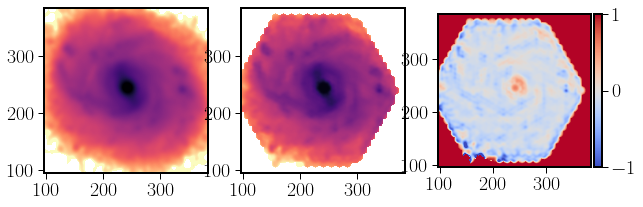

-2.5
Niter= 5 sigma_min= 4.000000000000001 1.000000024214383 Final FWHM =  1.831392928074327 ,std= 0.18992764124671171


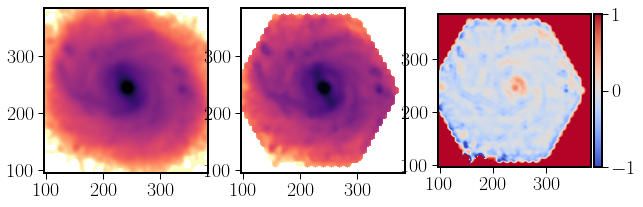

-2.25
Niter= 5 sigma_min= 4.000000000000001 1.000000024214383 Final FWHM =  1.831392928074327 ,std= 0.18999466152006442


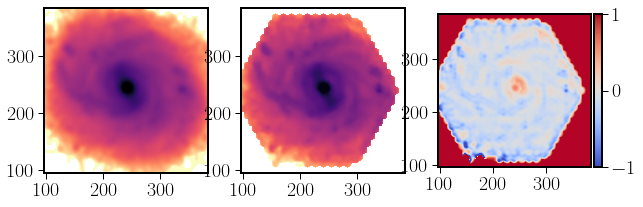

-2.0
Niter= 5 sigma_min= 4.000000000000001 1.000000024214383 Final FWHM =  1.831392928074327 ,std= 0.19036308488301337


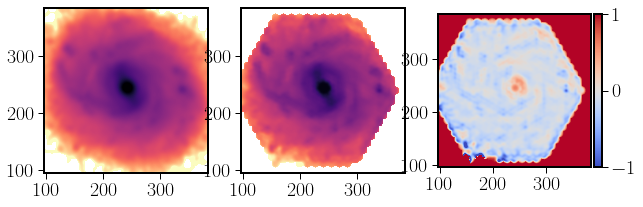

-1.75
Niter= 5 sigma_min= 4.000000000000001 1.000000024214383 Final FWHM =  1.831392928074327 ,std= 0.19034170990654192


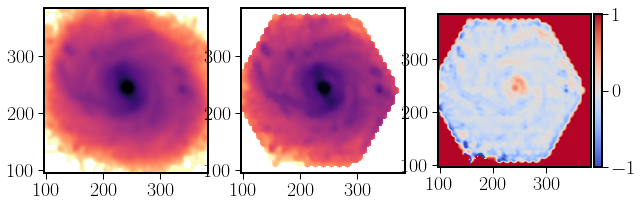

-1.5
Niter= 5 sigma_min= 4.000000000000001 1.000000024214383 Final FWHM =  1.831392928074327 ,std= 0.189573276550457


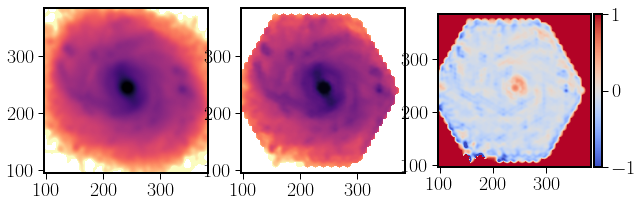

-1.25
Niter= 5 sigma_min= 9.900000000000002 2.475000059930598 Final FWHM =  2.6126902114633928 ,std= 0.24761194867210373


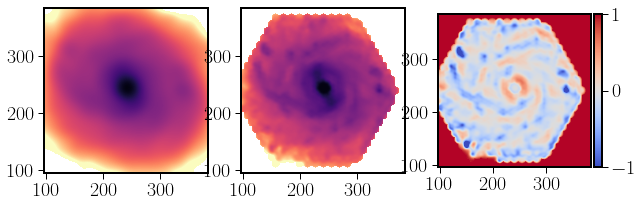

-1.0
Niter= 5 sigma_min= 0.1 0.02500000060535957 Final FWHM =  1.0290043738609747 ,std= 0.24761194867210373


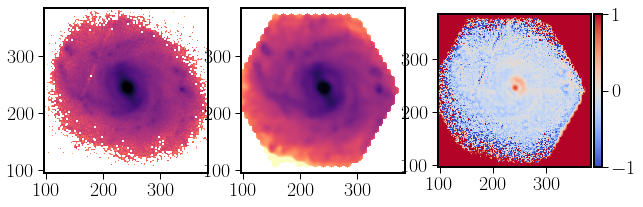

-0.75
Niter= 5 sigma_min= 0.1 0.02500000060535957 Final FWHM =  1.0290043738609747 ,std= 0.24761194867210373


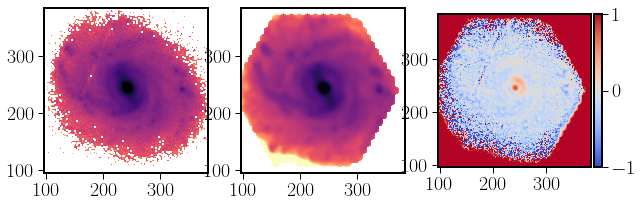

-0.5
Niter= 5 sigma_min= 0.1 0.02500000060535957 Final FWHM =  1.0290043738609747 ,std= 0.24761194867210373


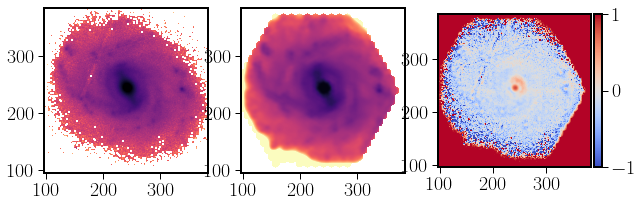

-0.25
Niter= 5 sigma_min= 0.1 0.02500000060535957 Final FWHM =  1.0290043738609747 ,std= 0.24761194867210373


<ipython-input-20-ae5863308741>:6: RuntimeWarning: invalid value encountered in log10
  ax[1].imshow(np.log10(img_now), cmap='magma_r', vmin=-3, vmax=0.15, origin='lower')


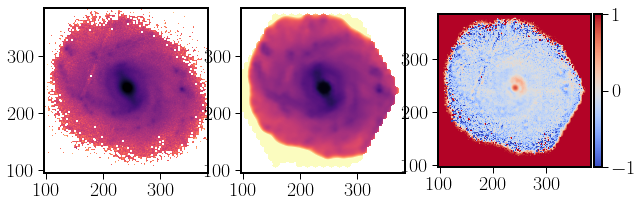

0.0
Niter= 5 sigma_min= 0.1 0.02500000060535957 Final FWHM =  1.0290043738609747 ,std= 0.24761194867210373


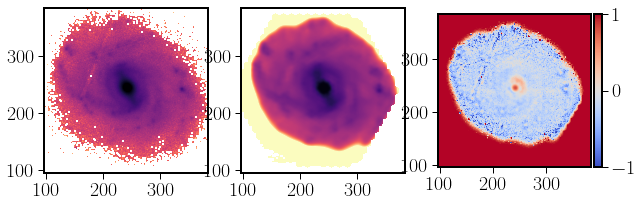

0.25
Niter= 5 sigma_min= 0.1 0.02500000060535957 Final FWHM =  1.0290043738609747 ,std= 0.24761194867210373


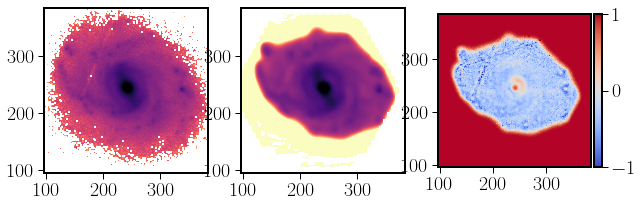

In [139]:
a_iter=[]
FWHMs_iter=[]
stdev_iter=[]
niter=5
for p_filter_epsilon in arange(-4,0.5,0.25):
    print(p_filter_epsilon)
    filter_epsilon=10**(p_filter_epsilon)
    img_loop_in = img_loop+img_loop.max() * 1E-5 * np.random.random(img_loop.shape)
    img_loop_dec = restoration.richardson_lucy(img_loop_in, img_psf_r,niter,filter_epsilon=filter_epsilon)#, num_iter=30)
    img_loop_dec = gaussian_filter(img_loop_dec,sigma=1.5)#*np.sum(img_Gauss)
    flux_ratio = np.sum(img_loop)/np.sum(img_loop_dec)
    img_loop_dec = img_loop_dec*flux_ratio
    img_loop_dec[img_loop==0]=0
    
    img_test=img_loop_dec
    diff_min=1e12
    sigma_min=0.1
    for sigma in arange(0.2,10,0.1):
        s_img = gaussian_filter(hdu.data,sigma=sigma)
        diff = img_test-s_img
        d=img_test.shape
        mean_diff = np.sum(np.abs(diff[img_test>0]/img_test[img_test>0])**2)/(d[0]*d[1])
        rat_diff = diff/img_test
        mask_now = (img_test>0) & (np.abs(diff)<0.5) & (np.abs(rat_diff)<1.5)
        std_diff = np.std(rat_diff[mask_now])
            
 #           diff[(img_test>0) & (np.abs(diff)<0.5)]/img_test[(img_test>0) & (np.abs(diff)<0.5)])
        if (mean_diff<diff_min):
            diff_min=mean_diff
            sigma_min=sigma
            std_min=std_diff
    FWHM_PS = 1.0
    print('Niter=',niter,'sigma_min=',sigma_min,sigma_min*pix_size,\
          'Final FWHM = ',np.sqrt(FWHM_PS**2+sigma_min*pix_size*2.354),',std=',std_min)
    s_img = gaussian_filter(hdu.data,sigma=sigma_min)
    plot_three(s_img,img_test,s_img-img_test)
    a_iter.append(filter_epsilon)
    FWHMs_iter.append(np.sqrt(FWHM_PS**2+sigma_min*pix_size*2.354))
    stdev_iter.append(std_min)

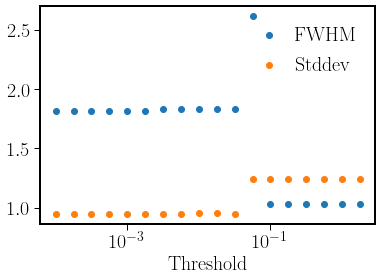

In [148]:
FAR_iter=np.array(a_iter)
FAR_FWHMs=np.array(FWHMs_iter)
FAR_stddev=np.array(stdev_iter)
plt.scatter(a_iter,FWHMs_iter,label='FWHM')
plt.scatter(a_iter,5*FAR_stddev,label='Stddev')
plt.xscale('log')
plt.xlabel('Threshold')
ax = plt.gca()
ax.legend()

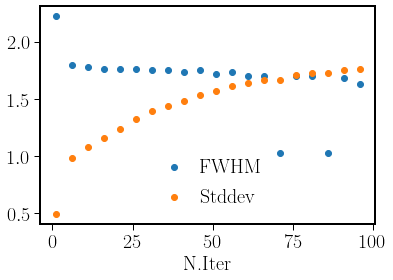

In [150]:
plt.scatter(AR_iter,AR_FWHMs,label='FWHM')
plt.scatter(AR_iter,5*AR_stddev,label='Stddev')
#plt.xscale('log')
plt.xlabel('N.Iter')
ax = plt.gca()
ax.legend()

In [ ]:
print(img_Gauss_dec[img_Gauss_dec>0])

In [ ]:
slope=2.5
img,weights = inter_map_IDW(phot_table,radius,[0,0],[1,1],[480,480],slope=slope,\
                            radius_limit=5/pix_size)

In [ ]:
img_map_old = inter_map(phot_table,radius,[0,0],[1,1],[480,480],method='cubic')
img_map = inter_map(phot_table,radius,[0,0],[1,1],[480,480],method='cubic')
img_map_new = inter_map(phot_table_final,new_radius,[0,0],[1,1],[480,480],method='linear')
plot_four(hdu.data,phot_table,img_map,img_map_new)


In [ ]:
slope=0.5
img_loop,weights_loop = inter_map_IDW(phot_table_center_est,new_radius,[0,0],[1,1],[480,480],slope=slope,\
                            radius_limit=0.5*5/pix_size)

In [ ]:
#slope=2.5
#img_loop,weights_loop = inter_map_IDW(phot_table_center_est,\
#                                      new_radius,[0,0],[1,1],[480,480],slope=slope,\
#                            radius_limit=5/pix_size)
#print('slope=',slope)
img_test=img_loop_dec
#plot_three(hdu.data,img_test,hdu.data-img_test)
diff_min=1e12
sigma_min=0.1
for sigma in arange(0.2,10,0.1):
    s_img = gaussian_filter(hdu.data,sigma=sigma)
    diff = img_test-s_img
    d=img_test.shape
    mean_diff = np.sum(np.abs(diff[img_test>0]/img_test[img_test>0])**2)/(d[0]*d[1])
    #print(sigma,mean_diff)
    if (mean_diff<diff_min):
        diff_min=mean_diff
        sigma_min=sigma
FWHM_PS = 1.0
print('sigma_min=',sigma_min,sigma_min*pix_size)
print('Final FWHM = ',np.sqrt(FWHM_PS**2+sigma_min*pix_size*2.354))
s_img = gaussian_filter(hdu.data,sigma=sigma_min)
plot_three(s_img,img_test,s_img-img_test)

In [ ]:
img_test=img_map_new
#plot_three(hdu.data,img_test,hdu.data-img_test)
diff_min=1e12
sigma_min=0.1
for sigma in arange(0.2,5,0.1):
    s_img = gaussian_filter(hdu.data,sigma=sigma)
    diff = img_test-s_img
    mean_diff = np.sum(np.abs(diff[img_all>0.1]))
    if (mean_diff<diff_min):
        diff_min=mean_diff
        sigma_min=sigma
FWHM_PS = 1.0
print('sigma_min=',sigma_min,sigma_min*pix_size)
print('Final FWHM = ',np.sqrt(FWHM_PS**2+sigma_min*pix_size*2.354))
s_img = gaussian_filter(hdu.data,sigma=sigma_min)
plot_three(s_img,img_test,s_img-img_test)

In [ ]:
slope=2.5
img_org,weights_org = inter_map_IDW(phot_table,\
                                      radius,[0,0],[1,1],[480,480],slope=slope,\
                            radius_limit=5/pix_size)
print('slope=',slope)
img_test=img_org
#plot_three(hdu.data,img_test,hdu.data-img_test)
diff_min=1e12
sigma_min=0.1
for sigma in arange(0.2,5,0.1):
    s_img = gaussian_filter(hdu.data,sigma=sigma)
    diff = img_test-s_img
    mean_diff = np.sum(np.abs(diff[img_all>0.1]))
    if (mean_diff<diff_min):
        diff_min=mean_diff
        sigma_min=sigma
FWHM_PS = 1.0
print('sigma_min=',sigma_min,sigma_min*pix_size)
print('Final FWHM = ',np.sqrt(FWHM_PS**2+sigma_min*pix_size*2.354))
s_img = gaussian_filter(hdu.data,sigma=sigma_min)
plot_three(s_img,img_test,s_img-img_test)

In [ ]:
for slope in arange(0.5,5,0.25):
    img_loop,weights_loop = inter_map_IDW(phot_table_center_est,\
                                          new_radius,[0,0],[1,1],[480,480],slope=slope,\
                            radius_limit=0.5*5/pix_size)
    print('slope=',slope)
    img_test=img_loop
    #plot_three(hdu.data,img_test,hdu.data-img_test)
    diff_min=1e12
    sigma_min=0.1
    for sigma in arange(0.2,5,0.1):
        s_img = gaussian_filter(hdu.data,sigma=sigma)
        diff = img_test-s_img
        mean_diff = np.sum(np.abs(diff[img_all>0.1]))
        std_diff = np.std()
        if (mean_diff<diff_min):
            diff_min=mean_diff
            sigma_min=sigma
    FWHM_PS = 1.0
    print('sigma_min=',sigma_min,sigma_min*pix_size)
    print('Final FWHM = ',np.sqrt(FWHM_PS**2+sigma_min*pix_size*2.354))
    s_img = gaussian_filter(hdu.data,sigma=sigma_min)
    plot_three(s_img,img_test,s_img-img_test)
    
    

In [ ]:
kernel = np.array([[0, -1, 0],
                    [-1, 5, -1],
                    [0, -1, 0]])

kernel = -(1 / 256.0) * np.array([[1, 4, 6, 4, 1],
                                   [4, 16, 24, 16, 4],
                                   [6, 24, -476, 24, 6],
                                   [4, 16, 24, 16, 4],
                                   [1, 4, 6, 4, 1]])
img_test=img_map_old #convolve2d(img_loop, kernel)[0:ny,0:nx]

#img_test=img_loop #denoise_tv_bregman(img_loop,1)

plot_three(hdu.data,img_test,hdu.data-img_test)
diff_min=1e12
sigma_min=0.1
for sigma in arange(0.2,5,0.1):
    s_img = gaussian_filter(hdu.data,sigma=sigma)
    diff = img_test-s_img
    mean_diff = np.sum(np.abs(diff[img_all>0.1]))
    if (mean_diff<diff_min):
        diff_min=mean_diff
        sigma_min=sigma
FWHM_PS = 1.5
print('sigma_min=',sigma_min,sigma_min*pix_size)
print('Final FWHM = ',np.sqrt(FWHM_PS**2+sigma_min*pix_size*2.354))
s_img = gaussian_filter(hdu.data,sigma=sigma_min)
plot_three(s_img,img_test,s_img-img_test)

In [ ]:
print('Interpolation Done')
img_map_old = inter_map(phot_table,radius,[0,0],[1,1],[480,480],method='cubic')
img_map = inter_map(phot_table,radius,[0,0],[1,1],[480,480],method='cubic')
img_map_new = inter_map(phot_table_final,new_radius,[0,0],[1,1],[480,480],method='cubic')
plot_four(hdu.data,phot_table,img_map,img_map_new)


In [64]:
#
# Loop
#
aper_in = CircularAperture(points_WCS, radius)
aper_center = CircularAperture(points_WCS, new_radius)
aper_ring = CircularAnnulus(points_WCS,new_radius,radius)
#img_map,weights_loop = inter_map_IDW(phot_table,radius,[0,0],[1,1],[480,480],slope=1.5,\
#                            radius_limit=0.5*5/pix_size)

#inter_map(phot_table,radius,[0,0],[1,1],[480,480],method='nearest')
phot_table_in = aperture_photometry(img_all, aper_in,\
                                           method='subpixel',subpixels=5)
phot_table_center_in = aperture_photometry(img_all, aper_center,\
                                           method='subpixel',subpixels=5)
phot_table_ring_out = aperture_photometry(img_all, aper_ring,\
                                          method='subpixel',subpixels=5)
phot_table_center_est = phot_table_center_in.copy()
phot_table_center_est['aperture_sum']=phot_table['aperture_sum']-phot_table_ring_out['aperture_sum']
delta=phot_table_center_in['aperture_sum']-phot_table_center_est['aperture_sum']
mean_delta=np.nanmean(delta/phot_table_center_in['aperture_sum'])
std_delta=np.nanstd(delta/phot_table_center_in['aperture_sum'])
img0=img_map
print('start=',mean_delta,std_delta)

n_iter=0
while(np.abs(mean_delta)>0.0001):
    img_loop = inter_map(phot_table_center_est,new_radius,[0,0],[1,1],[480,480],method='cubic')
    #img_loop,weights_loop = inter_map_IDW(phot_table_center_est,\
    #                                      new_radius,[0,0],[1,1],[480,480],slope=1.5,\
    #                        radius_limit=0.5*5/pix_size)
    plt.imshow(np.log10(img_loop), cmap='gray_r', vmin=-3, vmax=0.15, origin='lower')
    plt.show()
    phot_table_ring_out = aperture_photometry(img_loop, aper_ring, method='subpixel',subpixels=5)
    phot_table_center_est['aperture_sum']=phot_table_in['aperture_sum']-\
    phot_table_ring_out['aperture_sum']
    delta=phot_table_center_in['aperture_sum']-phot_table_center_est['aperture_sum']
    mean_delta=np.nanmean(delta/phot_table_center_in['aperture_sum'])
    std_delta=np.nanstd(delta/phot_table_center_in['aperture_sum'])

    n_iter = n_iter+1
    print(n_iter,mean_delta,std_delta)
    

NameError: name 'img_all' is not defined

In [ ]:
fig = plt.figure(figsize=(5,5))
ax = fig.add_subplot(111)
ax.scatter(phot_table_center_in['aperture_sum'],phot_table_center_est['aperture_sum'])
ax.set_xlim([0,200])
ax.set_ylim([0,200])
ax.set_aspect('equal', adjustable='box')


In [ ]:
fig = plt.figure(figsize=(5,5))
ax = fig.add_subplot(111)
ax.scatter(phot_table_center_in['aperture_sum'],delta)
ax.set_xlim([0,200])
ax.set_ylim([-30,30])
print(np.nanmean(delta/phot_table_center_in['aperture_sum']),np.nanstd(delta/phot_table_center_in['aperture_sum']))